In [2]:
!pip3 install impyute

In [3]:
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import math
import re
import sys
import csv

In [4]:
#3.1 数据可视化和摘要
#·数据摘要
#给出数据的属性
def columns_info(df,show_shape=True,new_df=None):
    print(df.info())
    if show_shape: print(df.shape)
    if new_df is not None:
        print();
        print(new_df.info())
        if show_shape: print(new_df.shape)
    return None

In [5]:
#标称属性的处理，给出每个可能取值的频数。（直方图）
def nominal_summary(df,nominal_index=None,head_n=50,new_df=None):
    # 根据频数绘制直方图
    def bar_describe(data,new_data=None,head_n=50):
        if new_data is None:
            plt.figure(figsize=(24,8))
            plt.title(data.name, fontsize=30)    
            plt.bar(data.index[:head_n], data.values[:head_n])
            plt.xticks(rotation=90)
            plt.show()
        else:
            plt.figure(figsize=(24,8))
            plt.title(data.name, fontsize=30)    
            plt.bar(data.index[:head_n], data.values[:head_n],color='b',label=data.name)
            plt.bar(new_data.index[:head_n],new_data.values[:head_n],color='r',label='new_'+new_data.name)
            plt.xticks(rotation=90)
            plt.legend()
            plt.show()
            
    # 获取数据中每个取值的频数
    frequency = {key: df[key].value_counts() for key in df.columns}
    new_frequency = None
    if new_df is not None:
        new_frequency = {key: new_df[key].value_counts() for key in new_df.columns}
        
    if nominal_index is None:
        nominal_index=df.columns
    if new_frequency is None:
        for key in nominal_index:
            bar_describe(data=frequency[key],new_data=None,head_n=head_n)
    else:
        for key in nominal_index:
            bar_describe(data=frequency[key],new_data=new_frequency[key],head_n=head_n)
    return None


In [6]:
#数值属性的处理，给出5数概括及缺失值的个数。（盒图）
def numerical_summary(df,numerical_index=None,new_df=None):
    shape=df.shape # 样本总数
    # 格式化输出五数概括和缺失值个数
    def data_describe(data,new_data=None):
        print('descriptive statistics (%s):' % data.name)
        info=data.describe()
        new_info = None
        if new_data is not None:
            new_info = new_data.describe()
            
        print("Min: {:.4f}\tQ1(25%): {:.4f} \tQ2(50%): {:.4f} \tQ3(75%): {:.4f} \tMax: {:.4f}".format(
            info['min'],info['25%'],info['50%'],info['75%'],info['max']))
        print("Missing: {:d}".format(int(shape[0] - info['count'])))
        print()
        
        if new_info is not None:
            print("\033[95m new Min: {:.4f}\tQ1(25%): {:.4f} \tQ2(50%): {:.4f} \tQ3(75%): {:.4f} \tMax: {:.4f} \033[0m".format(
            new_info['min'],new_info['25%'],new_info['50%'],new_info['75%'],new_info['max']))
            print("\033[95m new Missing: {:d} \033[0m".format(int(shape[0] - new_info['count'])))
            print()
        
    if numerical_index is None:
        print("Please provide the numerical index needed to be describe")
        return None
    
    # 获取数值属性的5数概况和缺失值个数
    if new_df is None:
        for key in numerical_index:
            data_describe(df[key])
    else:
        for key in numerical_index:
            data_describe(df[key],new_df[key])
    
    return None

In [7]:
#数据可视化（使用直方图、盒图等检查数据分布及离群点）

    
# 绘制数值属性的直方图，盒图及散点图
def box_plot(df,ylabel=None,new_df=None):
    if new_df is None:
        plt.figure()
        plt.title('Boxplot')
        sns.boxplot(y=ylabel,data=df,palette='Set2')
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Boxplot')
        sns.boxplot(y=ylabel,data=df,palette='Set1')

        plt.subplot(122)
        plt.title('new_Boxplot')
        sns.boxplot(y=ylabel,data=new_df,palette='Set2')
    
def hist_plot(df,ylabel=None,bins=10,new_df=None):
    if ylabel is None:
        print("Please provide ylabel")
        return None
    if new_df is None:
        plt.figure()
        plt.title('Histogram')
        sns.distplot(a=df[ylabel].dropna(),bins=bins,hist=True,kde=False)
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Histogram')
        sns.distplot(a=df[ylabel].dropna(),bins=bins,hist=True,kde=False)

        plt.subplot(122)
        plt.title('new_Histogram')
        sns.distplot(a=new_df[ylabel].dropna(),bins=bins,hist=True,kde=False)

def scatter_plot(df,xlabel=None,ylabel=None,new_df=None):
    if xlabel is None or ylabel is None:
        print("Please provide xlabel and ylabel")
        return None
    if new_df is None:
        plt.figure()
        plt.title('Scatter plot')
        sns.scatterplot(x=xlabel,y=ylabel,data=df)
    else:
        plt.figure(figsize=(14,8))
        plt.subplot(121)
        plt.title('Scatter plot')
        sns.scatterplot(x=xlabel,y=ylabel,data=df)

        plt.subplot(122)
        plt.title('new Scatter plot')
        sns.scatterplot(x=xlabel,y=ylabel,data=new_df)

def viz_pairs(df,ylabel=None,xlabel=None,bins=20,new_df=None):
    if ylabel is None or xlabel is None:
        print("Please provide xlabel and ylabel")
        return None
    box_plot(df,ylabel=ylabel,new_df=new_df)
    box_plot(df,ylabel=xlabel,new_df=new_df)
    hist_plot(df,ylabel=ylabel,bins=bins,new_df=new_df)
    hist_plot(df,ylabel=xlabel,bins=bins,new_df=new_df)
    scatter_plot(df,xlabel=xlabel,ylabel=ylabel,new_df=new_df)

In [8]:
"""
数据缺失值处理

    1. 将缺失部分剔除
    2. 用最高频率值来填补缺失值
    3. 通过属性的相关关系来填补缺失值
    4. 通过数据对象之间的相似性来填补缺失值
"""    
#将缺失部分剔除
def miss_drop(df):
    return df.dropna(axis=0,inplace=False)

#用最高频率值来填补缺失值
def miss_mode_fill(df):
    cpdf = df.copy(deep=True)
    for key in cpdf.columns:
        cpdf[key].fillna(cpdf[key].mode()[0],inplace=True)
    return cpdf

#通过属性的相关关系来填补缺失值
from sklearn.preprocessing import OrdinalEncoder
from sklearn.ensemble import RandomForestRegressor
def attr_corr_fill(df,miss_index,complete_index):
    def set_miss_values(df, complete_index):
        enc_label = OrdinalEncoder()
        enc_fea = OrdinalEncoder()
        missing_index = complete_index[0]
    
        # 将已有的数值数据（无NaN）放入随机森林回归中
        train_df = df[complete_index]
        # 已知值和未知值
        known_values = np.array(train_df[train_df[missing_index].notnull()])
        unknow_values = np.array(train_df[train_df[missing_index].isnull()])
    
        # y是已知的缺失值
        y = known_values[:, 0].reshape(-1, 1)
        enc_label.fit(y)
        y = enc_label.transform(y)
    
        # X是特征
        X = known_values[:, 1:]
        test_X = unknow_values[:, 1:]
        all_X = np.row_stack((X,test_X))
        enc_fea.fit(all_X)
        X = enc_fea.transform(X)
    
        # 填充
        rfr = RandomForestRegressor(random_state=0, n_estimators=2000, n_jobs=-1)
        rfr.fit(X, y.ravel())
        # 预测
        predicted_values = rfr.predict(enc_fea.transform(unknow_values[:, 1:]))
        predicted_values = enc_label.inverse_transform(predicted_values.reshape(-1, 1))
        # 填充预测值
        df.loc[ (df[missing_index].isnull()), missing_index] = predicted_values
    return df
  
    cpdf = df.copy(deep=True)
    for i in range(0,len(miss_index)):
        complete_index.insert(0,miss_index[i])
        cpdf = set_miss_values(cpdf,complete_index)
    return cpdf


from impyute.imputation.cs import fast_knn
#通过数据对象之间的相似性来填补缺失值
def obj_corr_fill(df,numerical_index,k=30):
    sys.setrecursionlimit(100000) #Increase the recursion limit of the OS
  # start the KNN training
    cpdf = df.copy(deep=True)
    imputed_training=fast_knn(cpdf[numerical_index].values, k=k)
    imputed_training=pd.DataFrame(data=imputed_training,columns=numerical_index)
    cpdf[numerical_index] = imputed_training[numerical_index]
    return cpdf

## 数据集1-Wine Reviews
<p>
130k wine reviews with variety, location, winery, price, and description.
</p>
* winemag-data-130k-v2.csv contains 10 columns and 130k rows of wine reviews.
* winemag-data_first150k.csv contains 10 columns and 150k rows of wine reviews.

## winemag-data_first150k.csv
### 1、数据可视化和摘要

In [9]:
wine_reviews_dir = "wine"
winemag150k=pd.read_csv(wine_reviews_dir+"/winemag-data_first150k.csv",sep=',',header='infer',index_col=0)

In [10]:
columns_info(winemag150k)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150925 non-null  object 
 1   description  150930 non-null  object 
 2   designation  105195 non-null  object 
 3   points       150930 non-null  int64  
 4   price        137235 non-null  float64
 5   province     150925 non-null  object 
 6   region_1     125870 non-null  object 
 7   region_2     60953 non-null   object 
 8   variety      150930 non-null  object 
 9   winery       150930 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 12.7+ MB
None
(150930, 10)


In [ ]:
# 标称属性
nominal_index = ['country', 'designation', 'province', 'region_1', 'region_2', 'variety', 'winery']
# 数值属性
numerical_index = ['points', 'price']
nominal_summary(winemag150k,new_df=None,nominal_index=nominal_index,head_n=50)
numerical_summary(winemag150k,new_df=None,numerical_index=numerical_index)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=None)

### 2、数据缺失的处理
#### （1）将缺失部分剔除

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150925 non-null  object 
 1   description  150930 non-null  object 
 2   designation  105195 non-null  object 
 3   points       150930 non-null  int64  
 4   price        137235 non-null  float64
 5   province     150925 non-null  object 
 6   region_1     125870 non-null  object 
 7   region_2     60953 non-null   object 
 8   variety      150930 non-null  object 
 9   winery       150930 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 12.7+ MB
None
(150930, 10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39241 entries, 0 to 150916
Data columns (total 10 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   country      39241 non-null  object 
 1   description  39241 non-null  object 
 2   designat

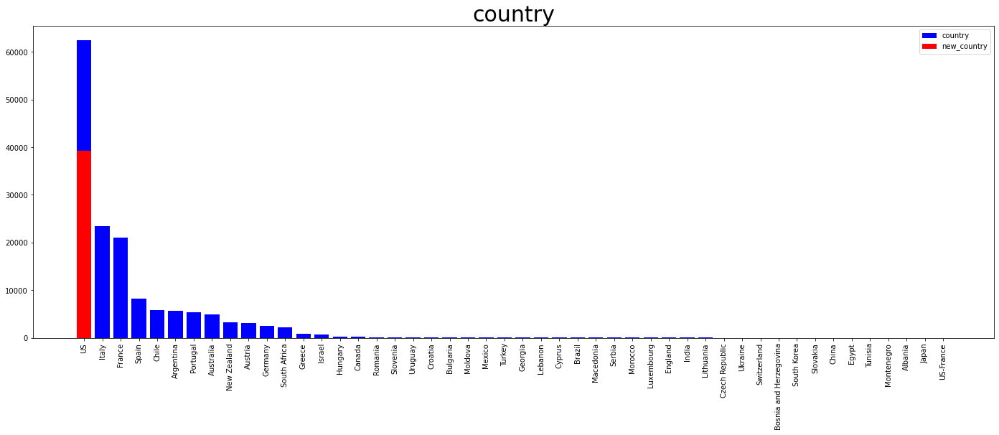

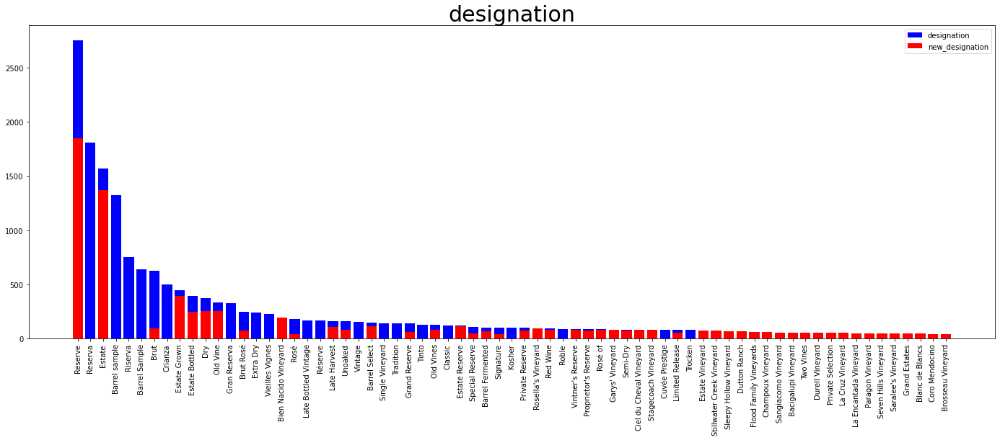

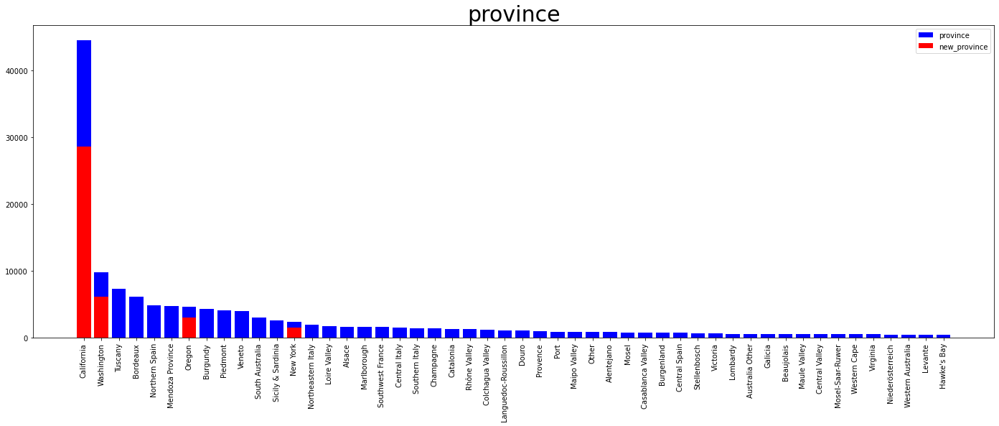

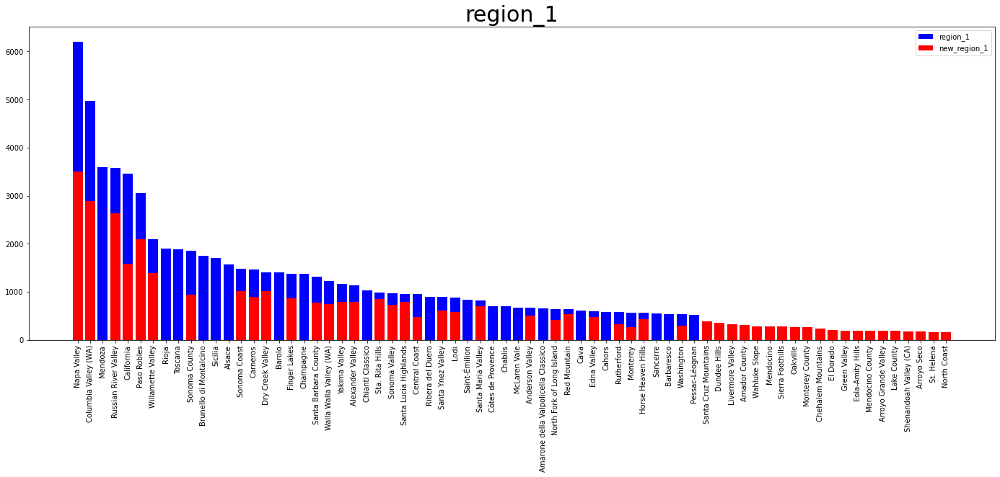

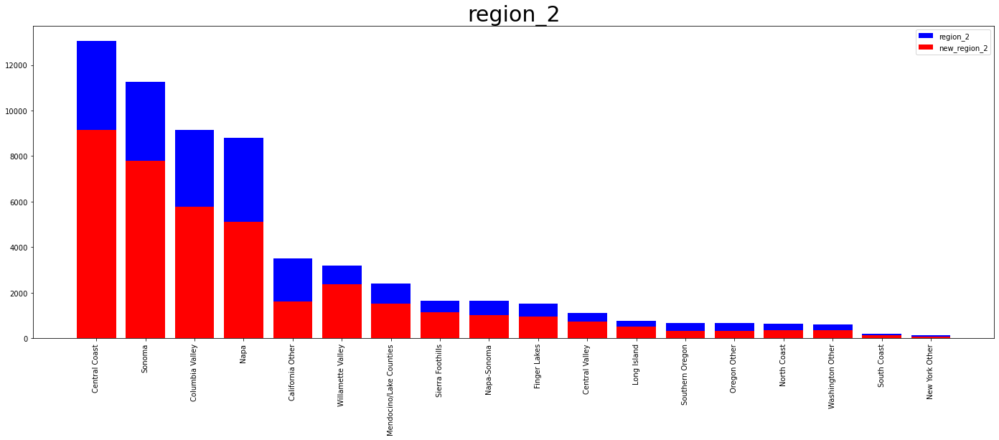

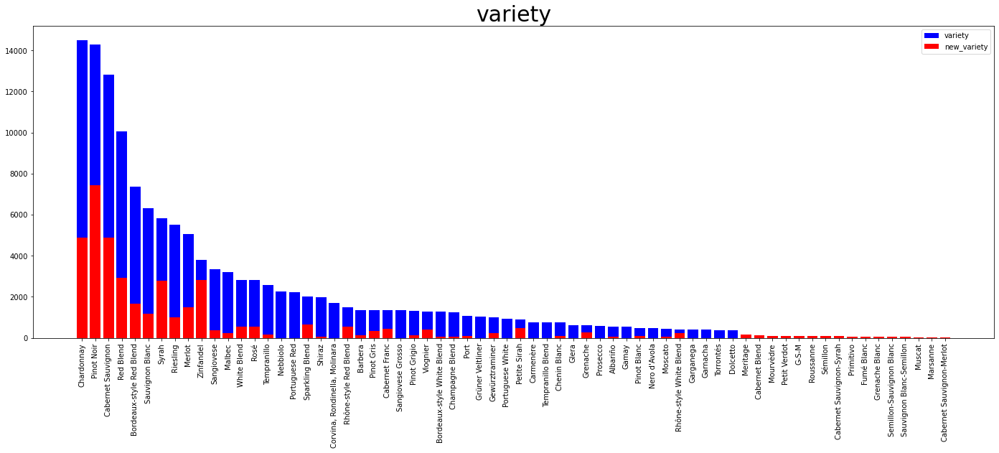

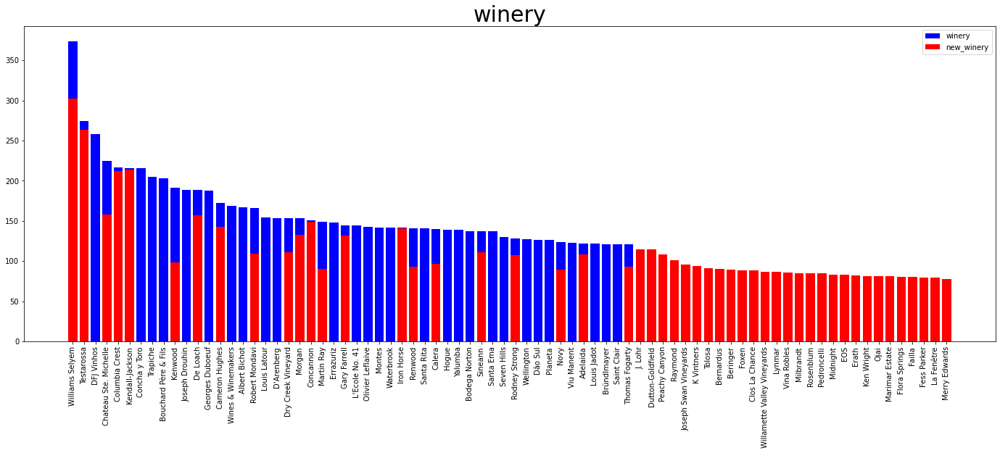

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000 
 new Missing: 111689 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000
Missing: 13695

 new Min: 4.0000	Q1(25%): 22.0000 	Q2(50%): 32.0000 	Q3(75%): 45.0000 	Max: 2013.0000 
 new Missing: 111689 



C:\Users\sure\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


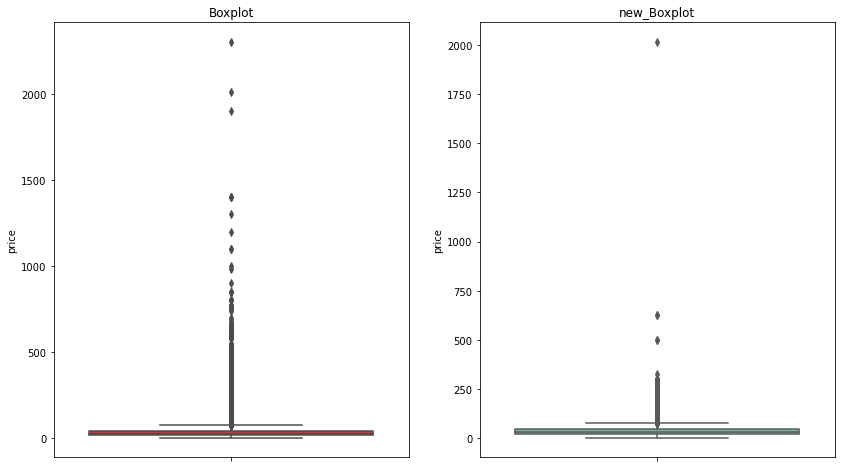

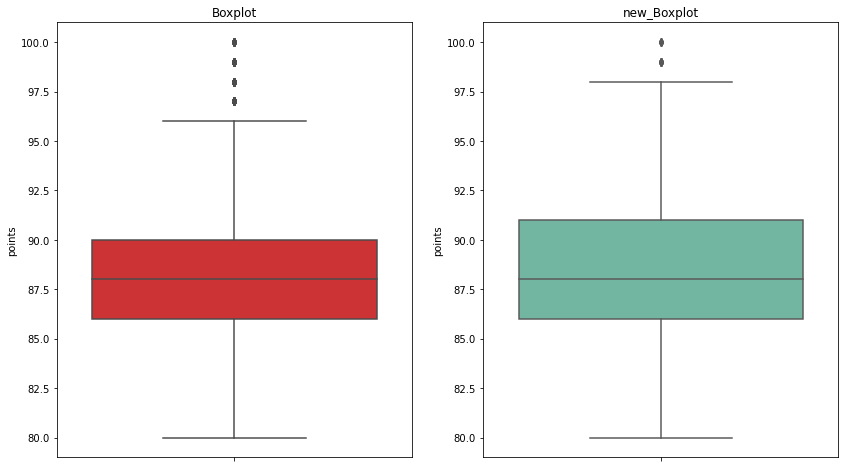

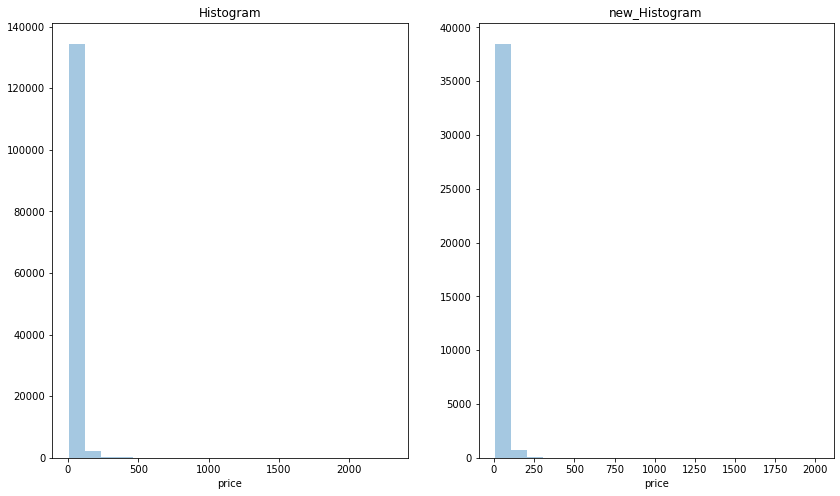

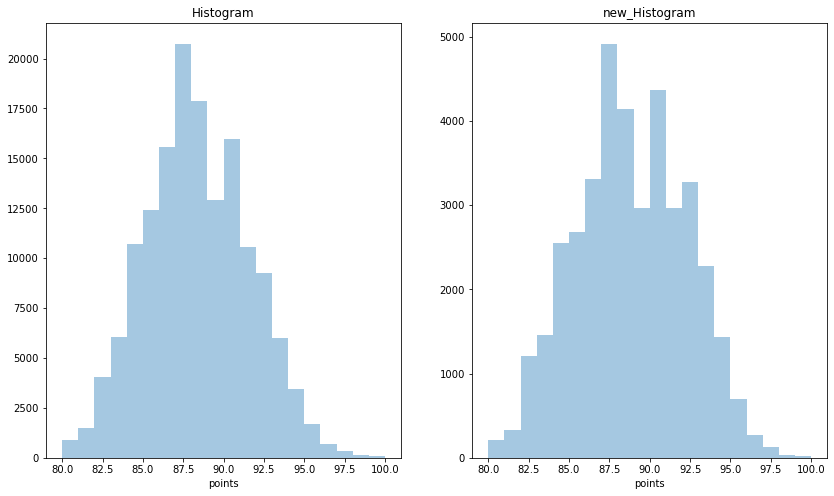

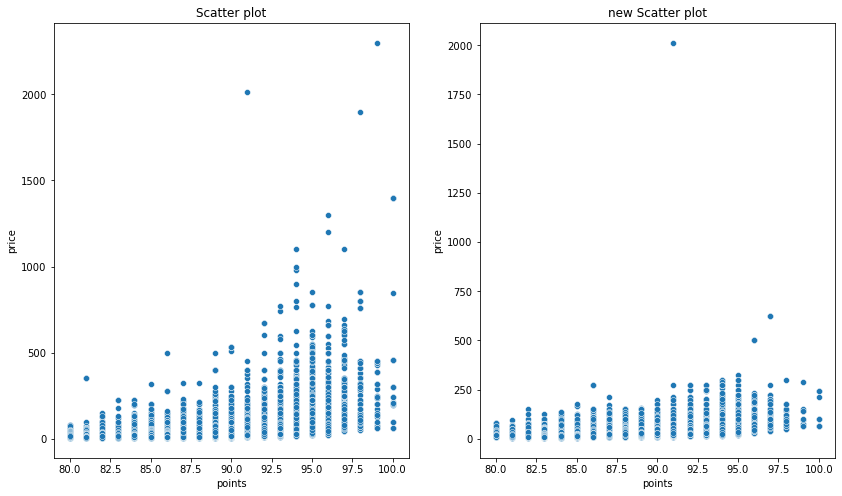

In [12]:
dw150k=miss_drop(winemag150k)
columns_info(winemag150k,show_shape=True,new_df=dw150k)
nominal_summary(winemag150k,nominal_index=nominal_index,head_n=50,new_df=dw150k)
numerical_summary(winemag150k,numerical_index=numerical_index,new_df=dw150k)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=dw150k)

#### （2）用最高频率值来填补缺失值

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150925 non-null  object 
 1   description  150930 non-null  object 
 2   designation  105195 non-null  object 
 3   points       150930 non-null  int64  
 4   price        137235 non-null  float64
 5   province     150925 non-null  object 
 6   region_1     125870 non-null  object 
 7   region_2     60953 non-null   object 
 8   variety      150930 non-null  object 
 9   winery       150930 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 12.7+ MB
None
(150930, 10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150930 non-null  object 
 1   description  150930 non-null  object 
 2   des

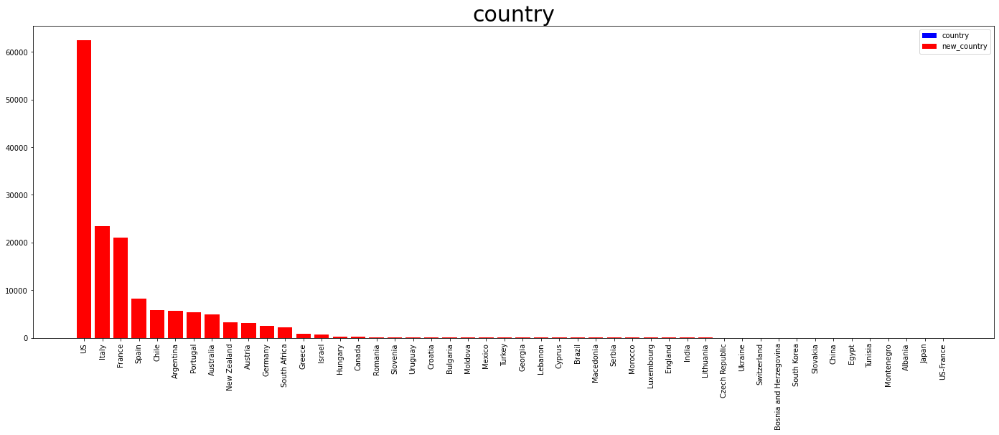

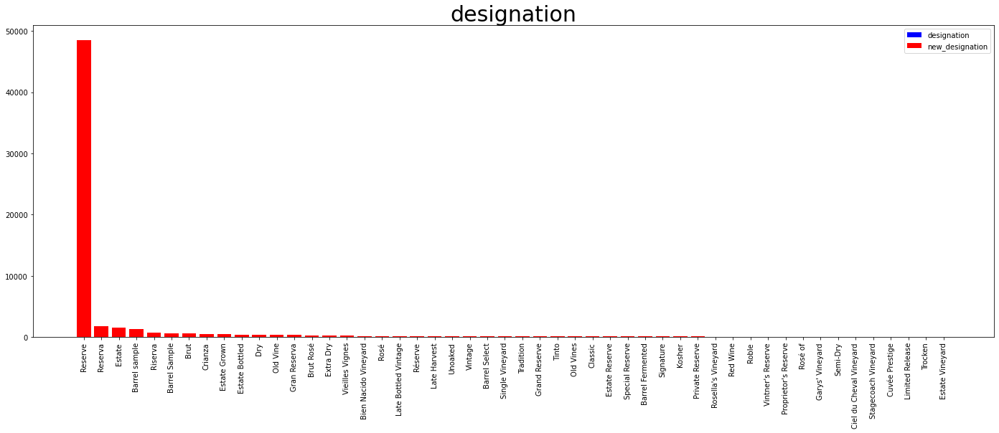

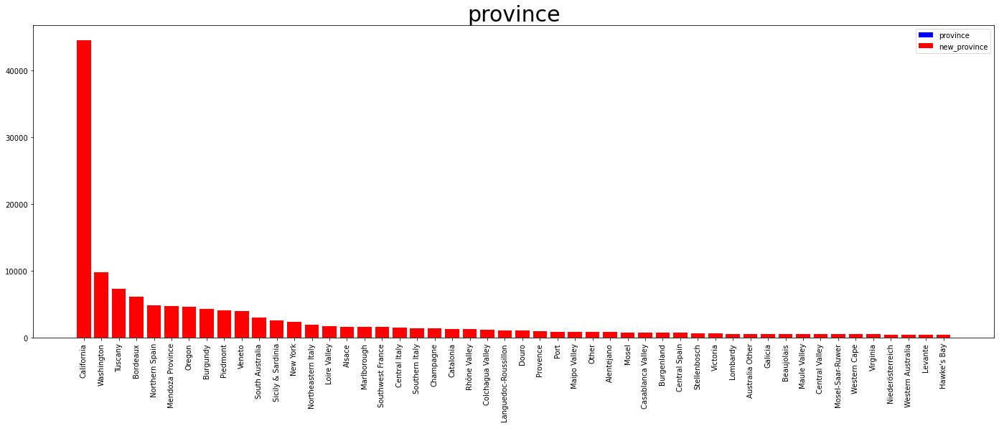

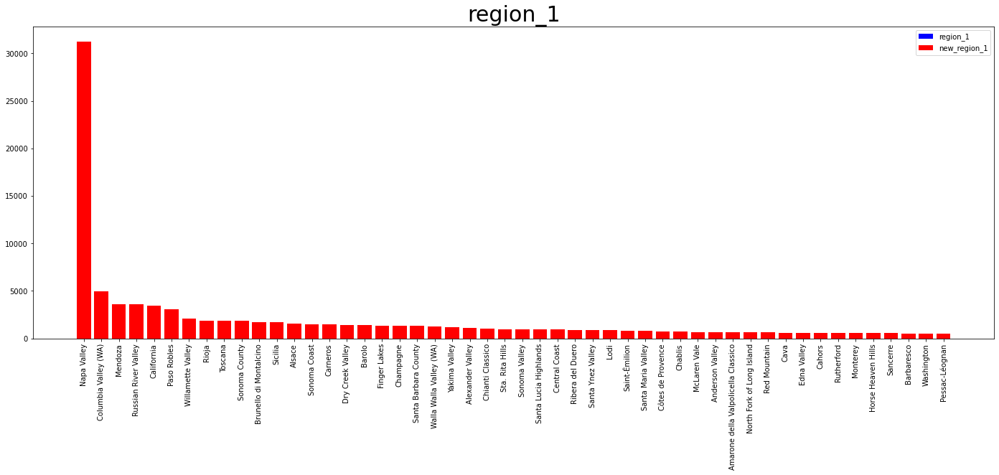

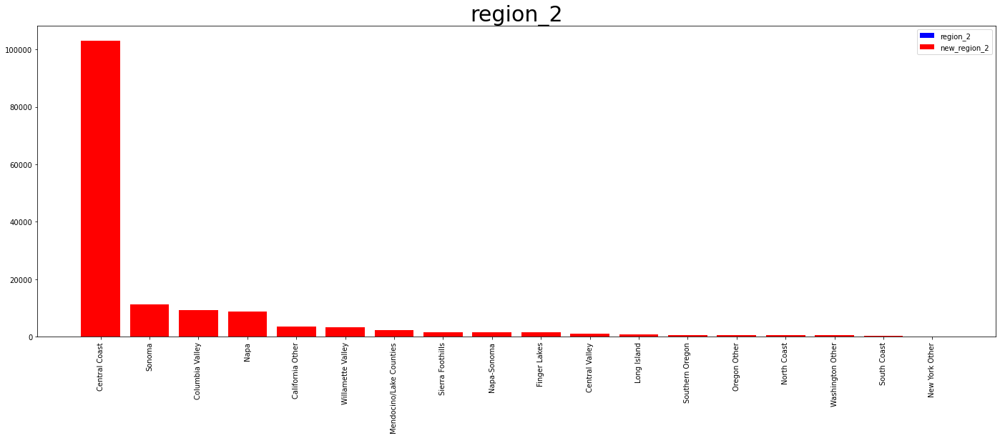

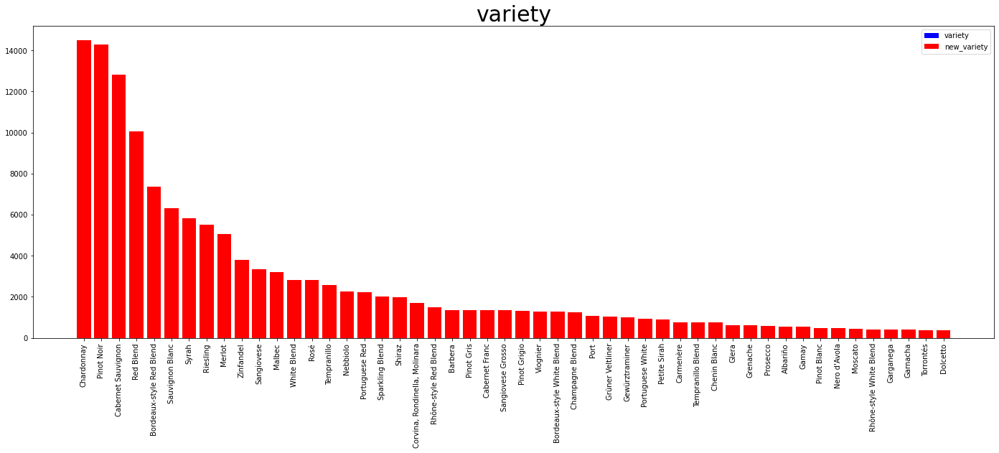

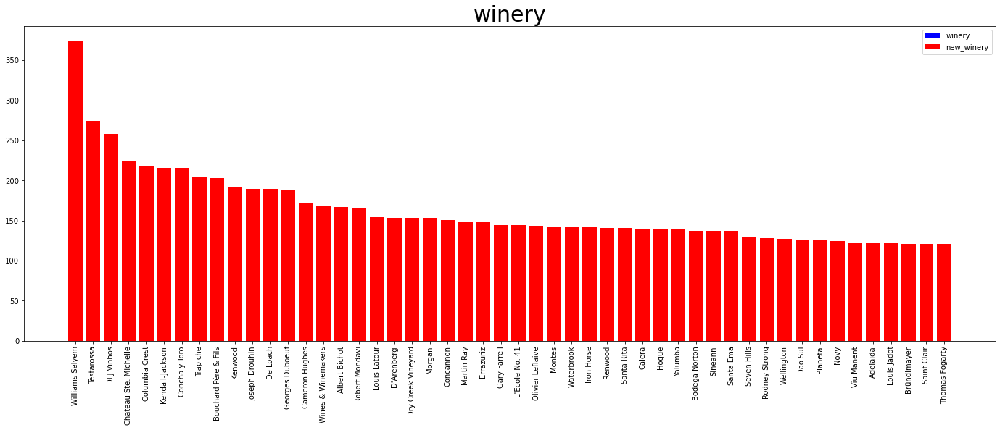

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000 
 new Missing: 0 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000
Missing: 13695

 new Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 22.0000 	Q3(75%): 38.0000 	Max: 2300.0000 
 new Missing: 0 



C:\Users\sure\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


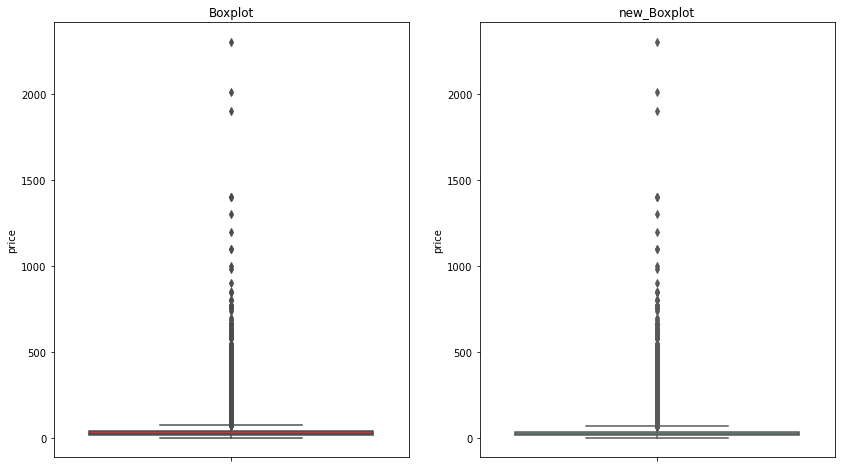

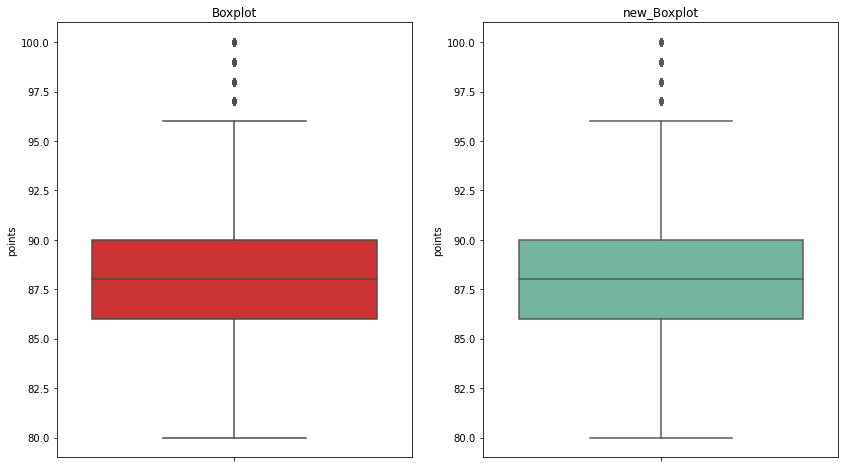

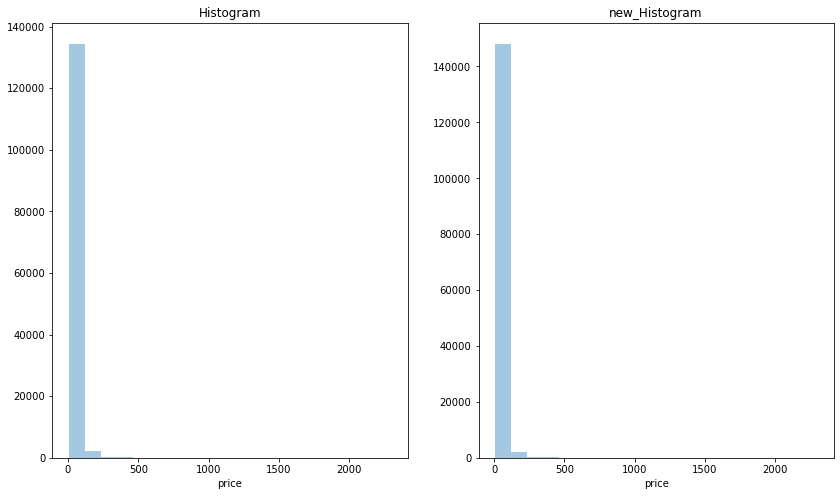

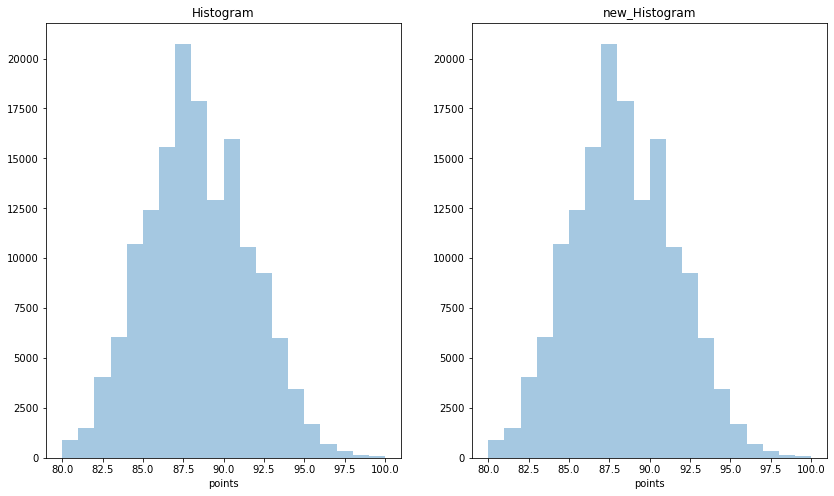

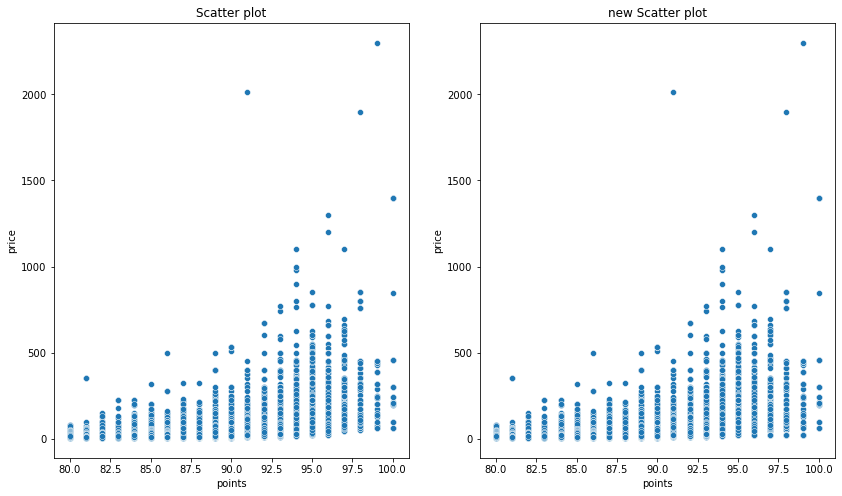

In [13]:
md150k=miss_mode_fill(winemag150k)
columns_info(winemag150k,show_shape=True,new_df=md150k)
nominal_summary(winemag150k,nominal_index=nominal_index,head_n=50,new_df=md150k)
numerical_summary(winemag150k,numerical_index=numerical_index,new_df=md150k)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=md150k)

#### （3）通过属性的相关关系来填补缺失值

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150925 non-null  object 
 1   description  150930 non-null  object 
 2   designation  105195 non-null  object 
 3   points       150930 non-null  int64  
 4   price        137235 non-null  float64
 5   province     150925 non-null  object 
 6   region_1     125870 non-null  object 
 7   region_2     60953 non-null   object 
 8   variety      150930 non-null  object 
 9   winery       150930 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 12.7+ MB
None
(150930, 10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150925 non-null  object 
 1   description  150930 non-null  object 
 2   des

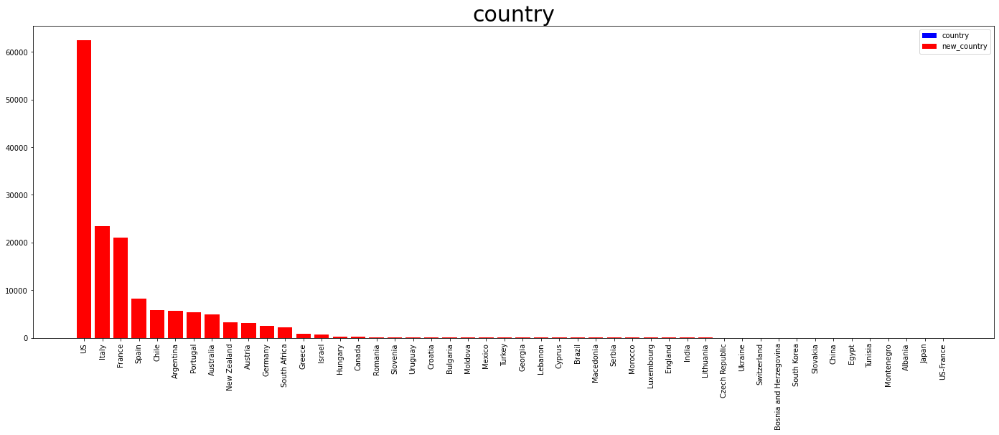

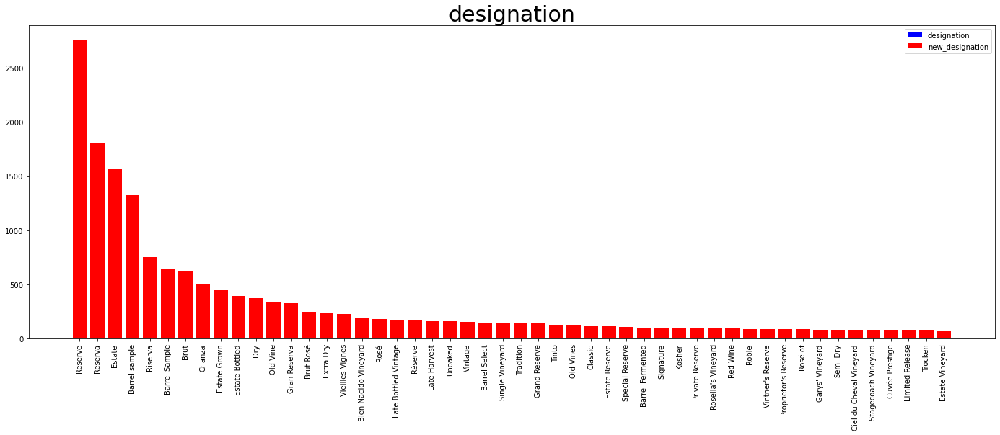

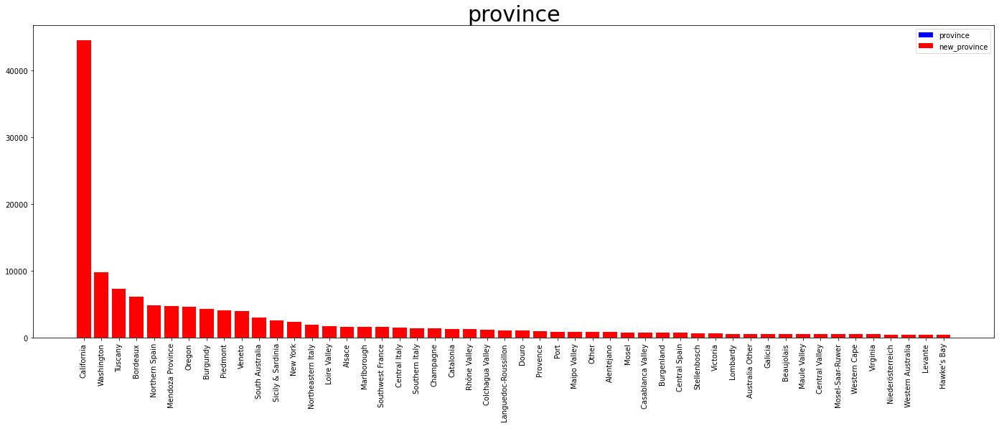

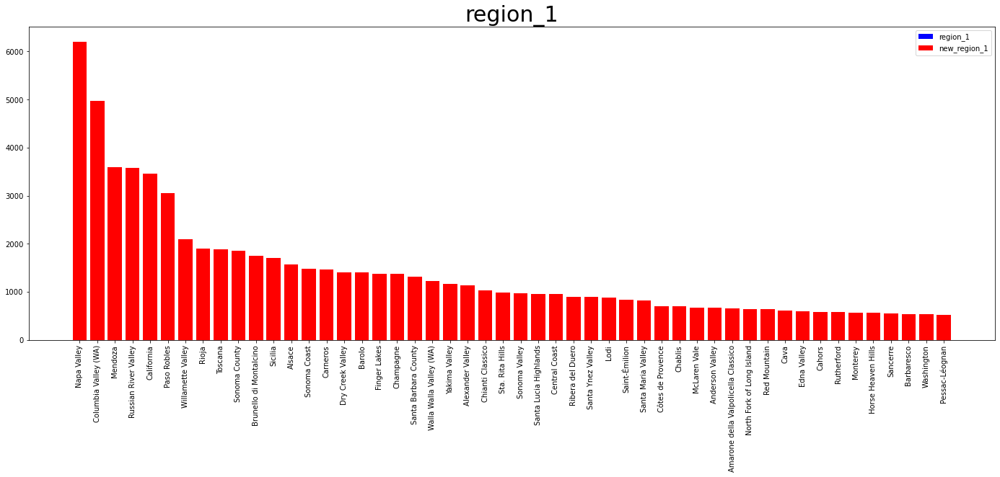

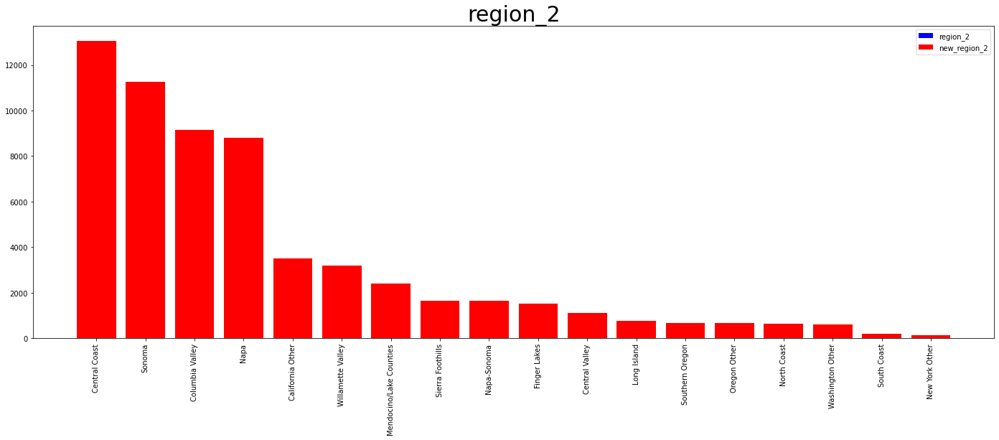

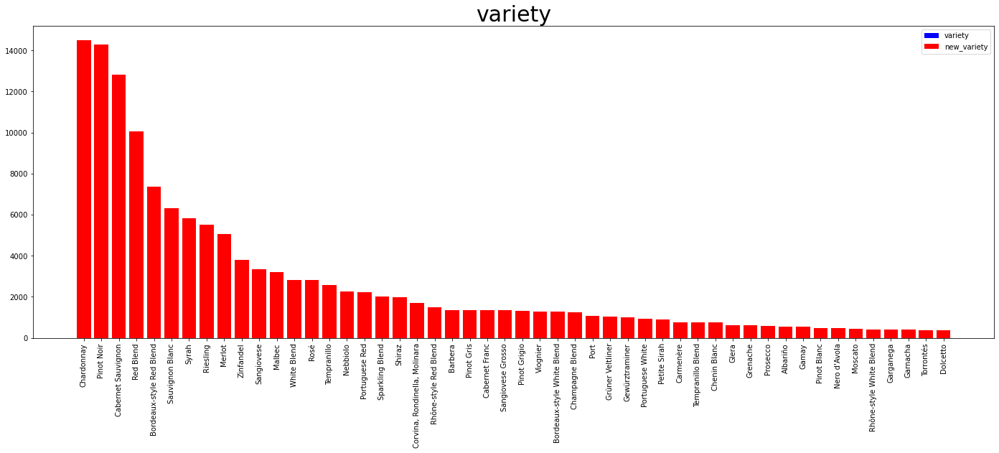

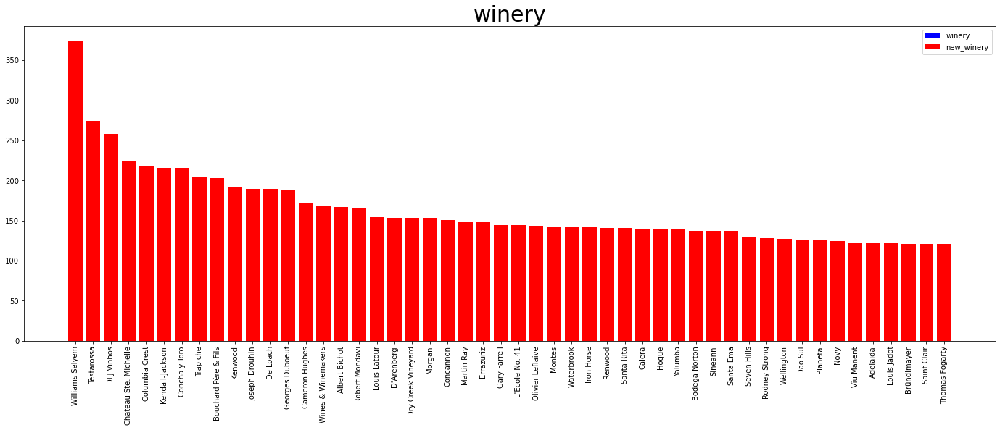

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000 
 new Missing: 0 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000
Missing: 13695

 new Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000 
 new Missing: 13695 



C:\Users\sure\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


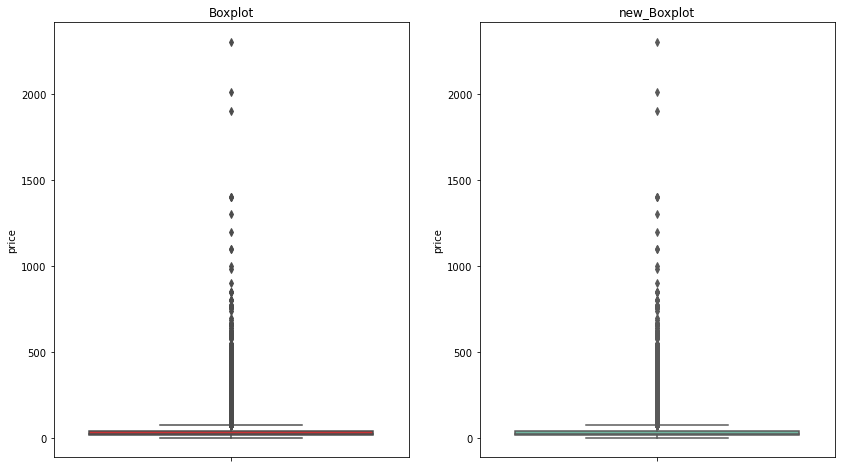

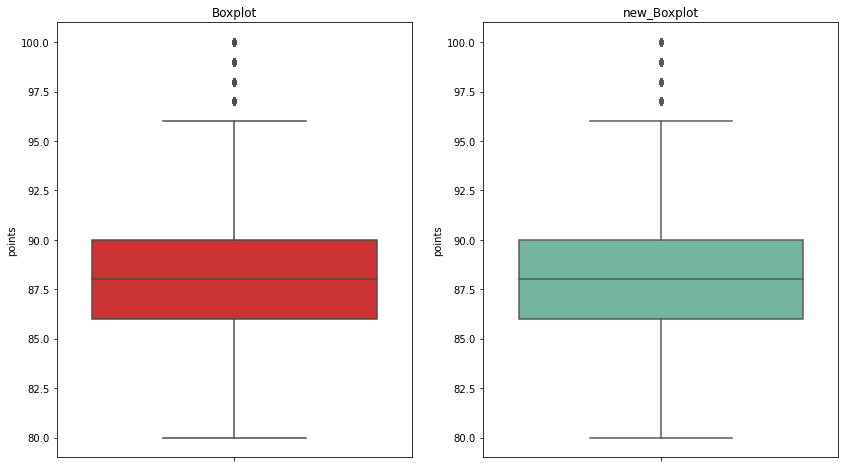

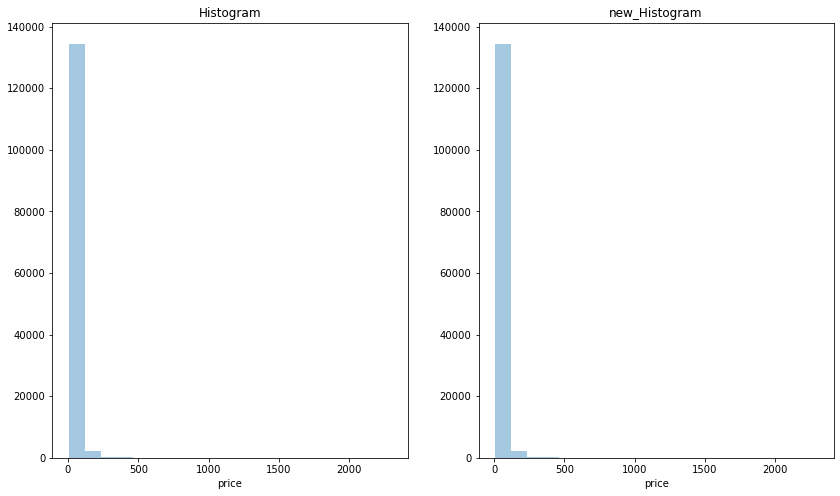

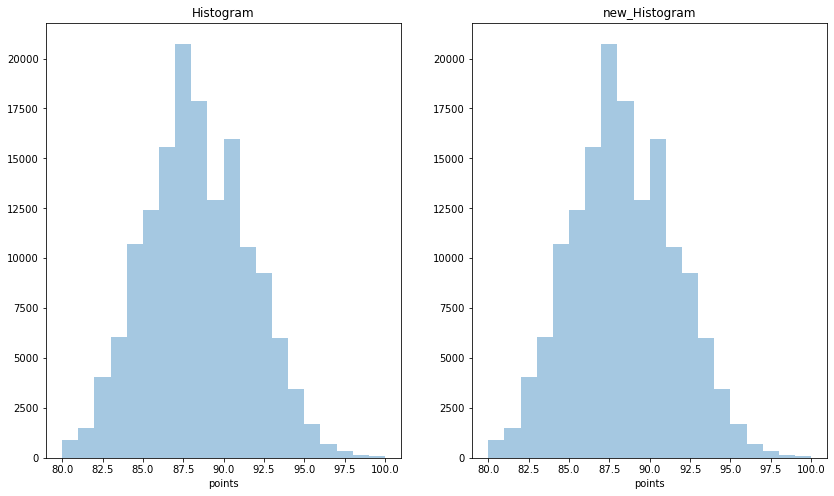

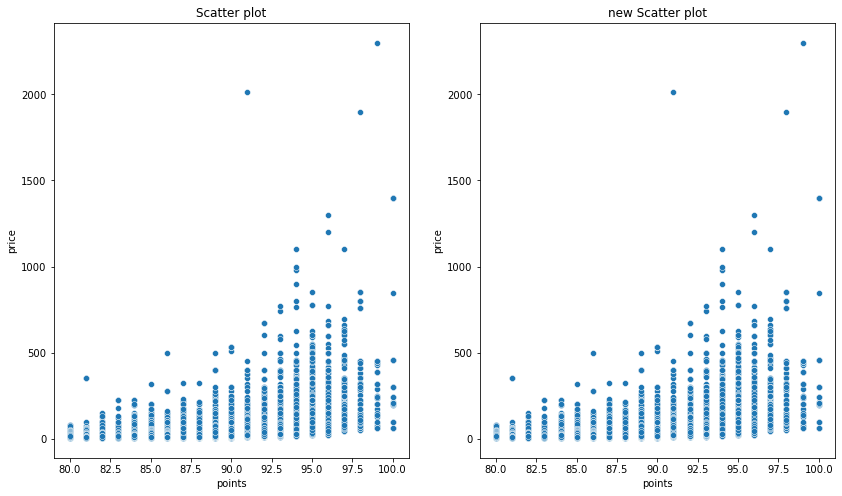

In [14]:
miss_index=['country','designation','price','province','region_1','region_2']
comp_index=['description','points','variety','winery']
att150k=attr_corr_fill(winemag150k,miss_index=miss_index,complete_index=comp_index)
columns_info(winemag150k,show_shape=True,new_df=att150k)
nominal_summary(winemag150k,nominal_index=nominal_index,head_n=50,new_df=att150k)
numerical_summary(winemag150k,numerical_index=numerical_index,new_df=att150k)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=att150k)

#### （4）通过数据对象之间的相似性来填补缺失值

C:\Users\sure\Anaconda3\lib\site-packages\impyute\imputation\cs\fast_knn.py:113: RuntimeWarning: invalid value encountered in true_divide
  weights = distances/np.sum(distances)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150925 non-null  object 
 1   description  150930 non-null  object 
 2   designation  105195 non-null  object 
 3   points       150930 non-null  int64  
 4   price        137235 non-null  float64
 5   province     150925 non-null  object 
 6   region_1     125870 non-null  object 
 7   region_2     60953 non-null   object 
 8   variety      150930 non-null  object 
 9   winery       150930 non-null  object 
dtypes: float64(1), int64(1), object(8)
memory usage: 12.7+ MB
None
(150930, 10)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 150930 entries, 0 to 150929
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   country      150925 non-null  object 
 1   description  150930 non-null  object 
 2   des

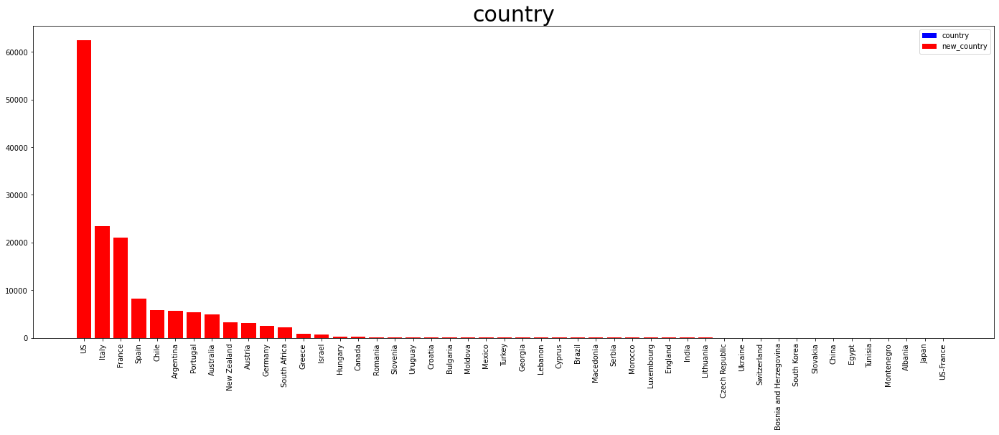

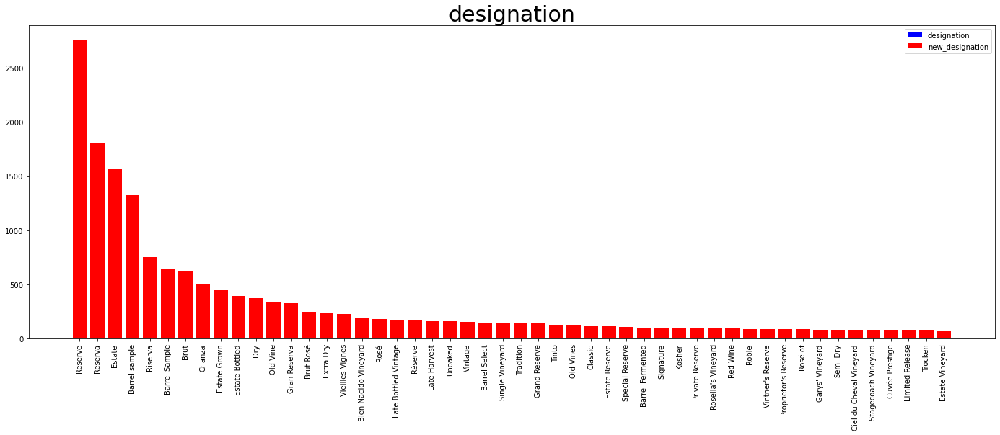

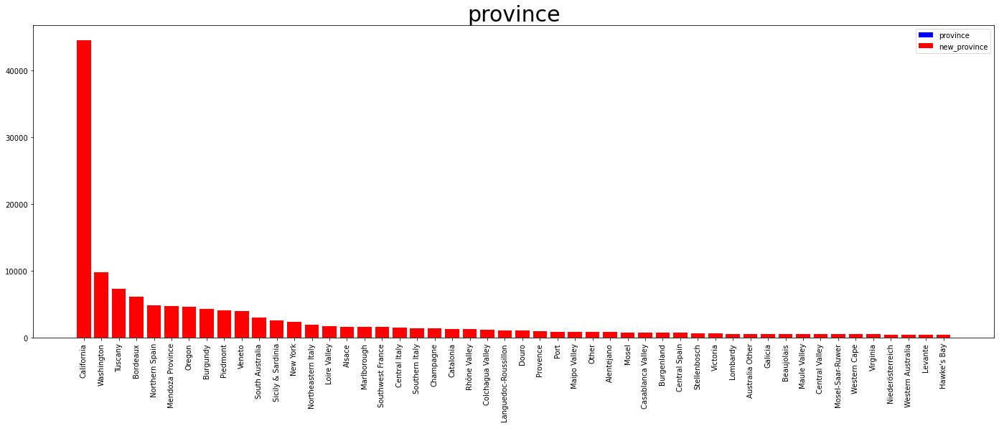

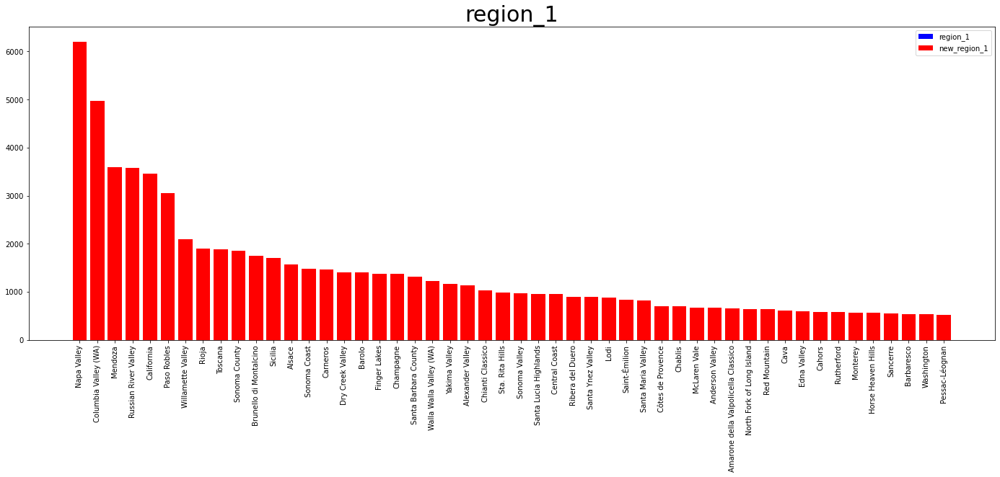

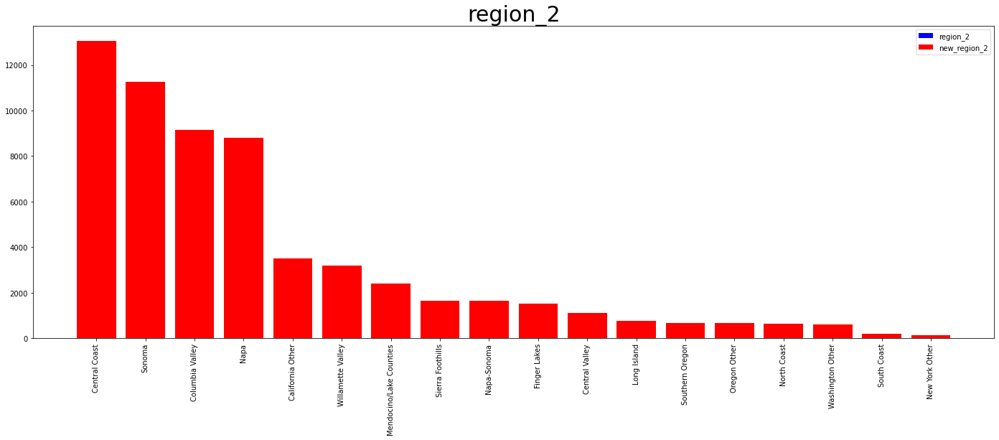

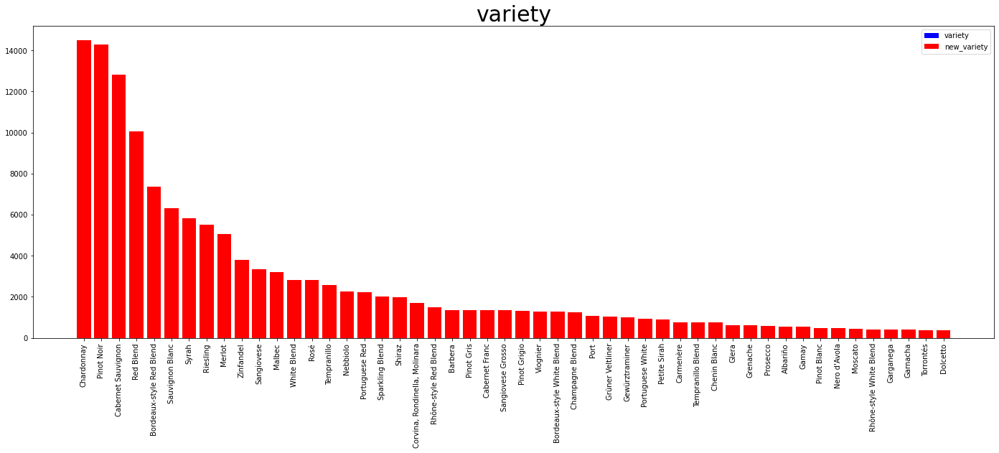

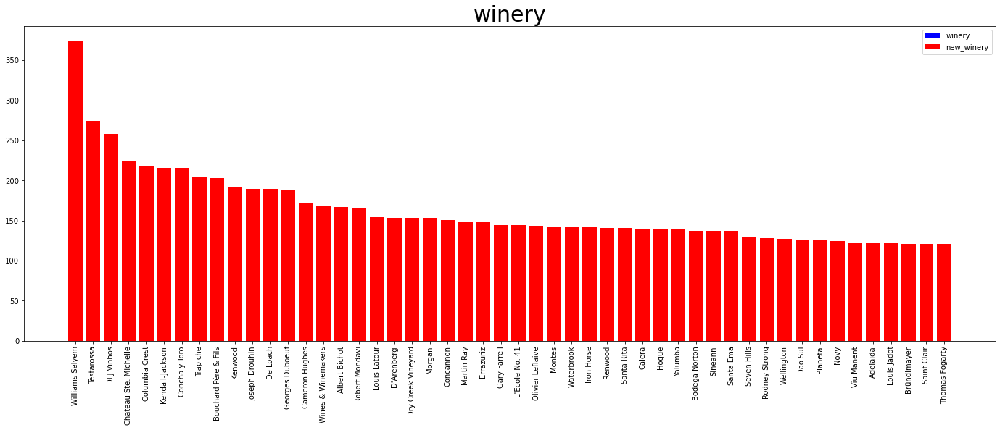

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 90.0000 	Max: 100.0000 
 new Missing: 0 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000
Missing: 13695

 new Min: 4.0000	Q1(25%): 16.0000 	Q2(50%): 24.0000 	Q3(75%): 40.0000 	Max: 2300.0000 
 new Missing: 13620 



C:\Users\sure\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


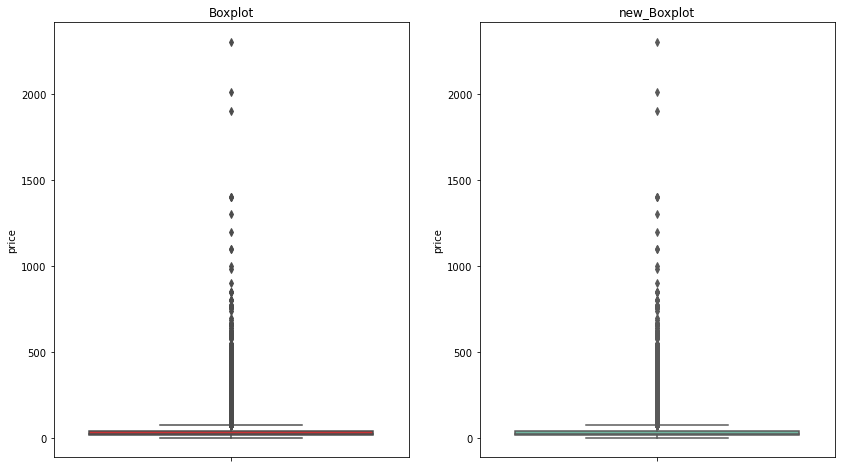

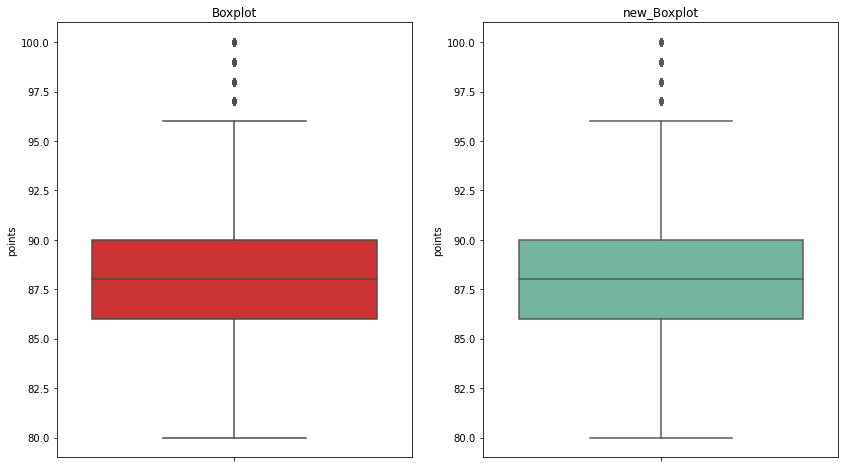

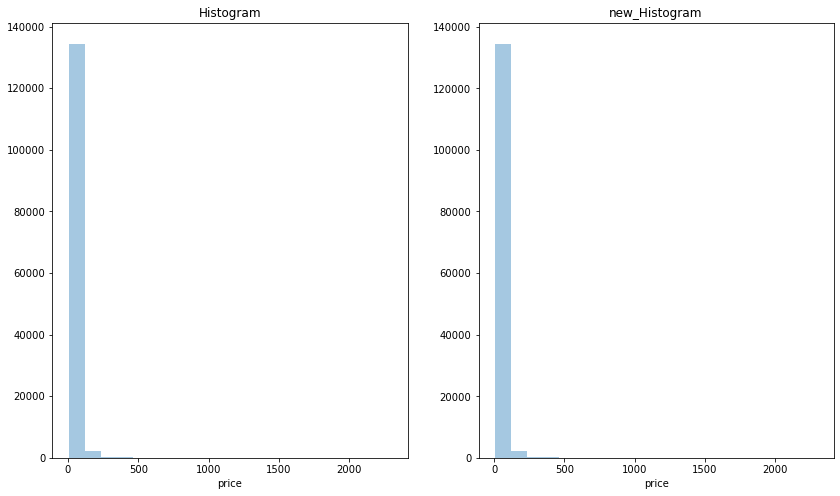

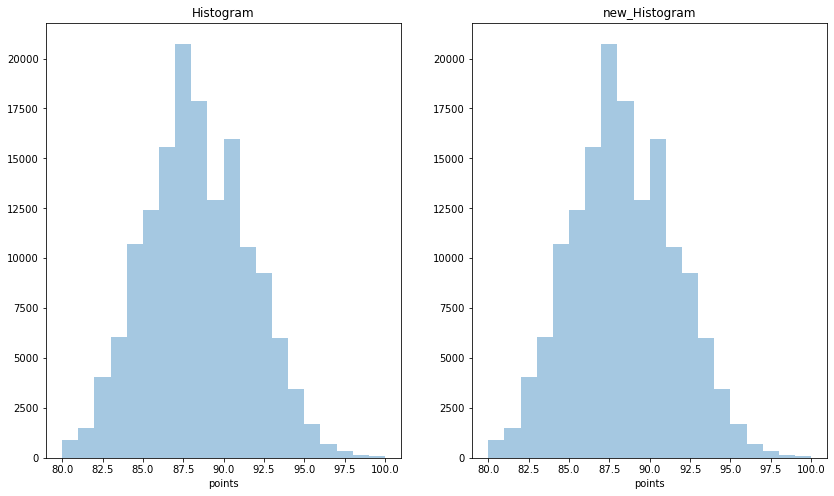

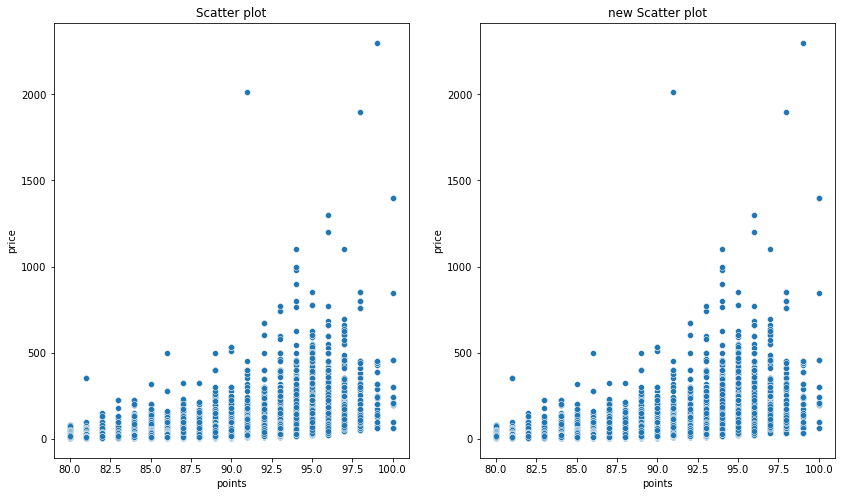

In [15]:
obj150k=obj_corr_fill(winemag150k,numerical_index=numerical_index,k=10)
columns_info(winemag150k,show_shape=True,new_df=obj150k)
nominal_summary(winemag150k,nominal_index=nominal_index,head_n=50,new_df=obj150k)
numerical_summary(winemag150k,numerical_index=numerical_index,new_df=obj150k)
viz_pairs(winemag150k,xlabel='points',ylabel='price',bins=20,new_df=obj150k)

## winemag-data-130k-v2.csv
### 1、数据可视化和摘要

In [16]:
wine_reviews_dir = "wine"
winemag130k=pd.read_csv(wine_reviews_dir+"/winemag-data-130k-v2.csv",sep=',',header='infer',index_col=0)
columns_info(winemag130k)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   country                129908 non-null  object 
 1   description            129971 non-null  object 
 2   designation            92506 non-null   object 
 3   points                 129971 non-null  int64  
 4   price                  120975 non-null  float64
 5   province               129908 non-null  object 
 6   region_1               108724 non-null  object 
 7   region_2               50511 non-null   object 
 8   taster_name            103727 non-null  object 
 9   taster_twitter_handle  98758 non-null   object 
 10  title                  129971 non-null  object 
 11  variety                129970 non-null  object 
 12  winery                 129971 non-null  object 
dtypes: float64(1), int64(1), object(11)
memory usage: 13.9+ MB
None
(129971, 13)


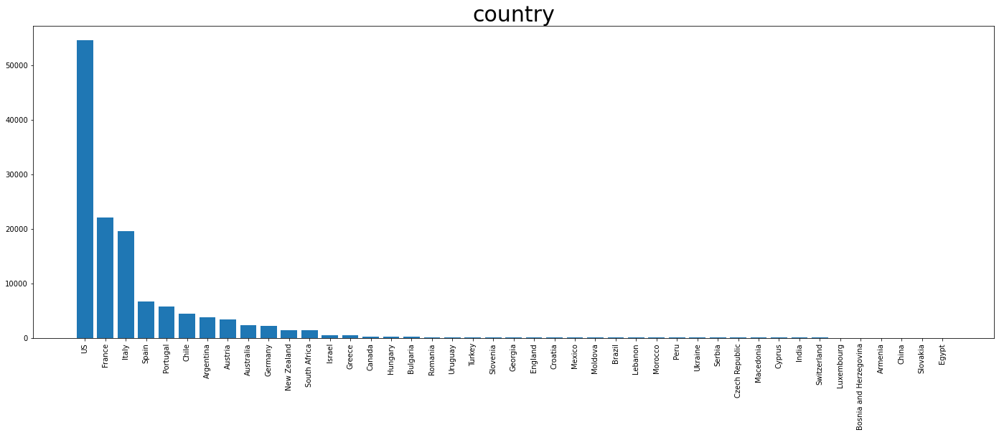

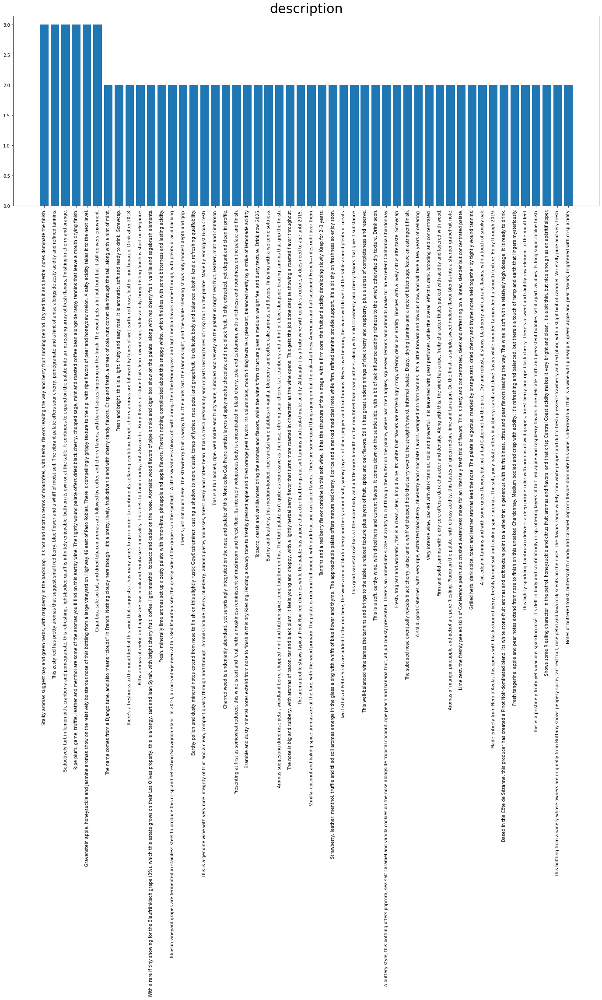

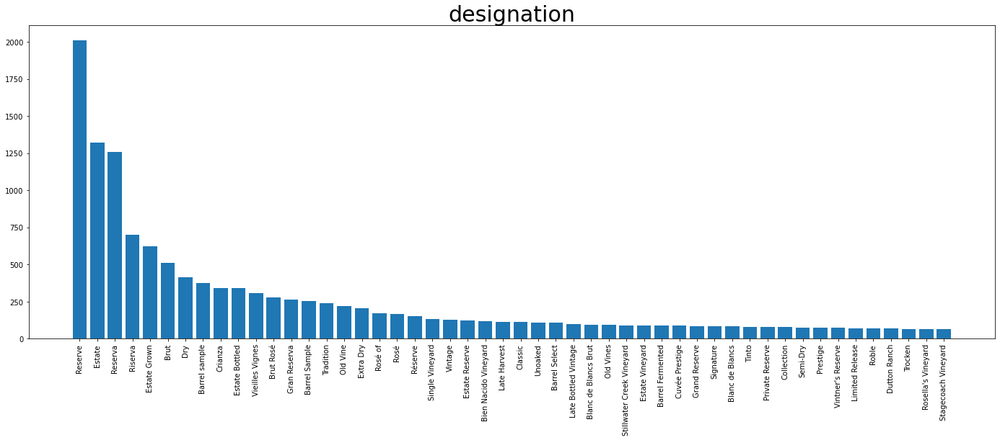

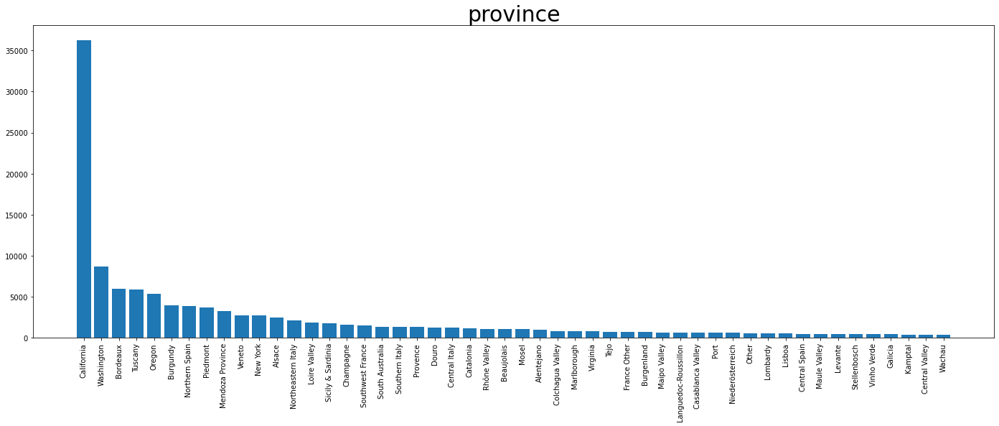

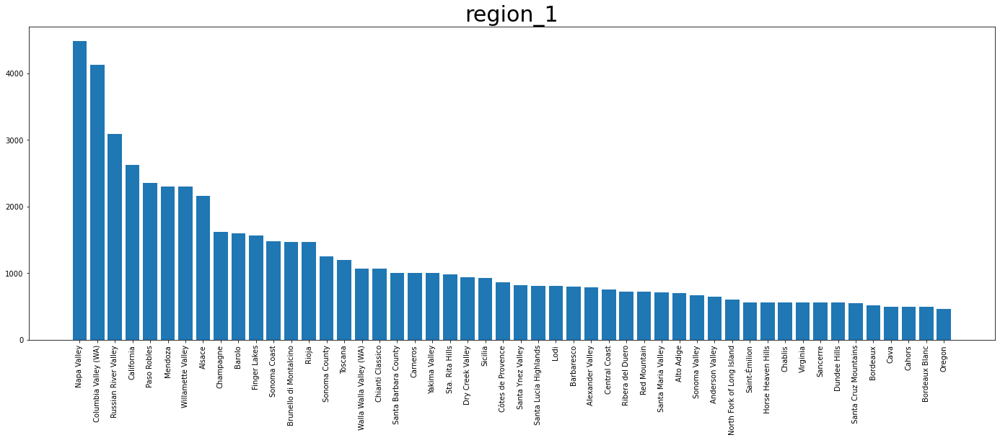

...

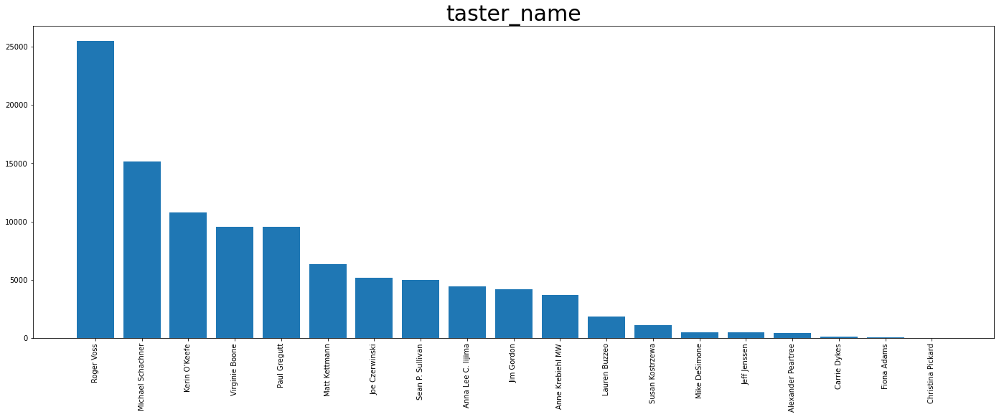

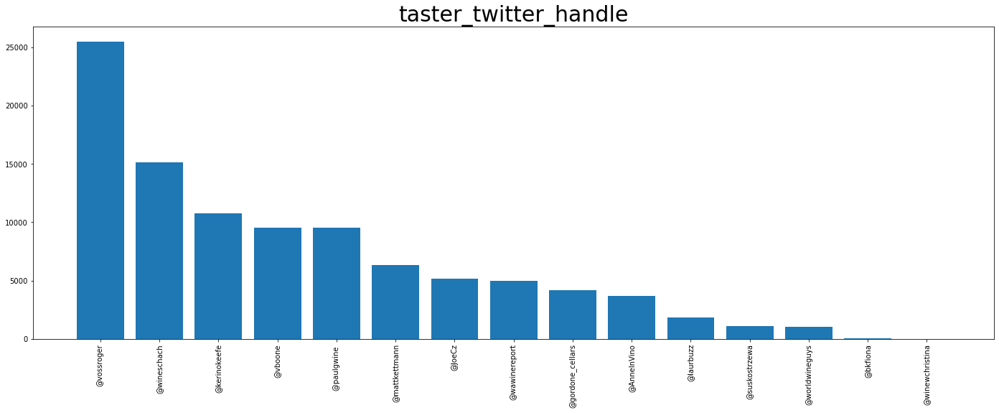

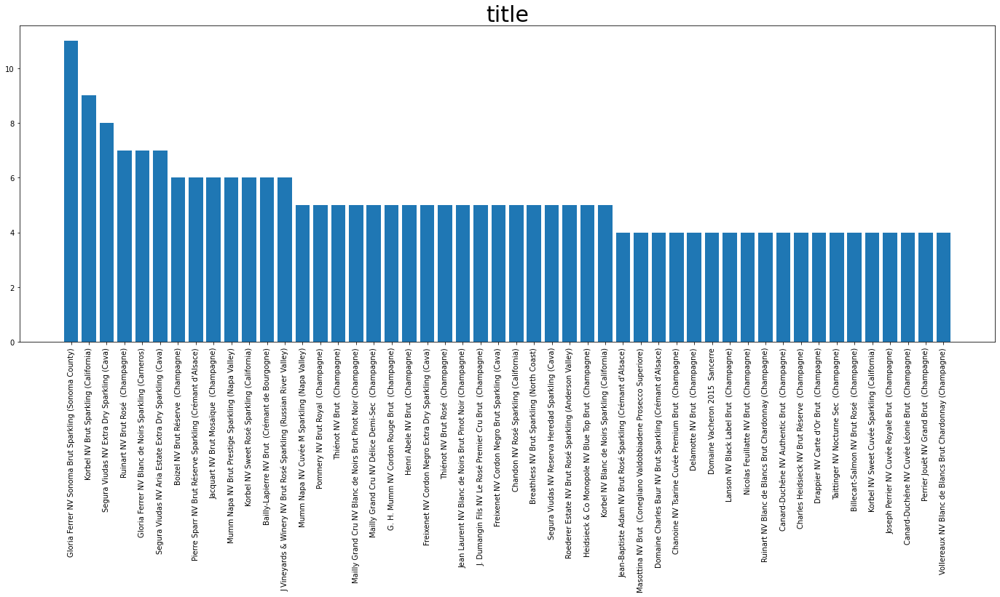

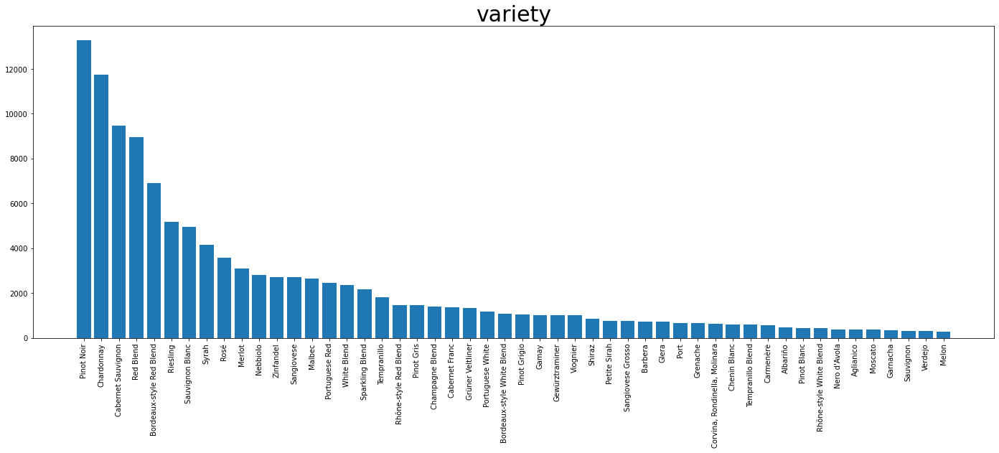

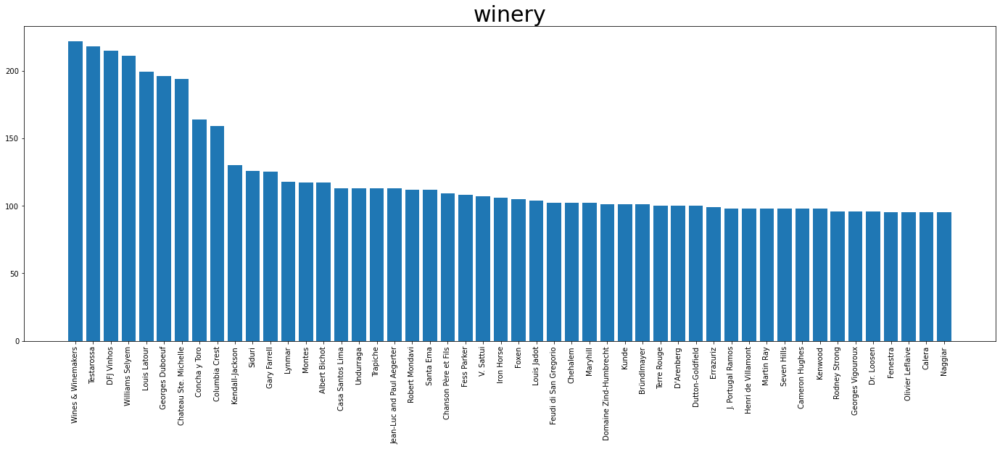

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
Missing: 0

descriptive statistics (price):
Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000
Missing: 8996



C:\Users\sure\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


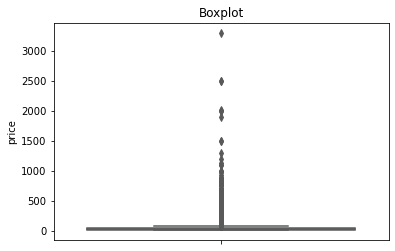

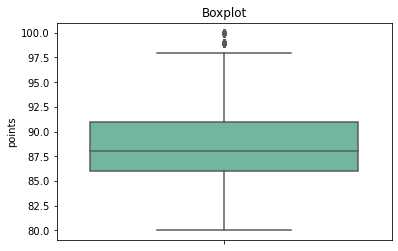

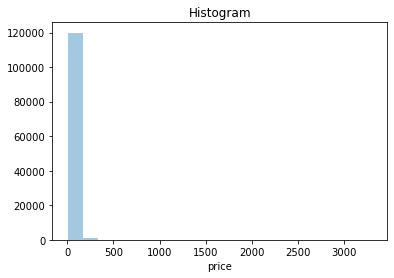

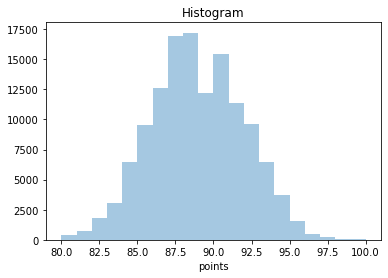

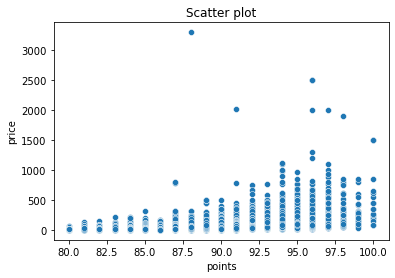

In [17]:
# 标称属性
nominal_index = ['country','description', 'designation', 'province', 'region_1', 'region_2', 
                 'taster_name','taster_twitter_handle','title',
                 'variety', 'winery']
# 数值属性
numerical_index = ['points', 'price']
nominal_summary(winemag130k,nominal_index,head_n=50)
numerical_summary(winemag130k,numerical_index)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=None)

### 2、数据缺失的处理

#### （1）将缺失部分剔除

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   country                129908 non-null  object 
 1   description            129971 non-null  object 
 2   designation            92506 non-null   object 
 3   points                 129971 non-null  int64  
 4   price                  120975 non-null  float64
 5   province               129908 non-null  object 
 6   region_1               108724 non-null  object 
 7   region_2               50511 non-null   object 
 8   taster_name            103727 non-null  object 
 9   taster_twitter_handle  98758 non-null   object 
 10  title                  129971 non-null  object 
 11  variety                129970 non-null  object 
 12  winery                 129971 non-null  object 
dtypes: float64(1), int64(1), object(11)
memory usage: 13.9+ MB
None
(129971, 13)

<class 'pan

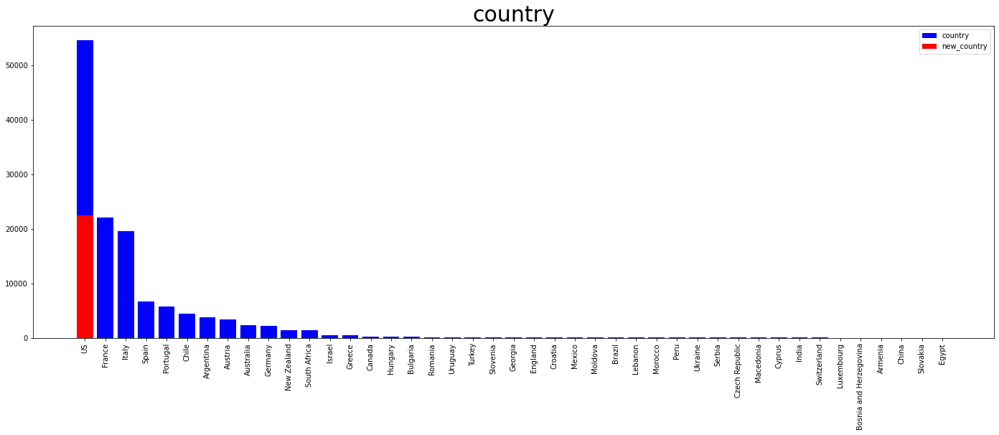

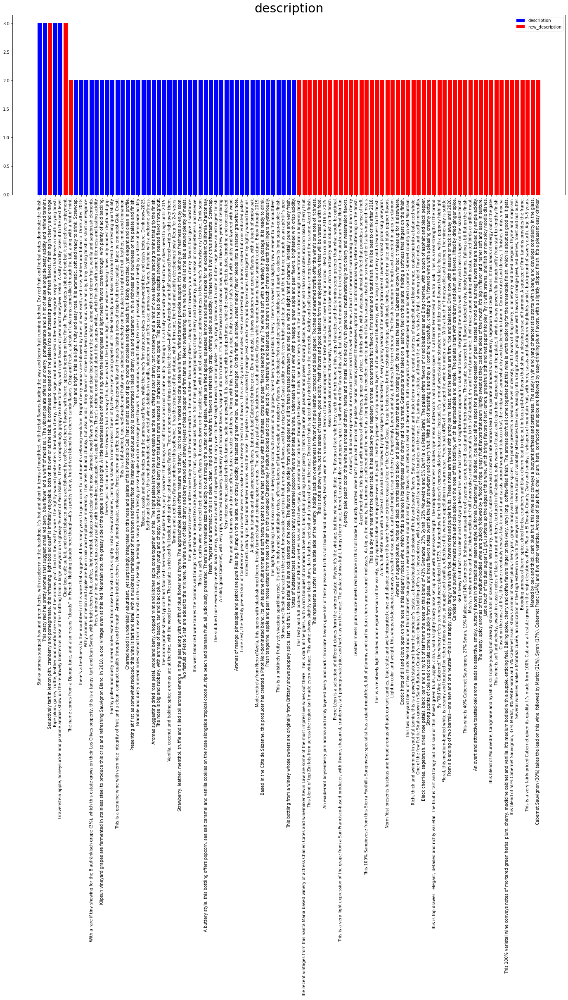

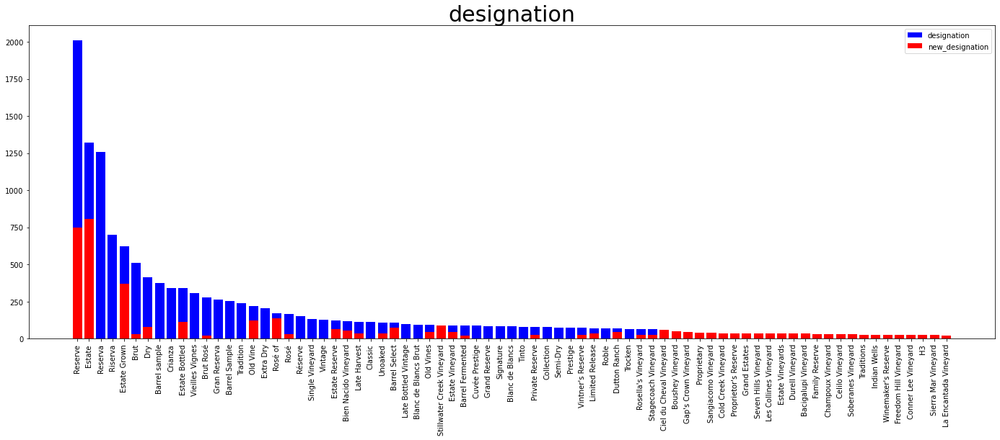

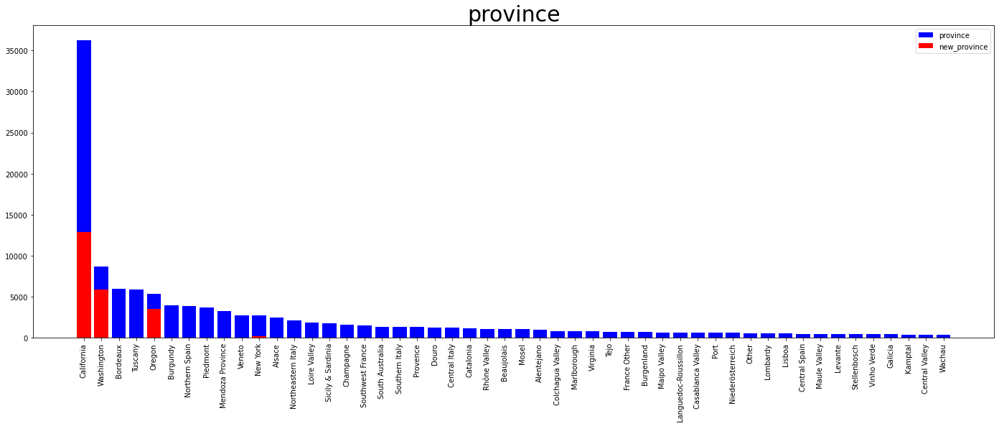

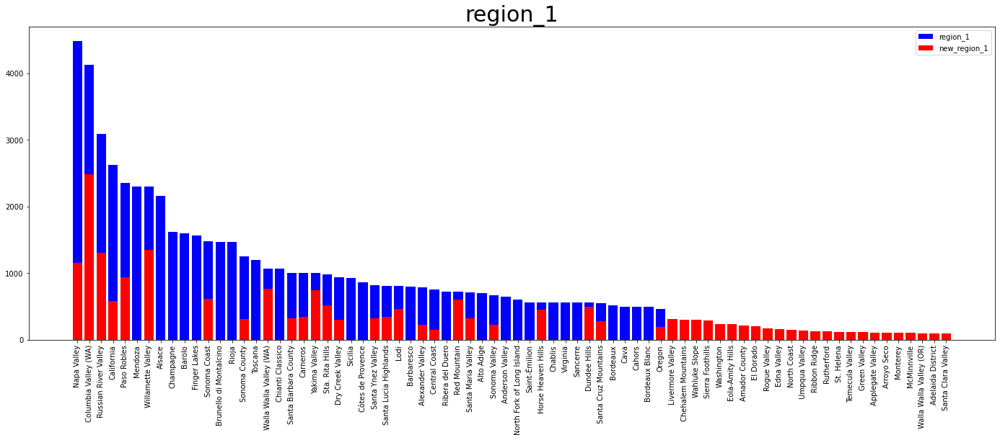

...

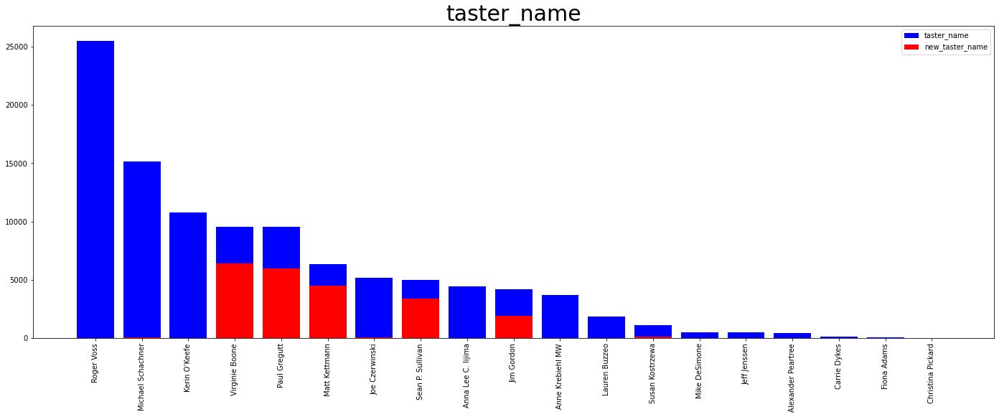

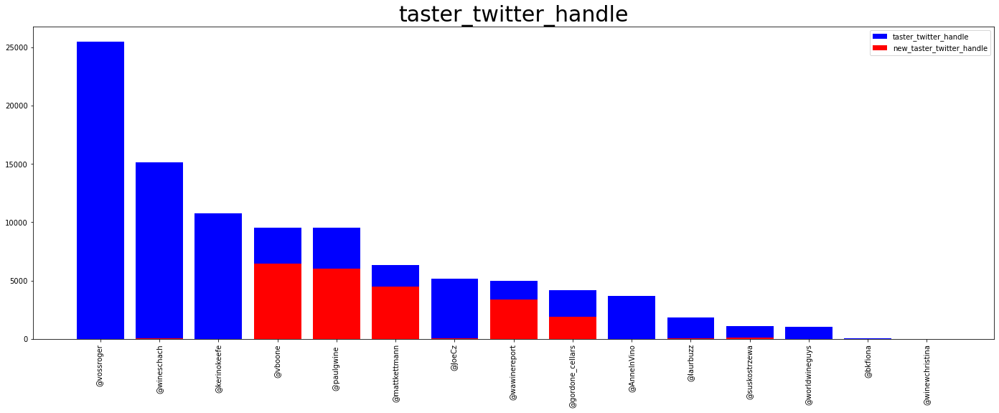

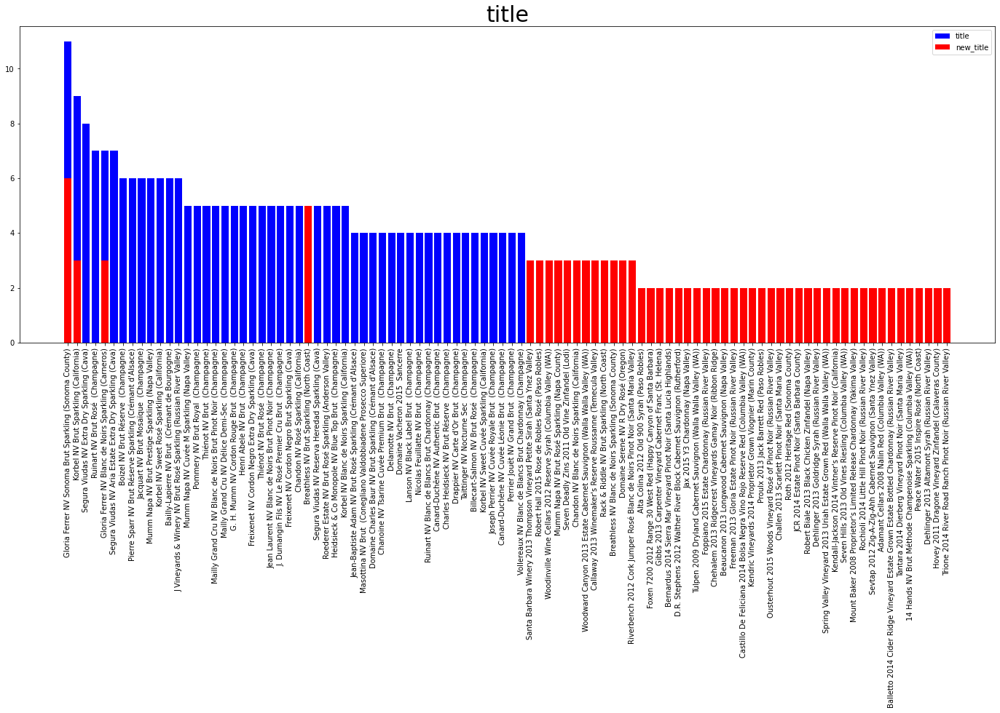

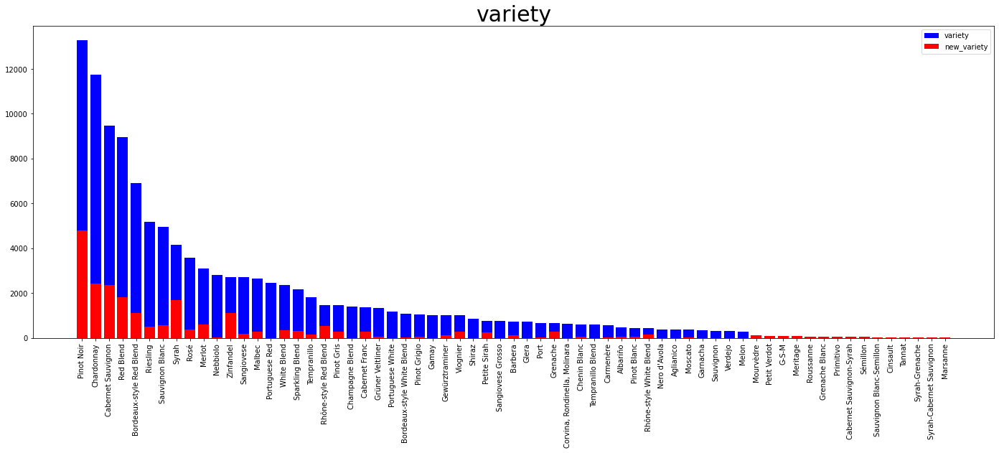

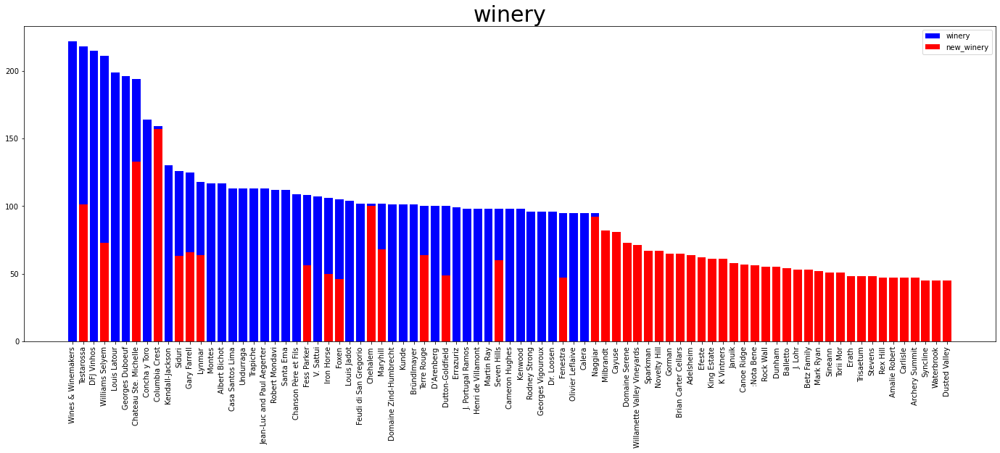

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 88.0000 	Q2(50%): 90.0000 	Q3(75%): 92.0000 	Max: 100.0000 
 new Missing: 107584 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000
Missing: 8996

 new Min: 4.0000	Q1(25%): 25.0000 	Q2(50%): 36.0000 	Q3(75%): 50.0000 	Max: 2013.0000 
 new Missing: 107584 



C:\Users\sure\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


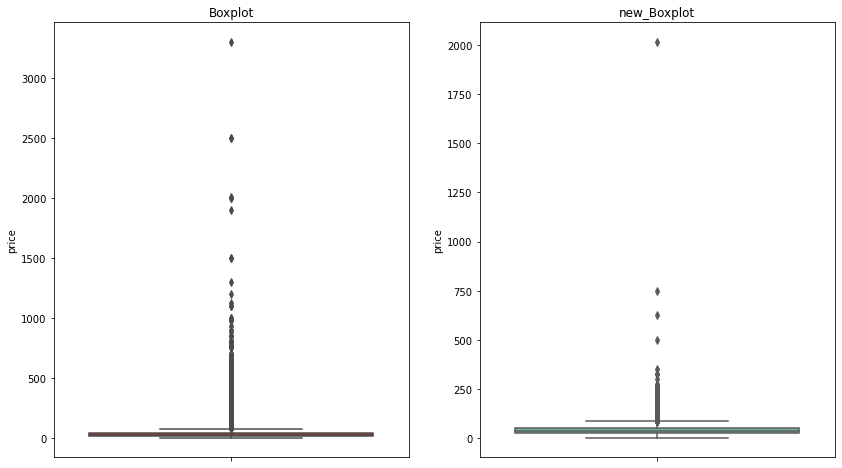

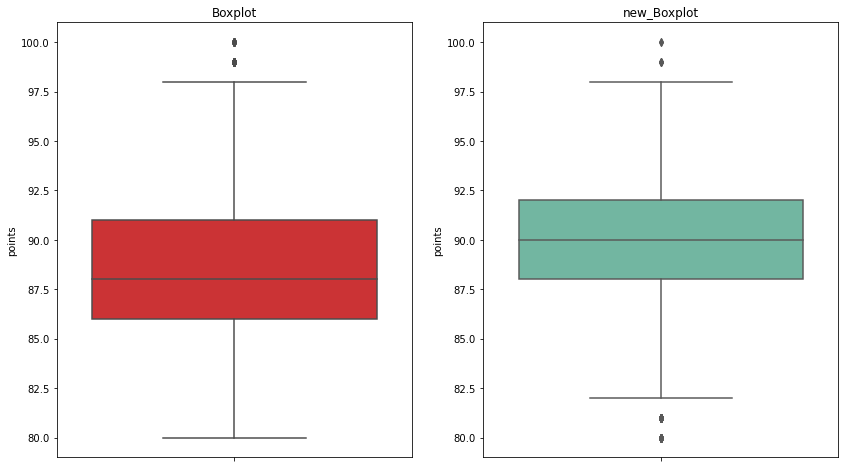

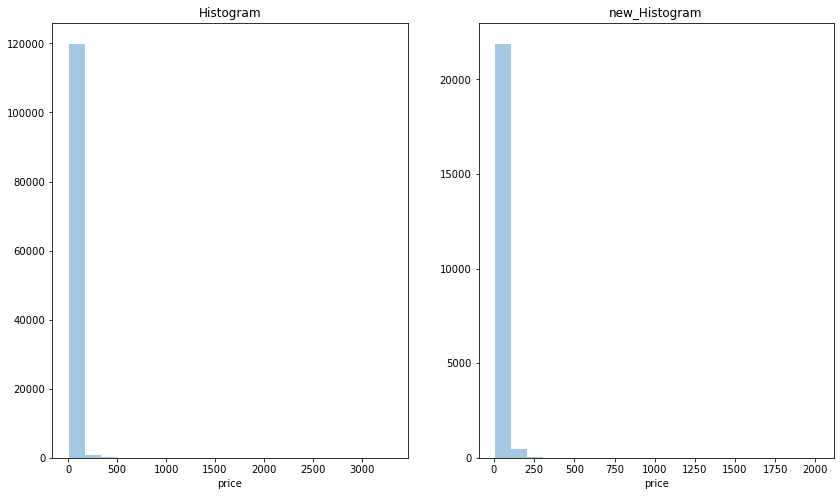

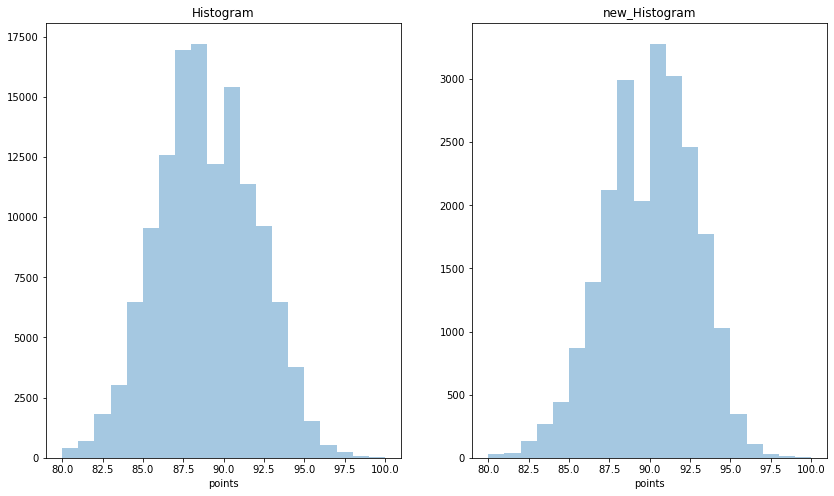

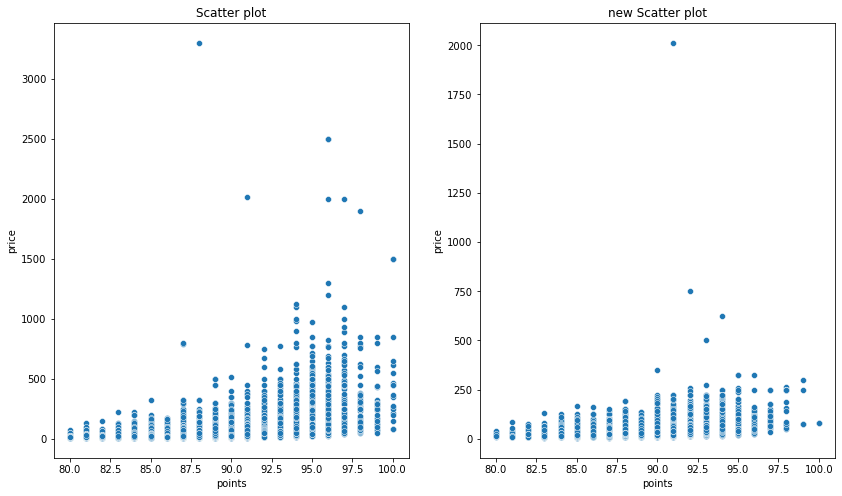

In [18]:
dw130k=miss_drop(winemag130k)
columns_info(winemag130k,show_shape=True,new_df=dw130k)
nominal_summary(winemag130k,nominal_index=nominal_index,head_n=50,new_df=dw130k)
numerical_summary(winemag130k,numerical_index=numerical_index,new_df=dw130k)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=dw130k)

#### （2）用最高频率值来填补缺失值

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   country                129908 non-null  object 
 1   description            129971 non-null  object 
 2   designation            92506 non-null   object 
 3   points                 129971 non-null  int64  
 4   price                  120975 non-null  float64
 5   province               129908 non-null  object 
 6   region_1               108724 non-null  object 
 7   region_2               50511 non-null   object 
 8   taster_name            103727 non-null  object 
 9   taster_twitter_handle  98758 non-null   object 
 10  title                  129971 non-null  object 
 11  variety                129970 non-null  object 
 12  winery                 129971 non-null  object 
dtypes: float64(1), int64(1), object(11)
memory usage: 13.9+ MB
None
(129971, 13)

<class 'pan

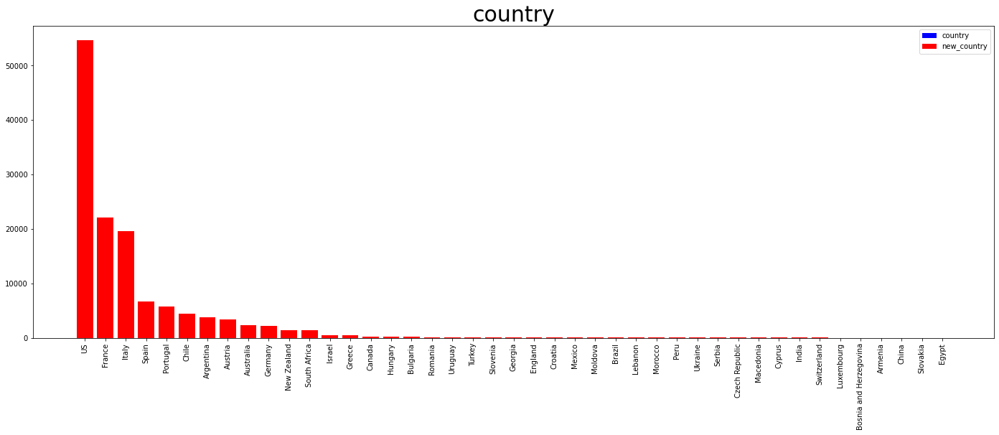

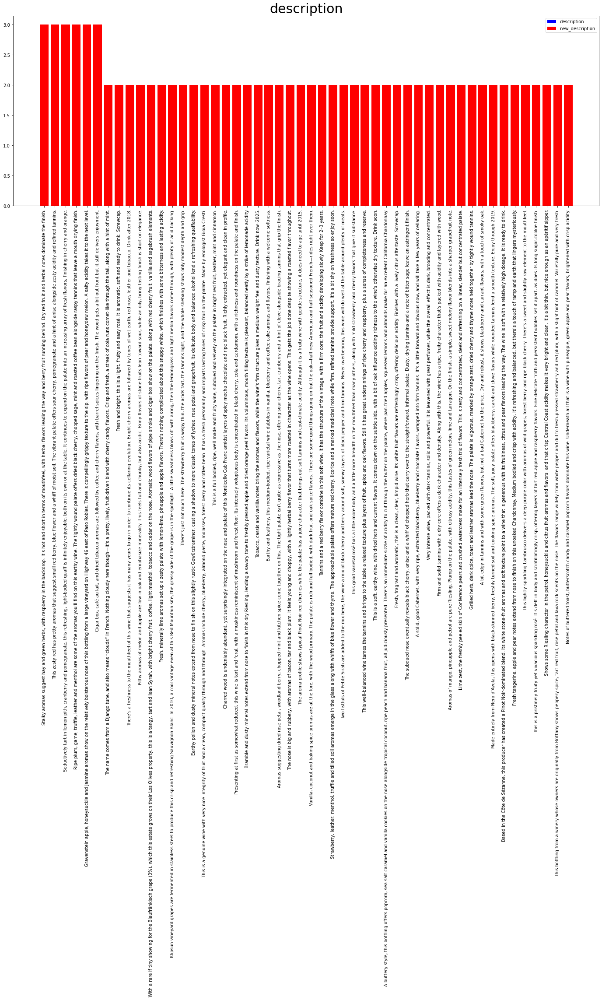

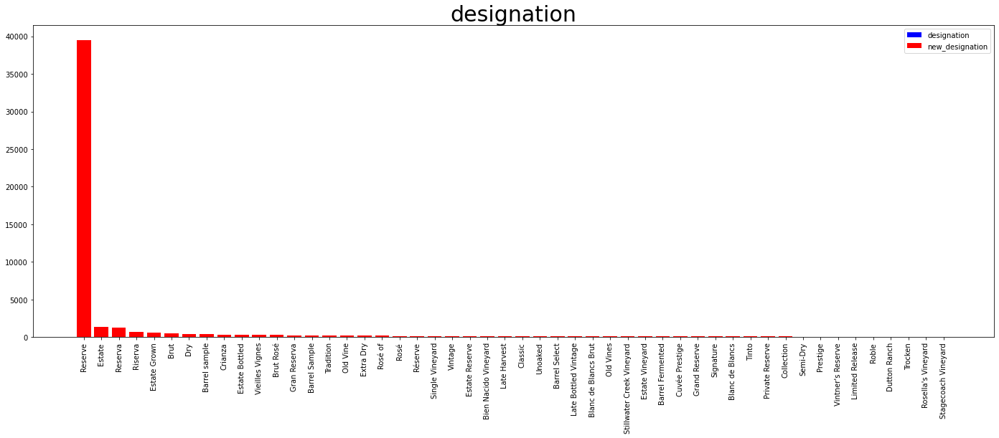

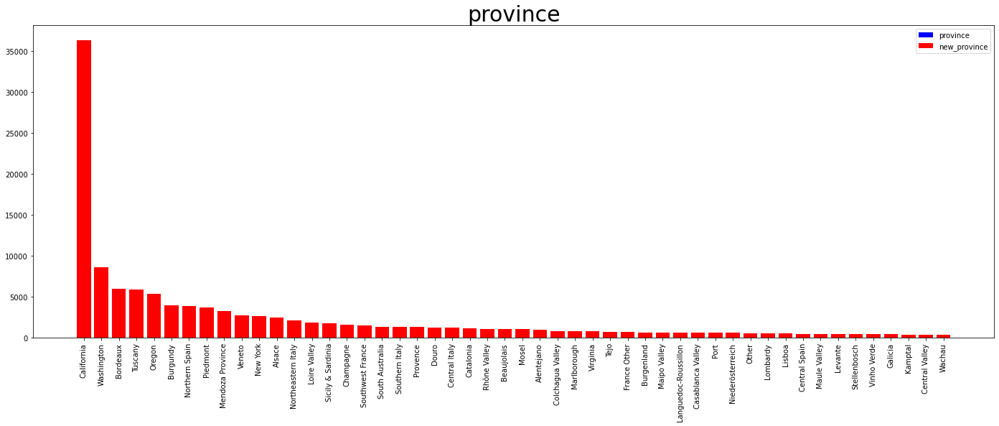

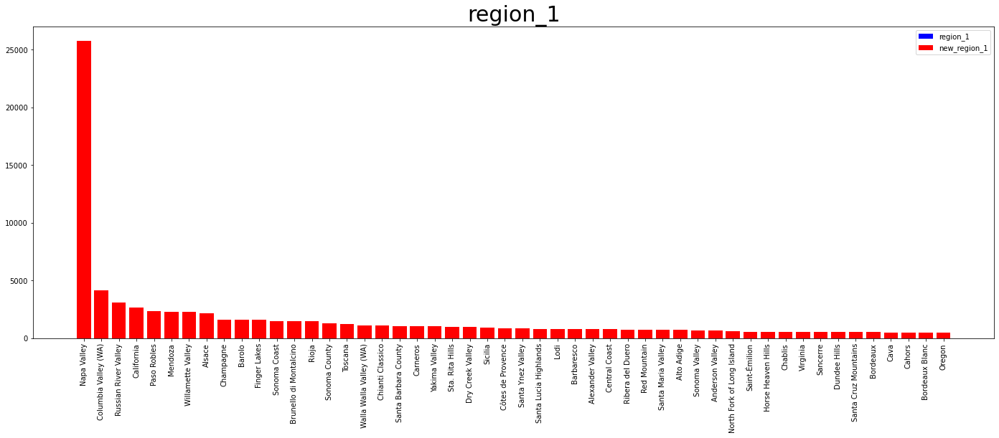

...

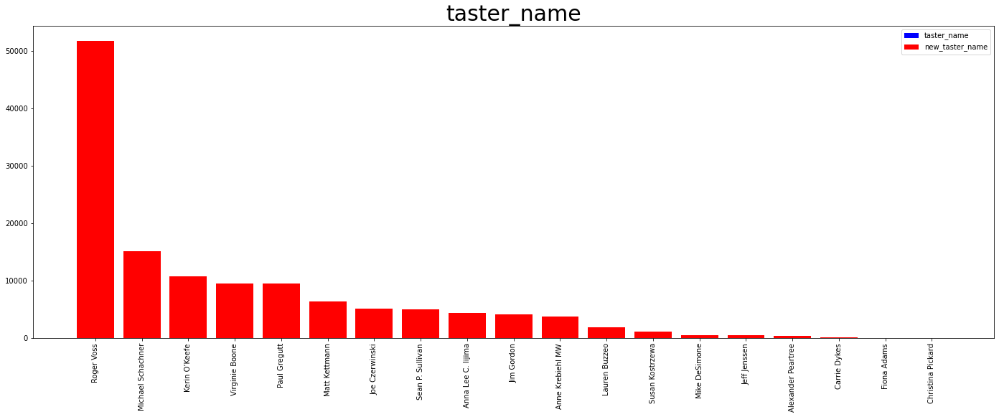

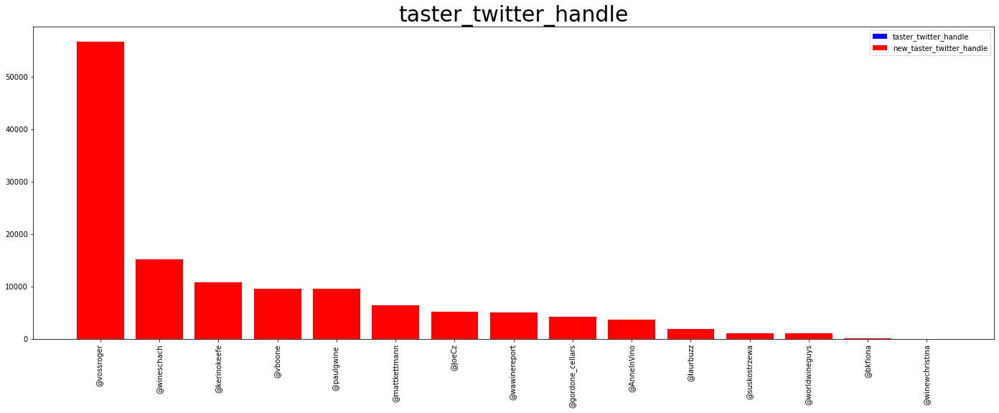

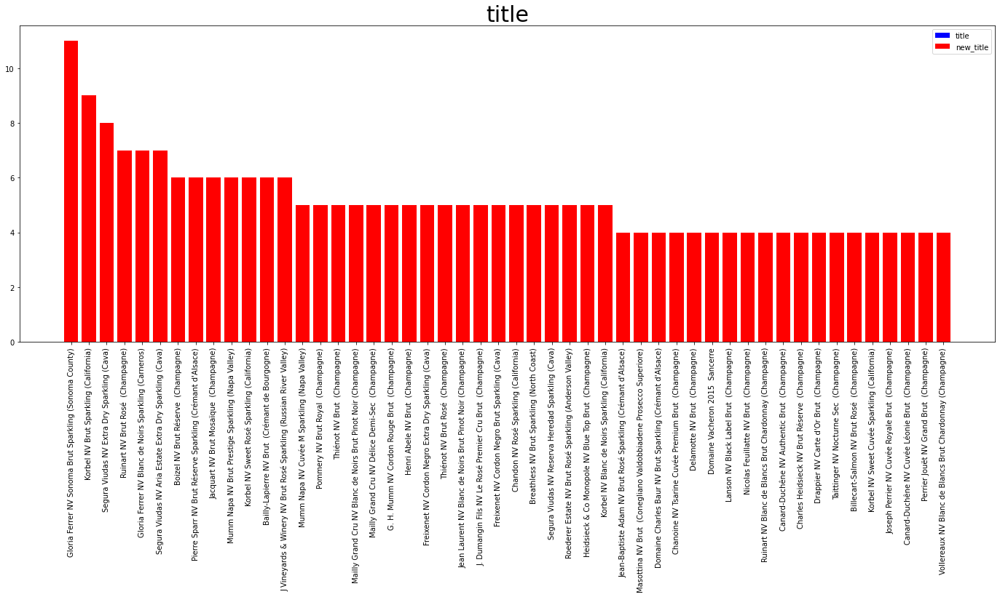

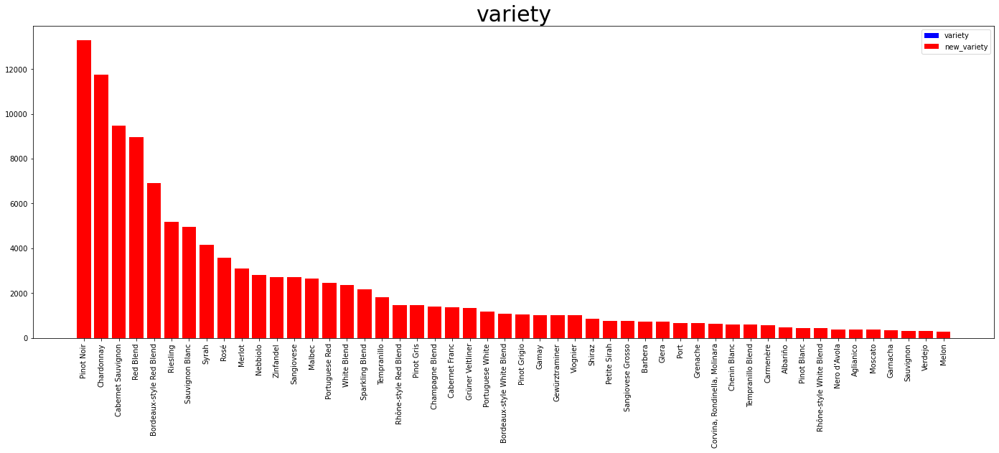

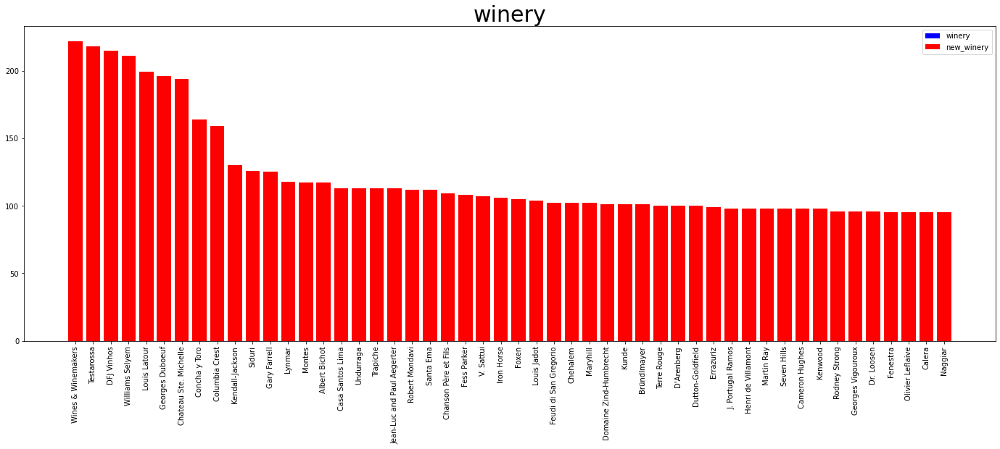

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000 
 new Missing: 0 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000
Missing: 8996

 new Min: 4.0000	Q1(25%): 18.0000 	Q2(50%): 25.0000 	Q3(75%): 40.0000 	Max: 3300.0000 
 new Missing: 0 



C:\Users\sure\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


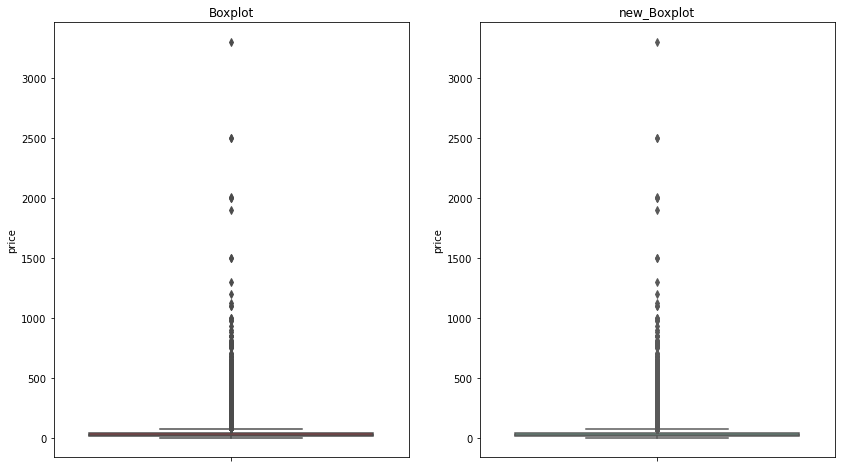

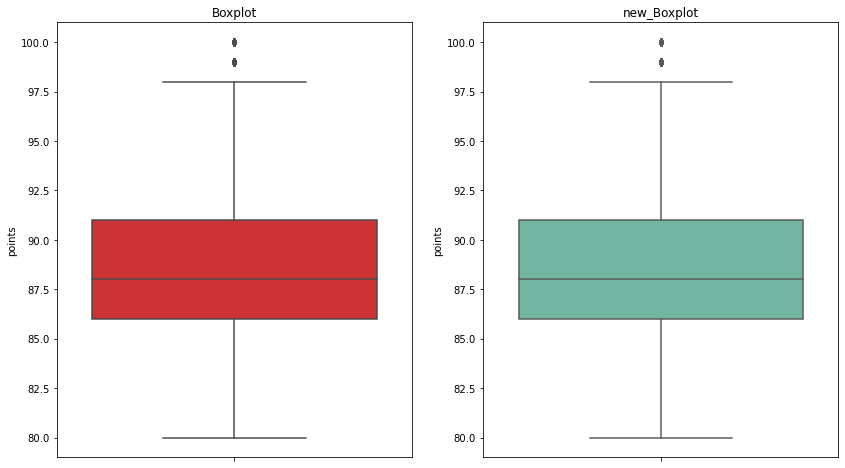

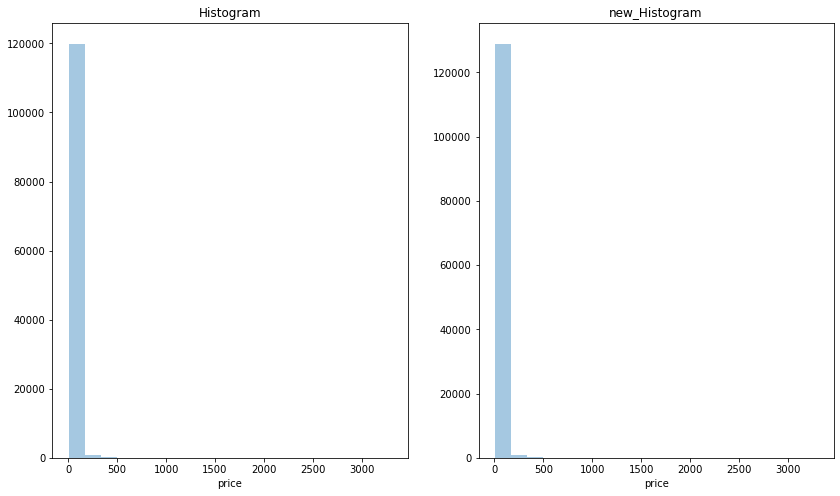

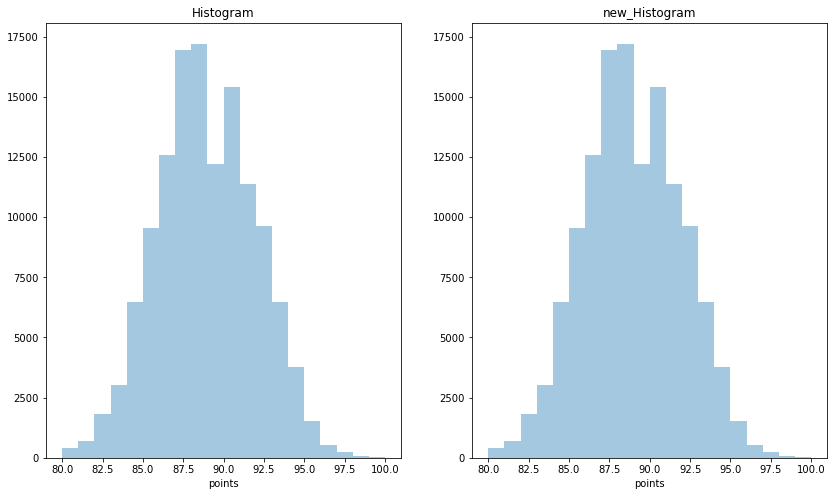

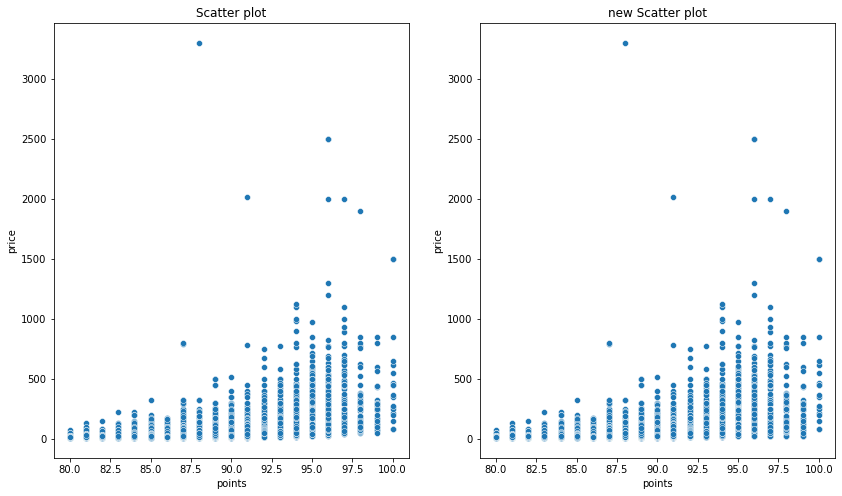

In [19]:
md130k=miss_mode_fill(winemag130k)
columns_info(winemag130k,show_shape=True,new_df=md130k)
nominal_summary(winemag130k,nominal_index=nominal_index,head_n=50,new_df=md130k)
numerical_summary(winemag130k,numerical_index=numerical_index,new_df=md130k)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=md130k)

#### （3）通过属性的相关关系来填补缺失值

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   country                129908 non-null  object 
 1   description            129971 non-null  object 
 2   designation            92506 non-null   object 
 3   points                 129971 non-null  int64  
 4   price                  120975 non-null  float64
 5   province               129908 non-null  object 
 6   region_1               108724 non-null  object 
 7   region_2               50511 non-null   object 
 8   taster_name            103727 non-null  object 
 9   taster_twitter_handle  98758 non-null   object 
 10  title                  129971 non-null  object 
 11  variety                129970 non-null  object 
 12  winery                 129971 non-null  object 
dtypes: float64(1), int64(1), object(11)
memory usage: 13.9+ MB
None
(129971, 13)

<class 'pan

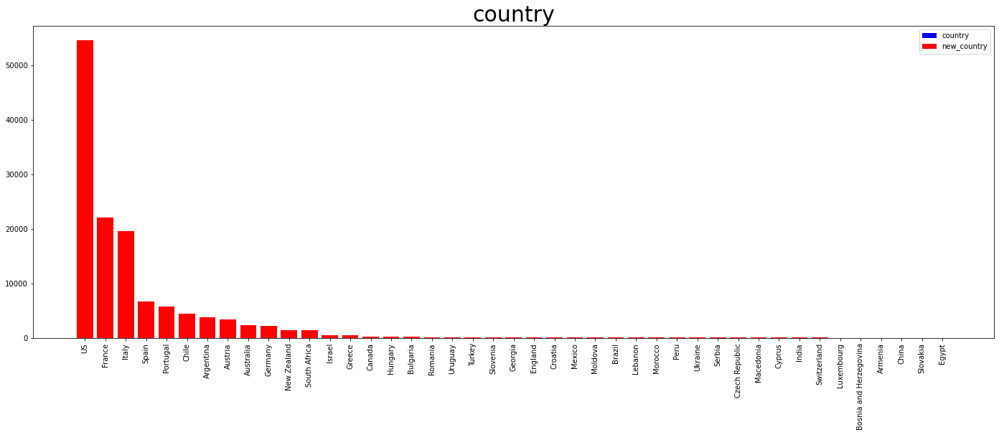

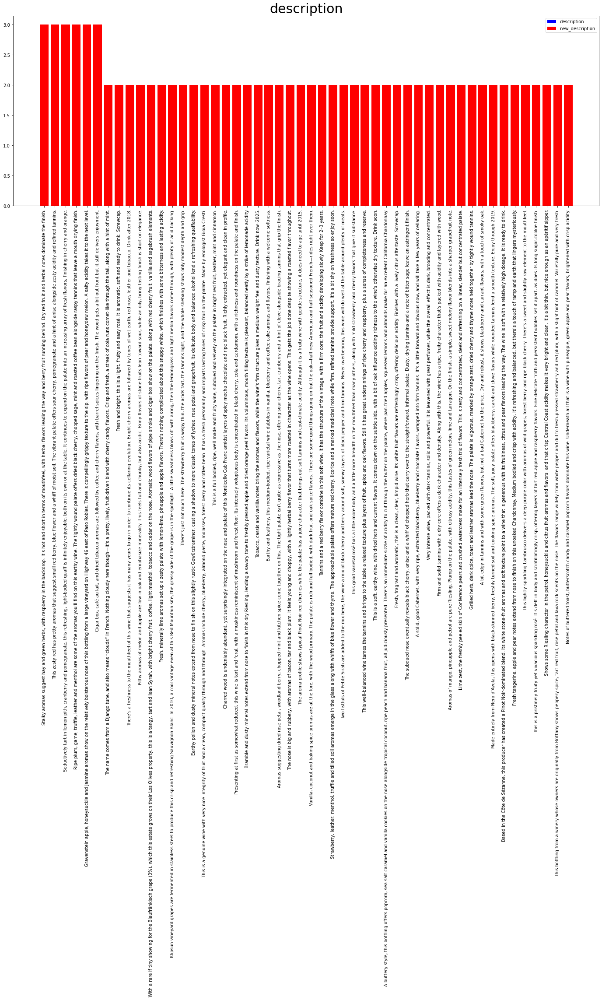

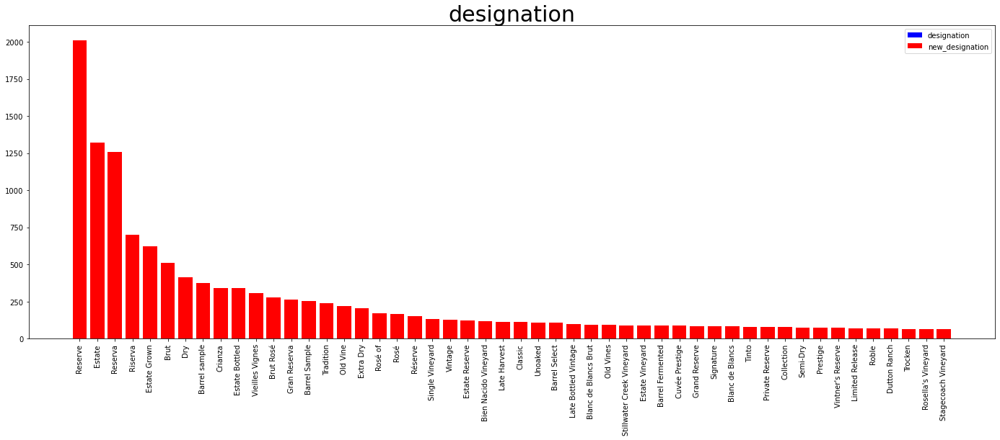

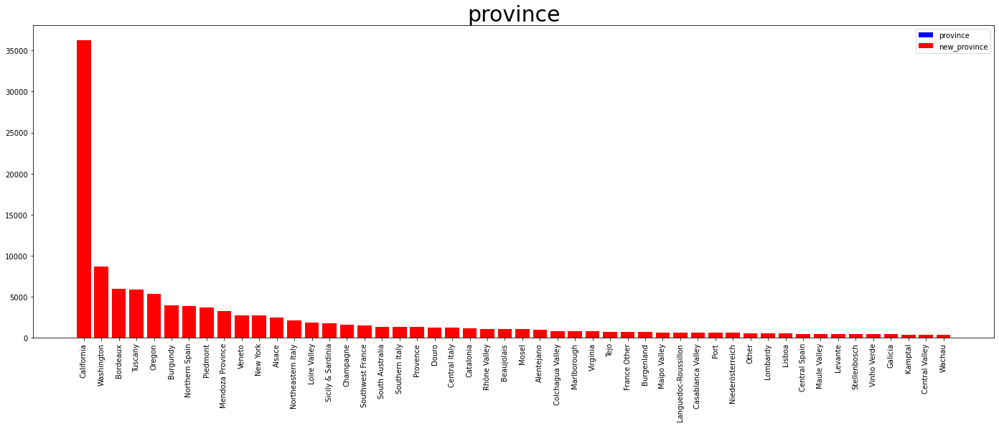

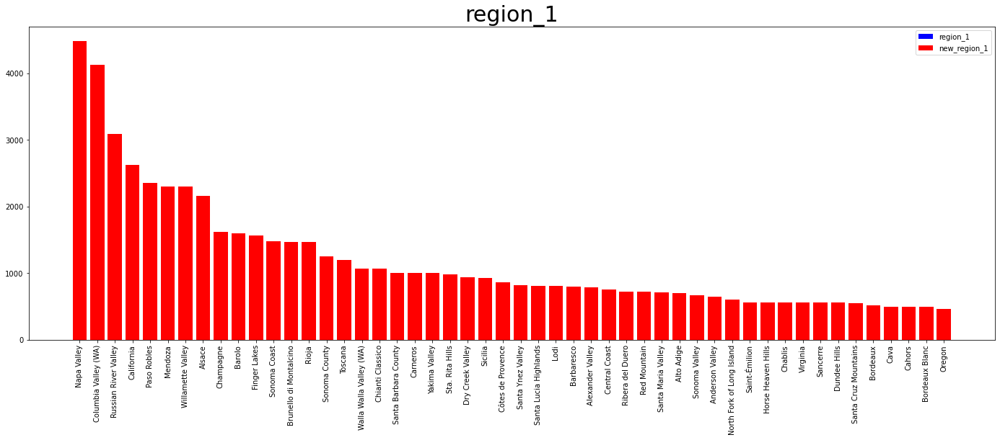

...

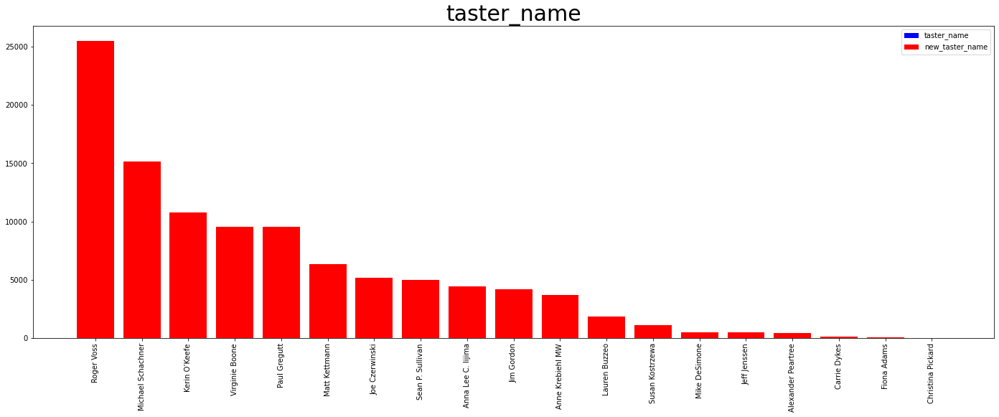

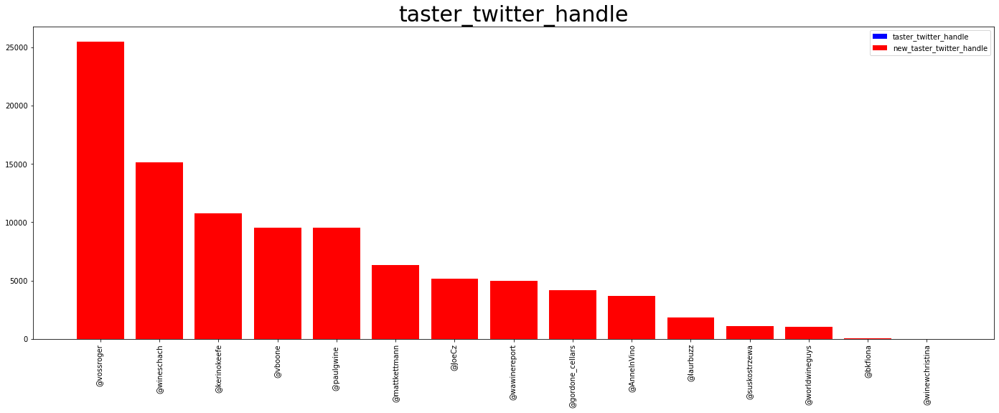

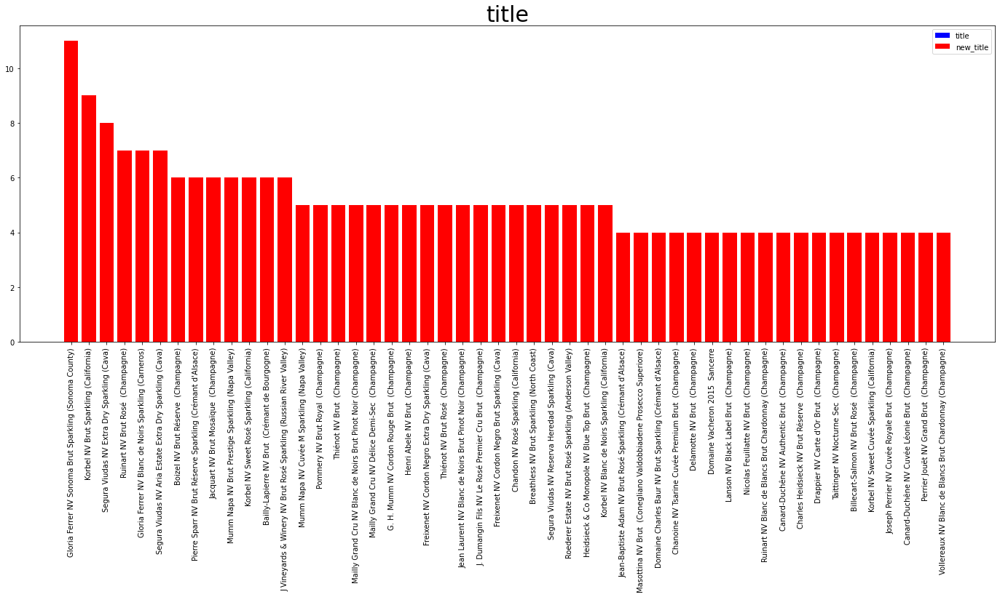

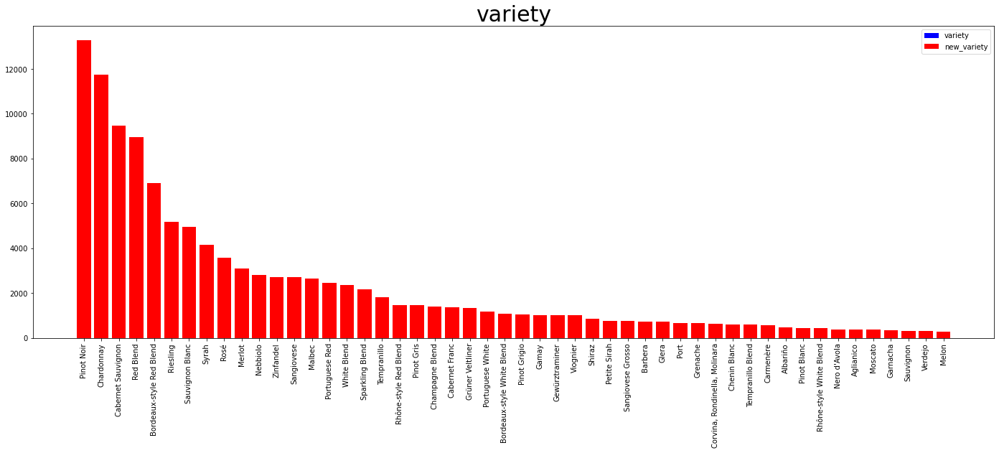

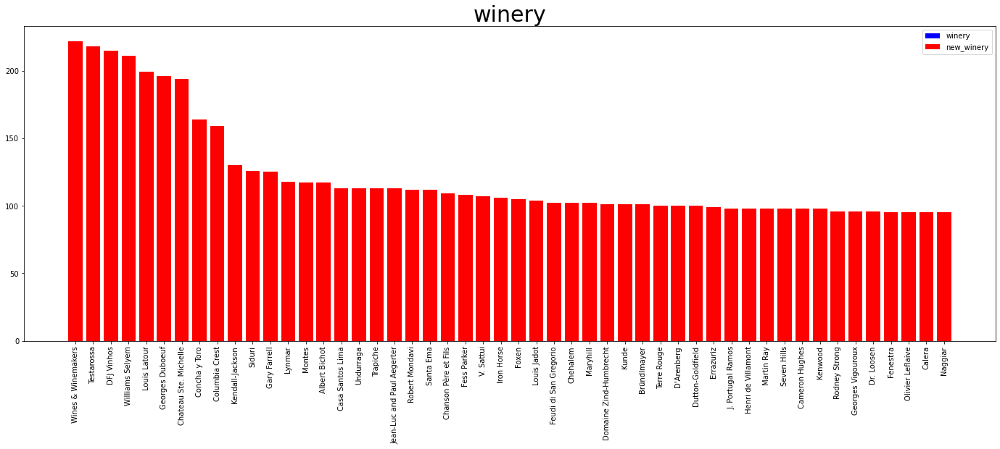

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000 
 new Missing: 0 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000
Missing: 8996

 new Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000 
 new Missing: 8996 



C:\Users\sure\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


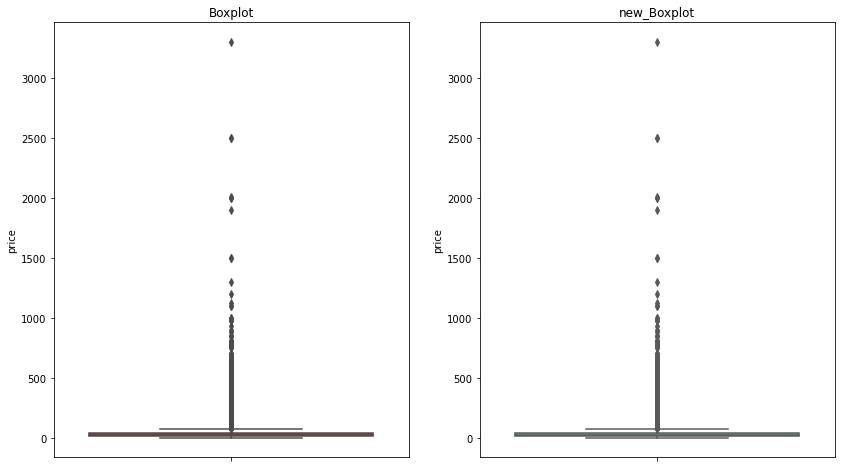

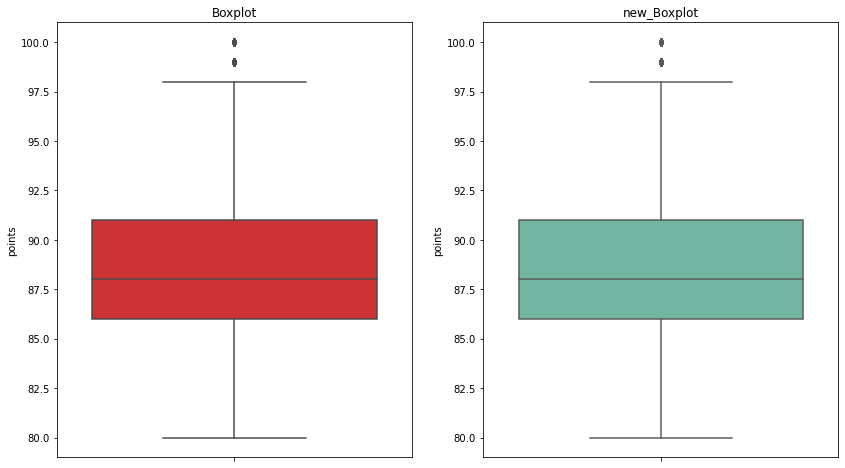

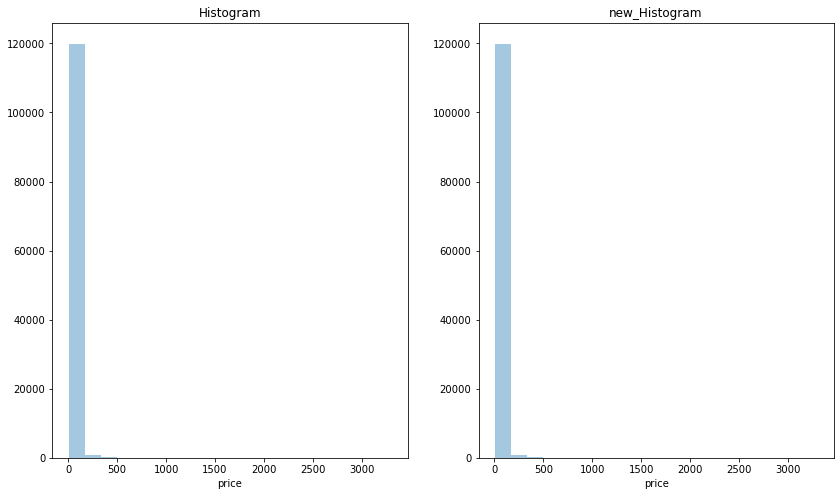

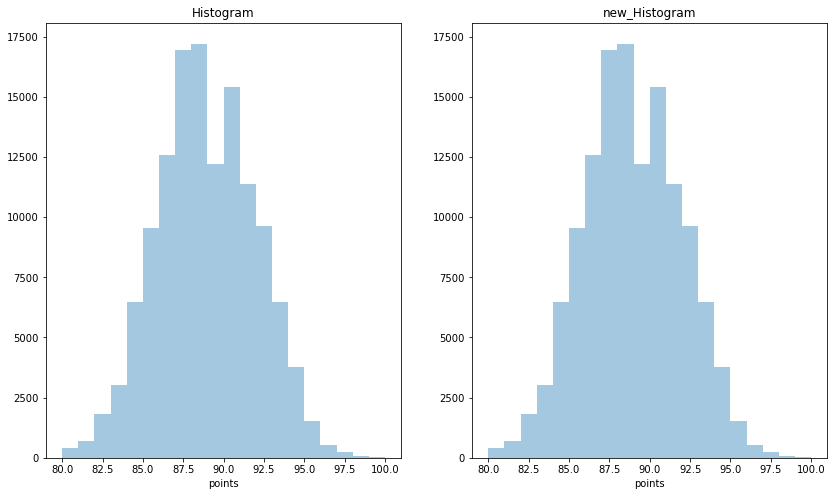

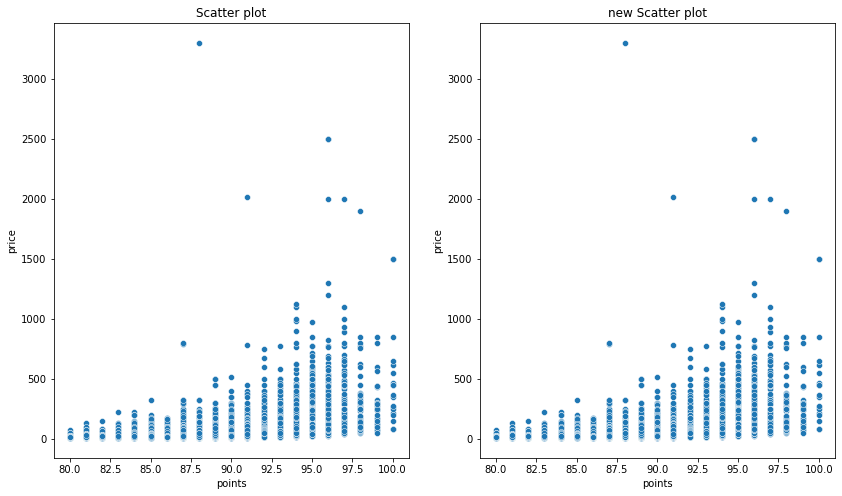

In [20]:
miss_index=['country','designation','price','province','region_1','region_2','taster_name','taster_twitter_handle','variety']
comp_index=['description','points','title','winery']
att130k=attr_corr_fill(winemag130k,miss_index=miss_index,complete_index=comp_index)
columns_info(winemag130k,show_shape=True,new_df=att130k)
nominal_summary(winemag130k,nominal_index=nominal_index,head_n=50,new_df=att130k)
numerical_summary(winemag130k,numerical_index=numerical_index,new_df=att130k)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=att130k)

#### （4）通过数据对象之间的相似性来填补缺失值

C:\Users\sure\Anaconda3\lib\site-packages\impyute\imputation\cs\fast_knn.py:113: RuntimeWarning: invalid value encountered in true_divide
  weights = distances/np.sum(distances)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 129971 entries, 0 to 129970
Data columns (total 13 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   country                129908 non-null  object 
 1   description            129971 non-null  object 
 2   designation            92506 non-null   object 
 3   points                 129971 non-null  int64  
 4   price                  120975 non-null  float64
 5   province               129908 non-null  object 
 6   region_1               108724 non-null  object 
 7   region_2               50511 non-null   object 
 8   taster_name            103727 non-null  object 
 9   taster_twitter_handle  98758 non-null   object 
 10  title                  129971 non-null  object 
 11  variety                129970 non-null  object 
 12  winery                 129971 non-null  object 
dtypes: float64(1), int64(1), object(11)
memory usage: 13.9+ MB
None
(129971, 13)

<class 'pan

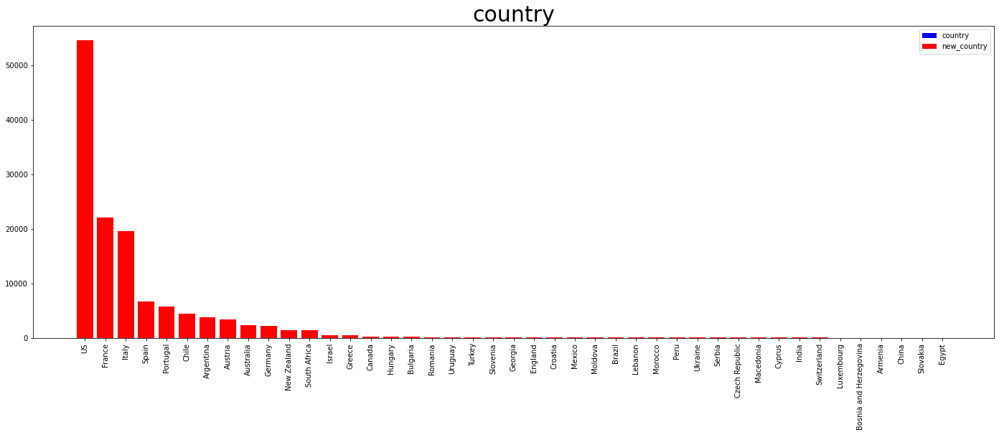

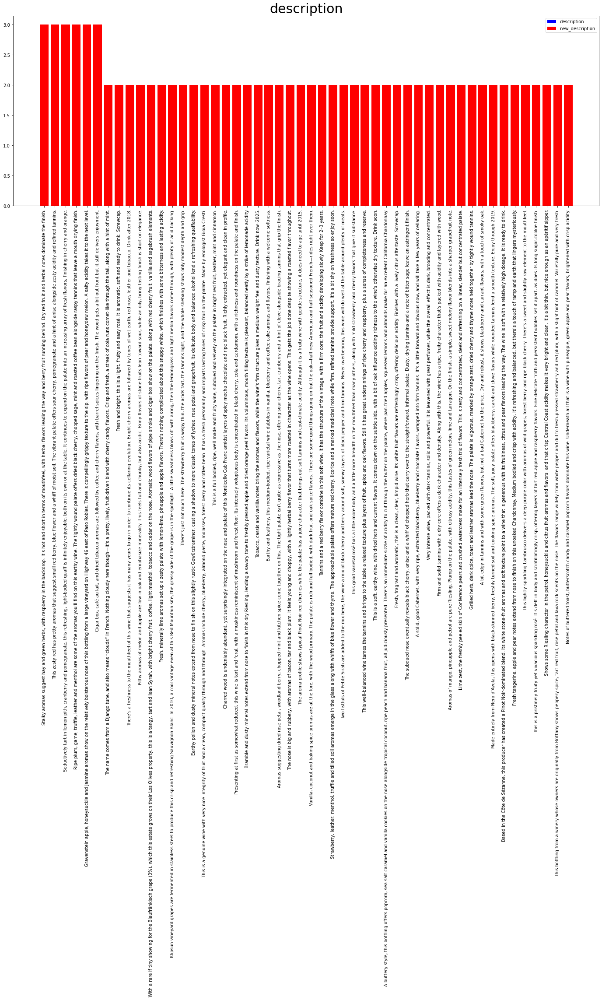

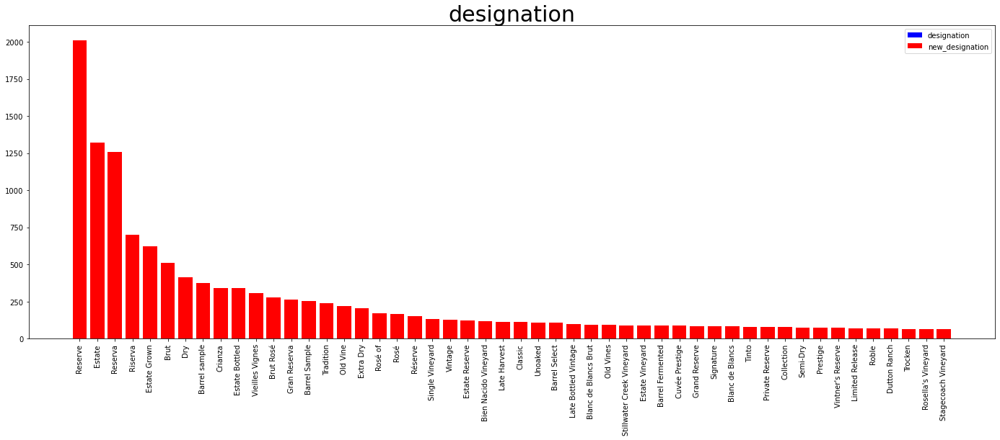

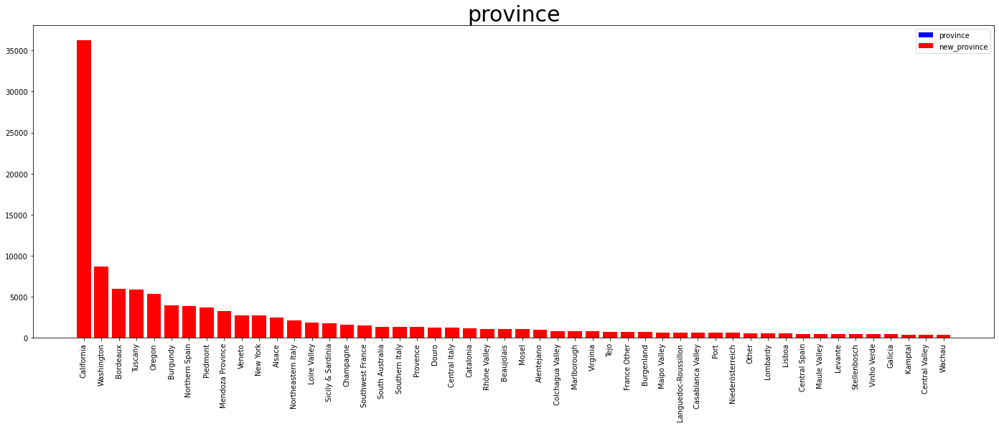

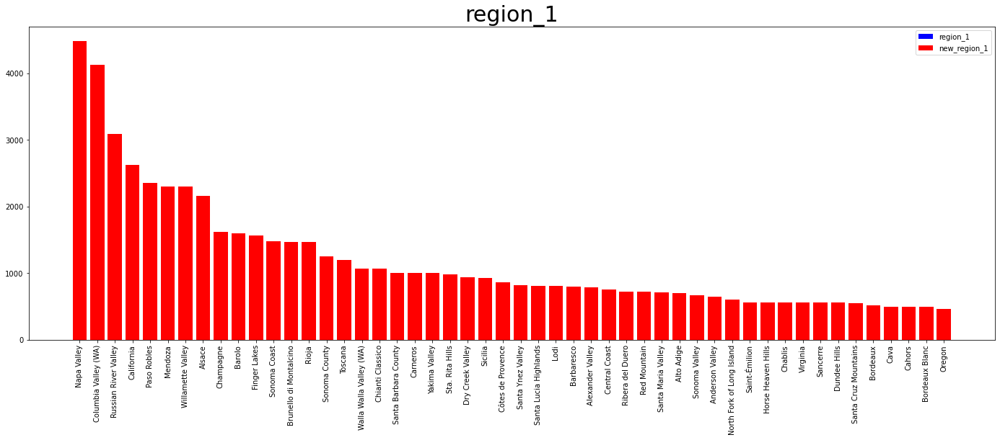

...

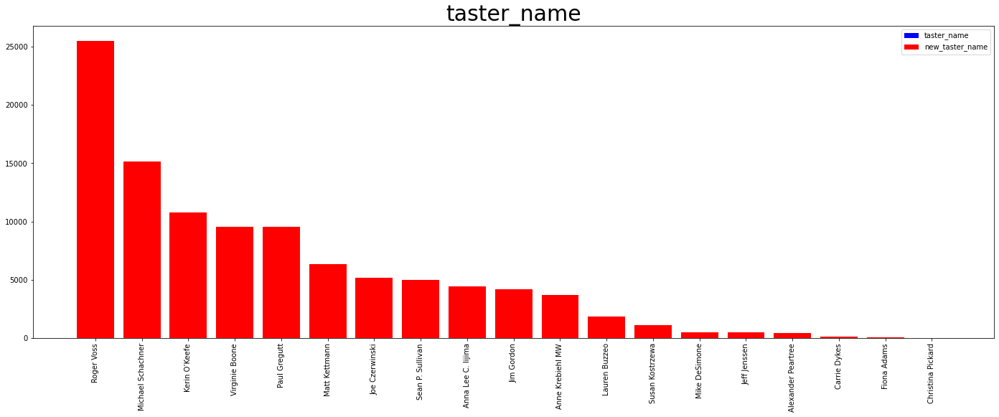

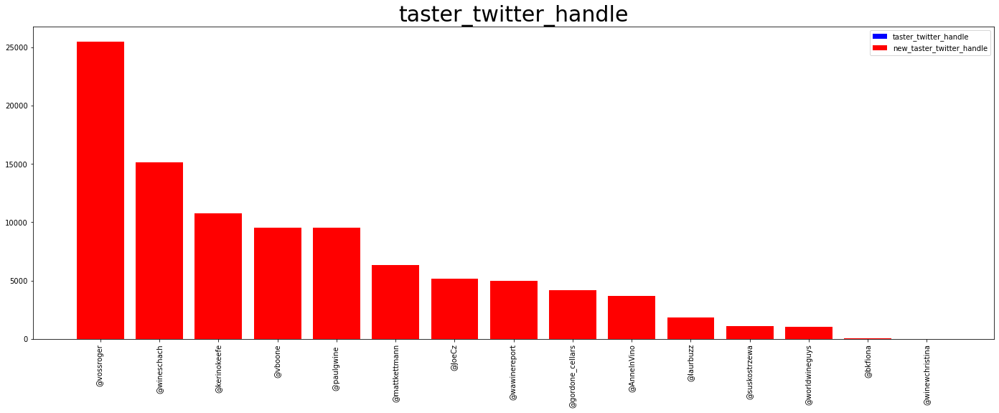

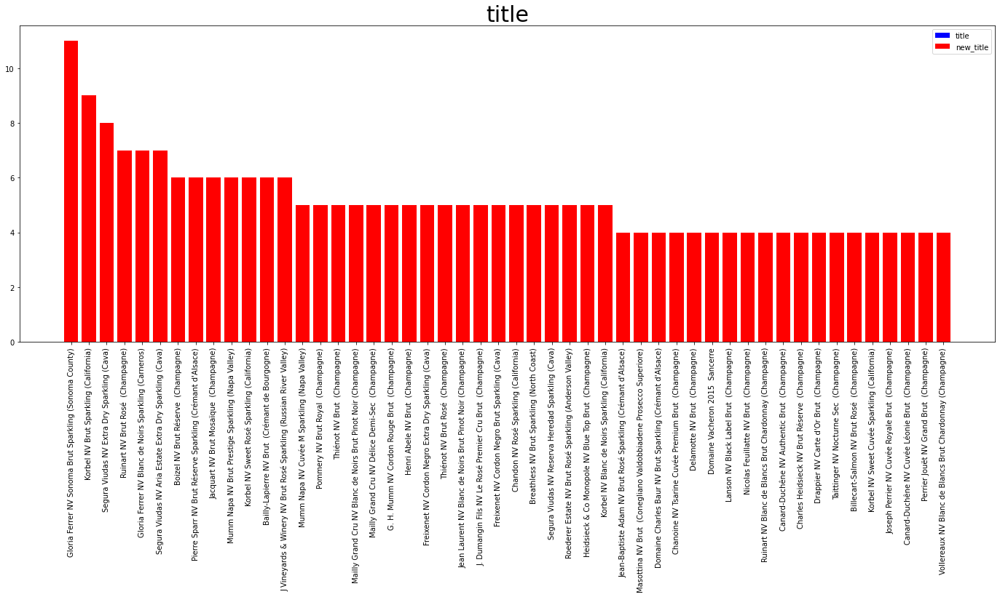

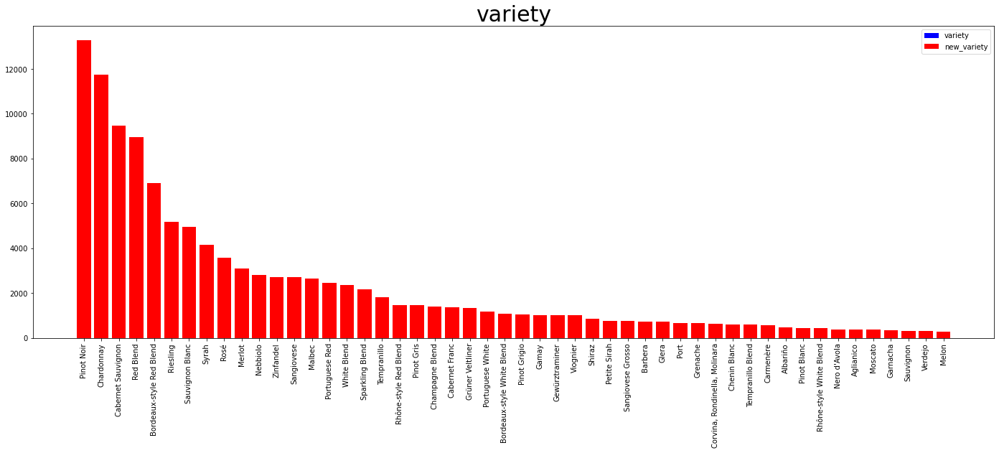

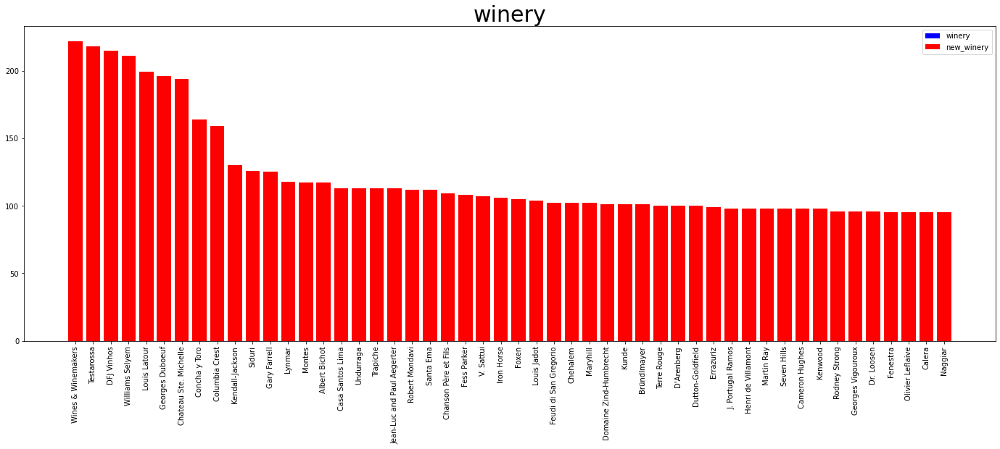

descriptive statistics (points):
Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000
Missing: 0

 new Min: 80.0000	Q1(25%): 86.0000 	Q2(50%): 88.0000 	Q3(75%): 91.0000 	Max: 100.0000 
 new Missing: 0 

descriptive statistics (price):
Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000
Missing: 8996

 new Min: 4.0000	Q1(25%): 17.0000 	Q2(50%): 25.0000 	Q3(75%): 42.0000 	Max: 3300.0000 
 new Missing: 8946 



C:\Users\sure\Anaconda3\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


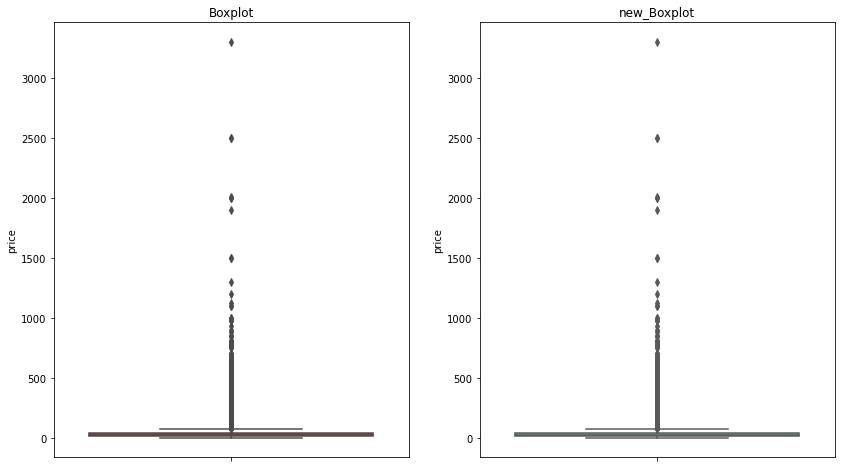

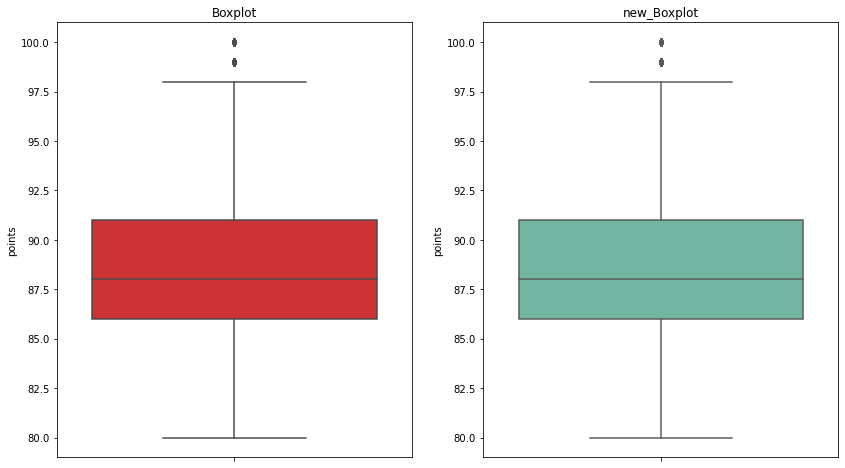

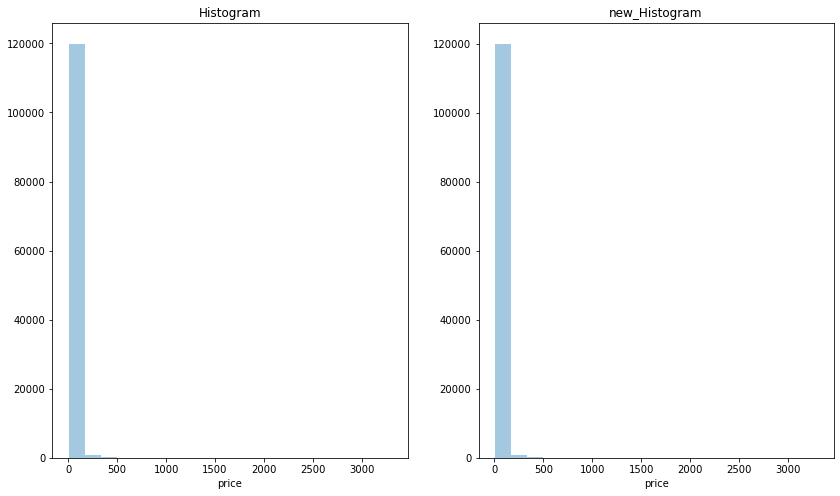

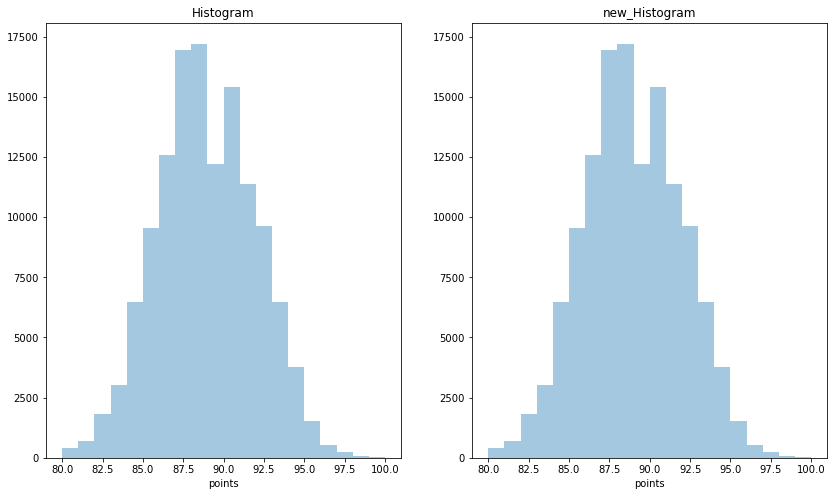

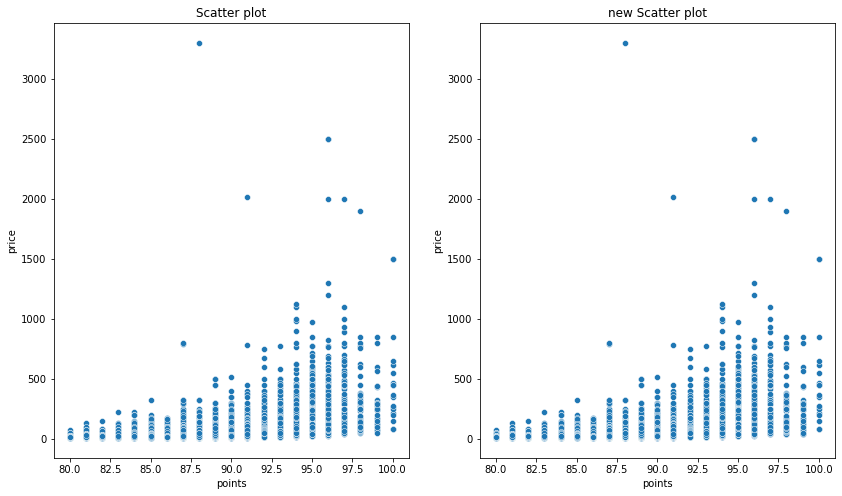

In [21]:
obj130k=obj_corr_fill(winemag130k,numerical_index=numerical_index,k=10)
columns_info(winemag130k,show_shape=True,new_df=obj130k)
nominal_summary(winemag130k,nominal_index=nominal_index,head_n=50,new_df=obj130k)
numerical_summary(winemag130k,numerical_index=numerical_index,new_df=obj130k)
viz_pairs(winemag130k,xlabel='points',ylabel='price',bins=20,new_df=obj130k)

## 数据集2-Oakland Crime Statistics 2011 to 2016
<p>
Oakland Crime Statistics 2011 to 2016.
</p>
<p>* records-for-2011.csv contains 12 columns and 18k rows of crime.</p>
<p>* records-for-2012.csv contains 12 columns and 18k rows of crime.</p>
<p>* records-for-2013.csv contains 12 columns and 18k rows of crime.</p>
<p>* records-for-2014.csv contains 12 columns and 18k rows of crime.</p>
<p>* records-for-2015.csv contains 12 columns and 18k rows of crime.</p>
<p>* records-for-2016.csv contains 12 columns and 18k rows of crime.</p>

## records-for-2011.csv
### 1、数据可视化和摘要

In [23]:
crime_reviews_dir = "crime"
crime2011=pd.read_csv(crime_reviews_dir+"/records-for-2011.csv",sep=',',header='infer',index_col=0)

In [24]:
columns_info(crime2011)

<class 'pandas.core.frame.DataFrame'>
Index: 180016 entries, OP to nan
Data columns (total 9 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Create Time                180015 non-null  object 
 1   Location                   180016 non-null  object 
 2   Area Id                    179112 non-null  float64
 3   Beat                       179496 non-null  object 
 4   Priority                   180015 non-null  float64
 5   Incident Type Id           180015 non-null  object 
 6   Incident Type Description  180015 non-null  object 
 7   Event Number               180015 non-null  object 
 8   Closed Time                180009 non-null  object 
dtypes: float64(2), object(7)
memory usage: 13.7+ MB
None
(180016, 9)


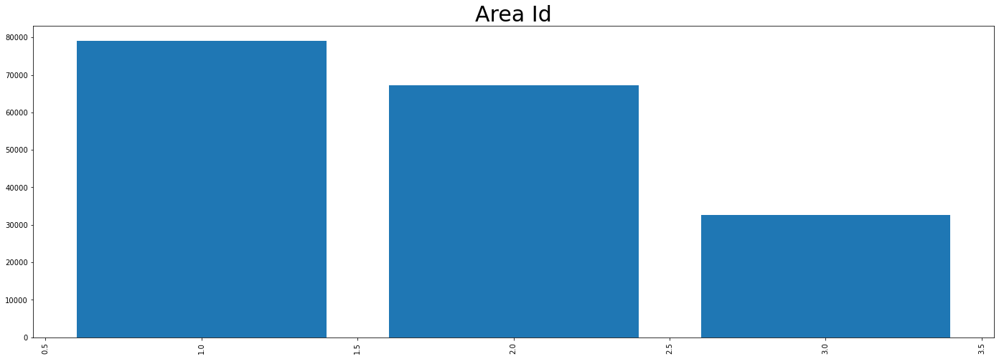

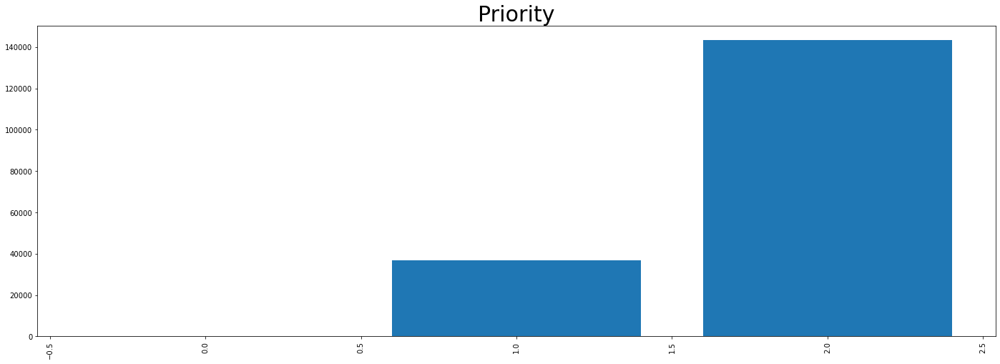

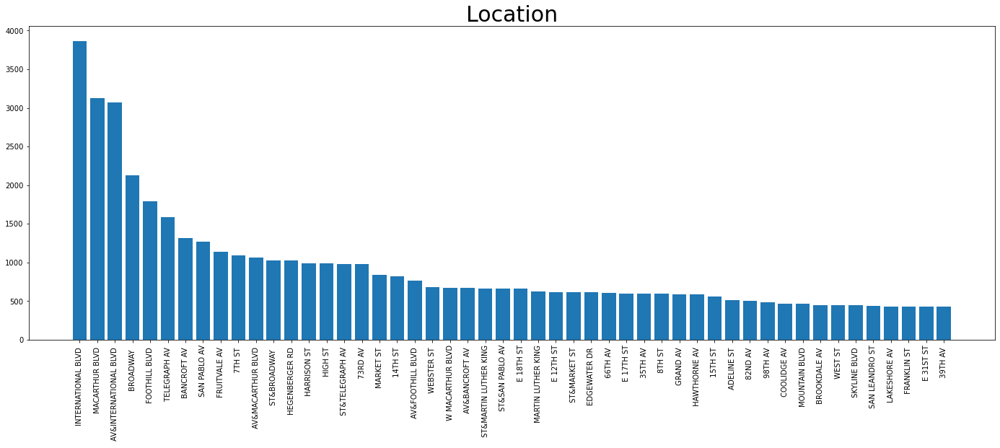

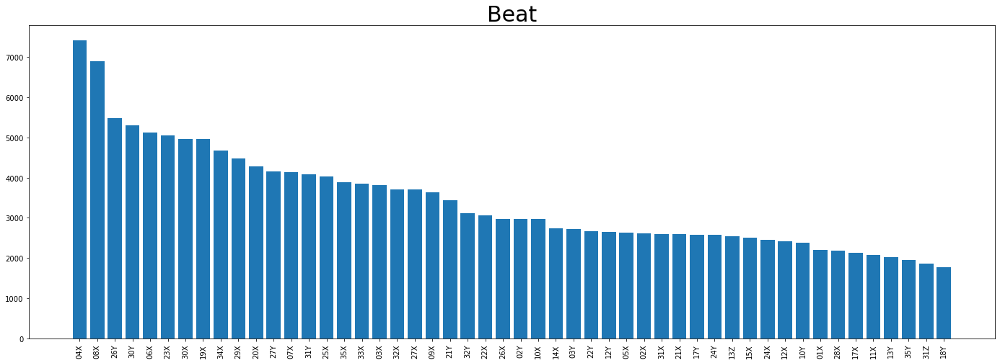

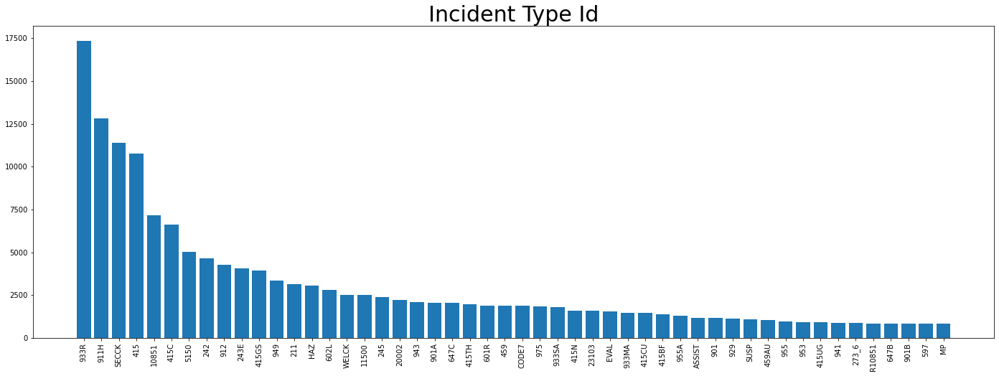

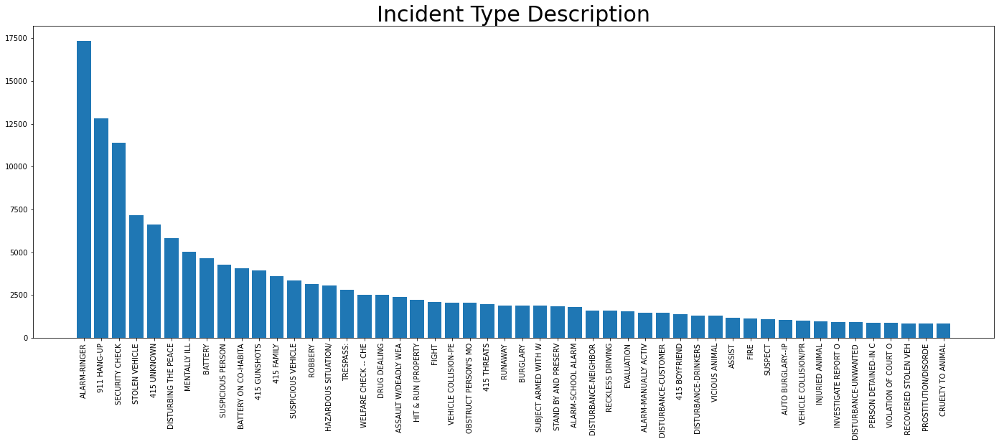

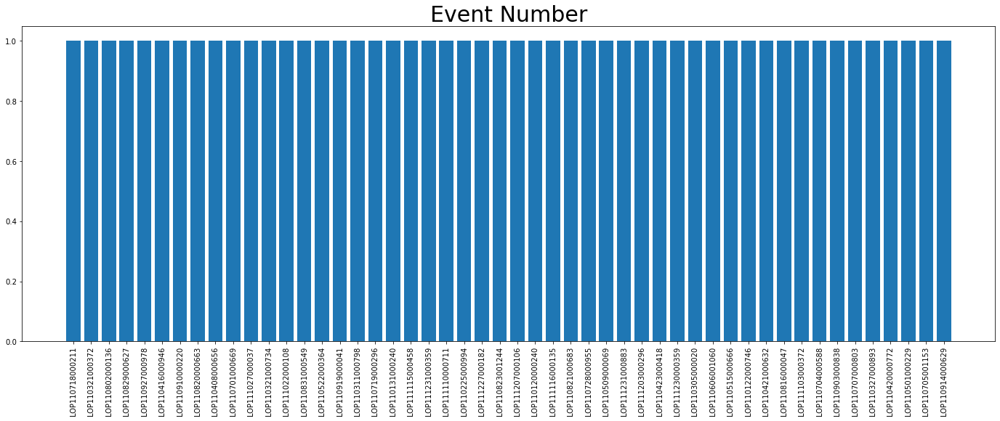

In [32]:
# 都是标称属性????两个时间怎么办
nominal_index = ['Area Id','Priority', 'Location', 'Beat', 'Incident Type Id', 'Incident Type Description', 'Event Number']
# 数值属性
#numerical_index = ['Create Time', 'Closed Time']
nominal_summary(crime2011,new_df=None,nominal_index=nominal_index,head_n=50)
#numerical_summary(crime2011,new_df=None,numerical_index=numerical_index)
#viz_pairs(crime2011,xlabel='Create Time',ylabel='Closed Time',bins=20,new_df=None)

### 2、数据缺失的处理

#### （1）将缺失部分剔除

<class 'pandas.core.frame.DataFrame'>
Index: 180016 entries, OP to nan
Data columns (total 9 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Create Time                180015 non-null  object 
 1   Location                   180016 non-null  object 
 2   Area Id                    179112 non-null  float64
 3   Beat                       179496 non-null  object 
 4   Priority                   180015 non-null  float64
 5   Incident Type Id           180015 non-null  object 
 6   Incident Type Description  180015 non-null  object 
 7   Event Number               180015 non-null  object 
 8   Closed Time                180009 non-null  object 
dtypes: float64(2), object(7)
memory usage: 13.7+ MB
None
(180016, 9)

<class 'pandas.core.frame.DataFrame'>
Index: 178771 entries, OP to OP
Data columns (total 9 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------

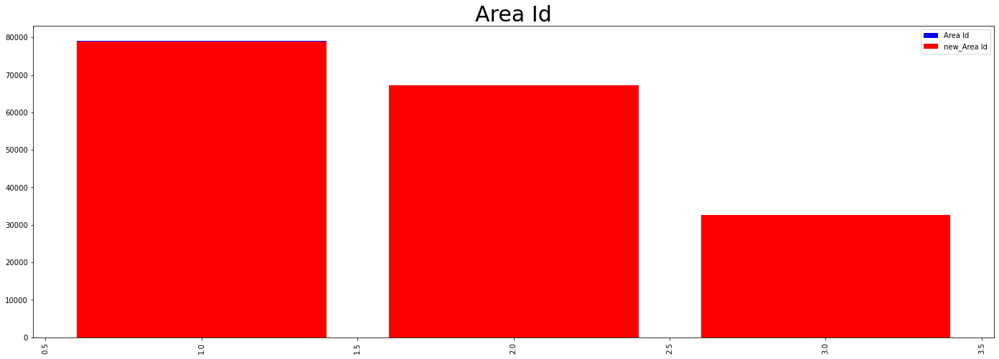

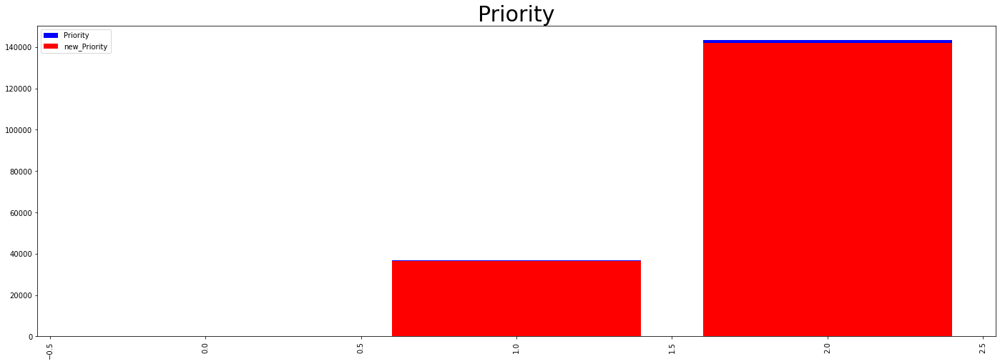

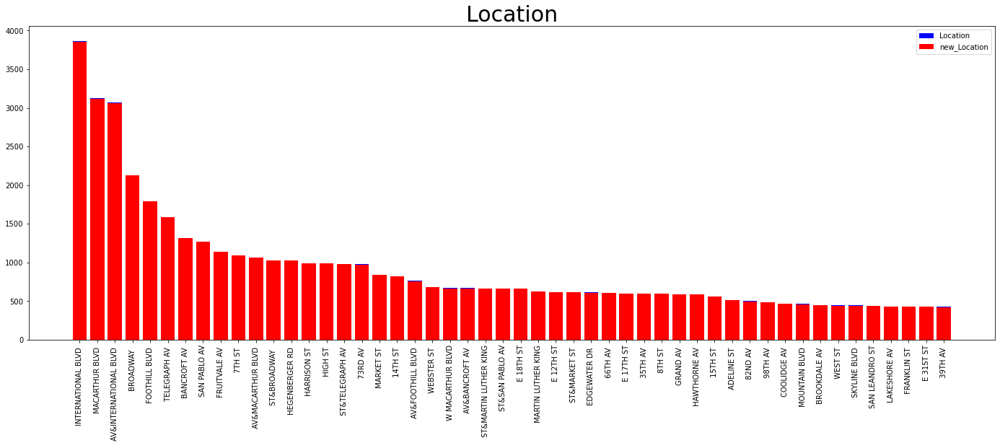

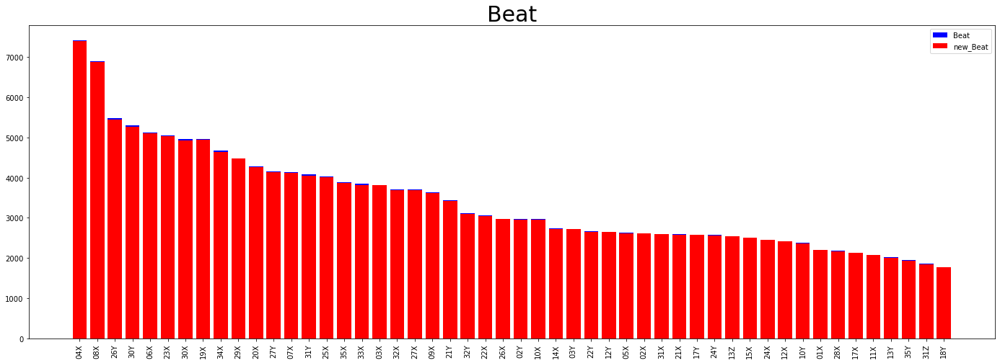

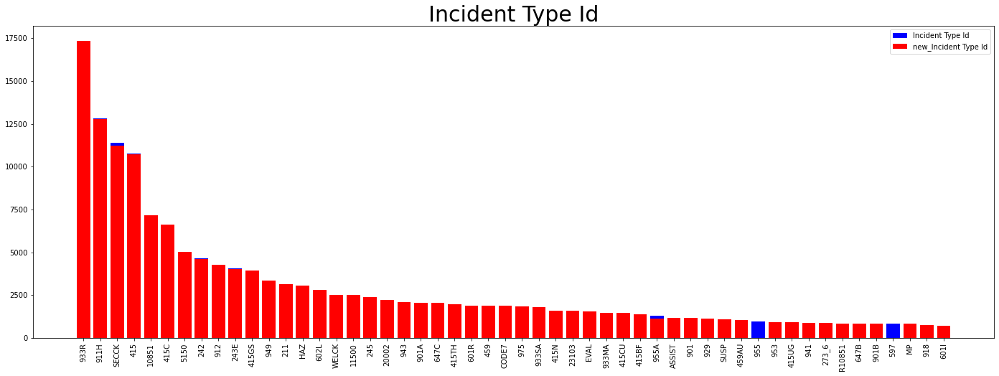

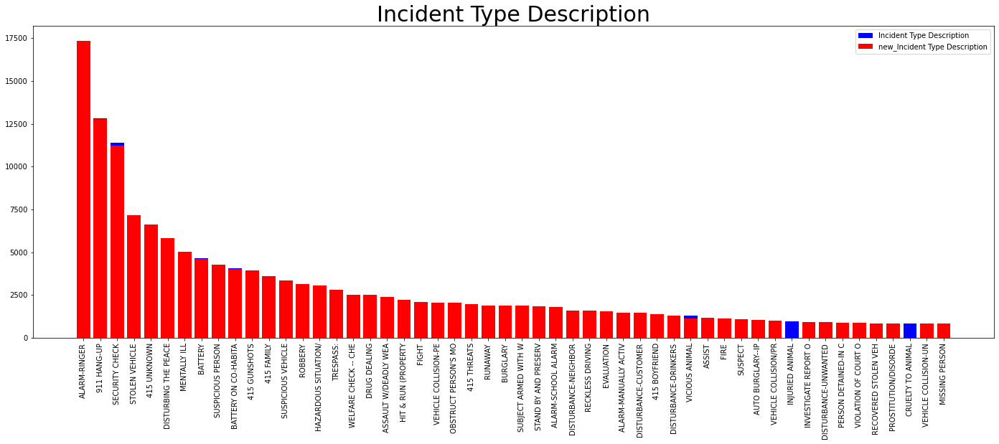

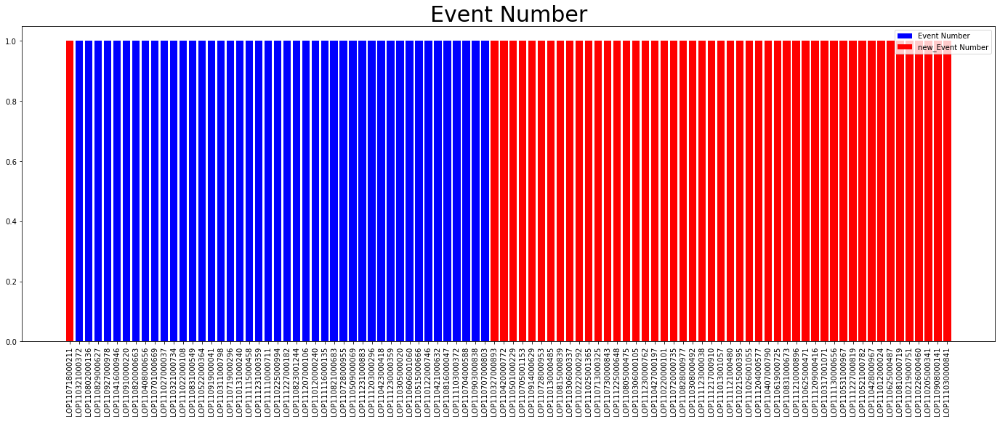

In [34]:
dw2011=miss_drop(crime2011)
columns_info(crime2011,show_shape=True,new_df=dw2011)
nominal_summary(crime2011,nominal_index=nominal_index,head_n=50,new_df=dw2011)
#numerical_summary(crime2011,numerical_index=numerical_index,new_df=dw2011)
#viz_pairs(crime2011,xlabel='Create Time',ylabel='Closed Time',bins=20,new_df=dw2011)

#### （2）用最高频率值来填补缺失值

<class 'pandas.core.frame.DataFrame'>
Index: 180016 entries, OP to nan
Data columns (total 9 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Create Time                180015 non-null  object 
 1   Location                   180016 non-null  object 
 2   Area Id                    179112 non-null  float64
 3   Beat                       179496 non-null  object 
 4   Priority                   180015 non-null  float64
 5   Incident Type Id           180015 non-null  object 
 6   Incident Type Description  180015 non-null  object 
 7   Event Number               180015 non-null  object 
 8   Closed Time                180009 non-null  object 
dtypes: float64(2), object(7)
memory usage: 13.7+ MB
None
(180016, 9)

<class 'pandas.core.frame.DataFrame'>
Index: 180016 entries, OP to nan
Data columns (total 9 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     -------

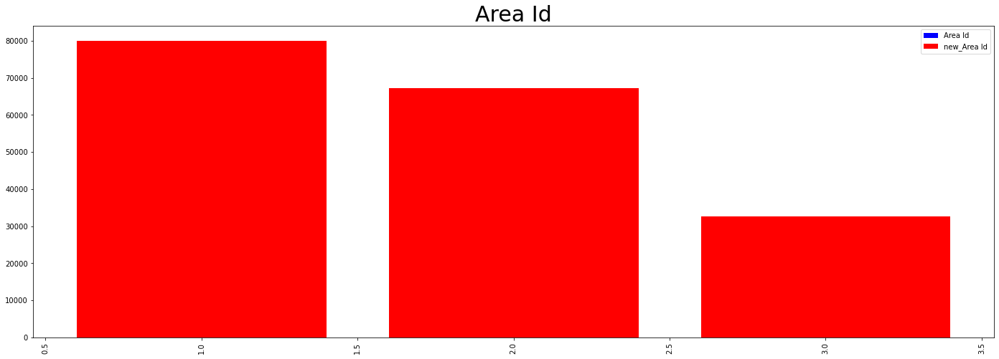

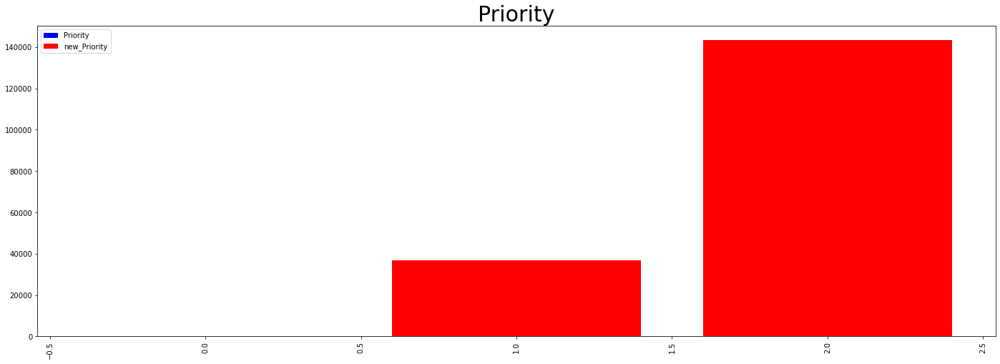

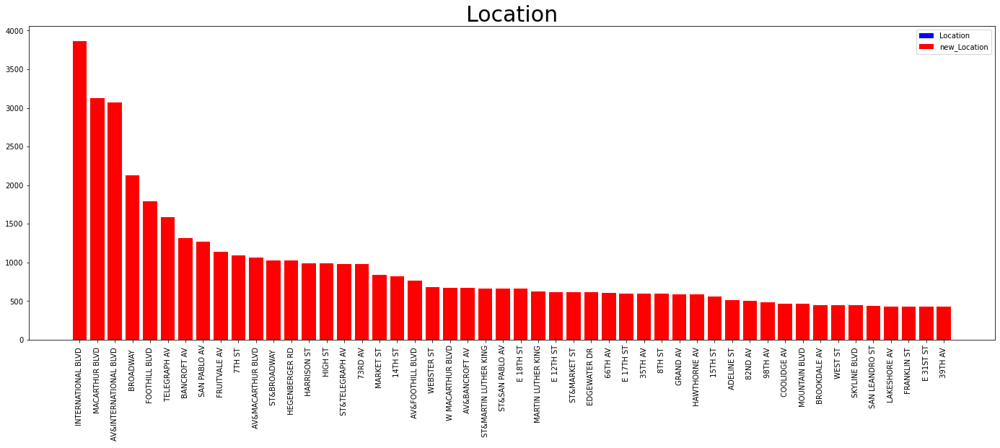

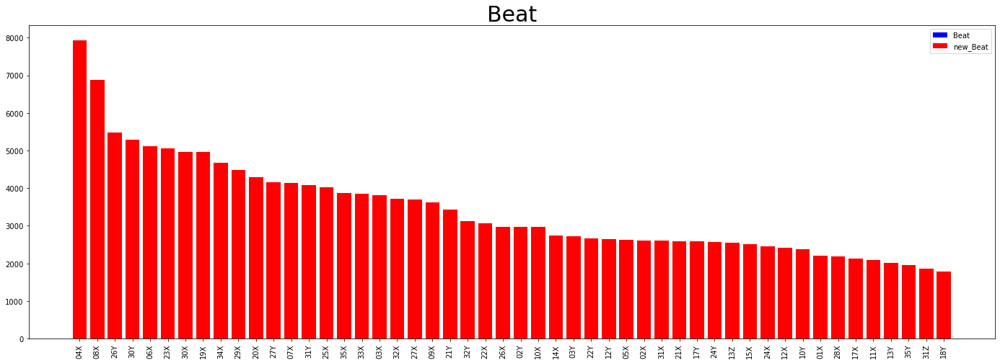

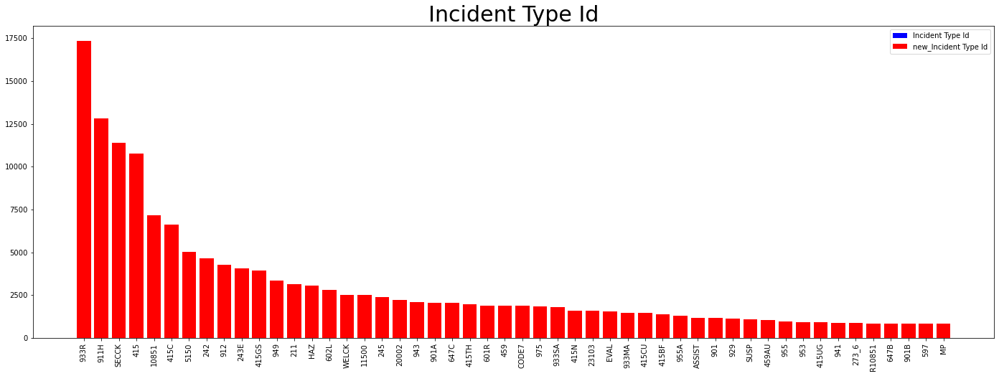

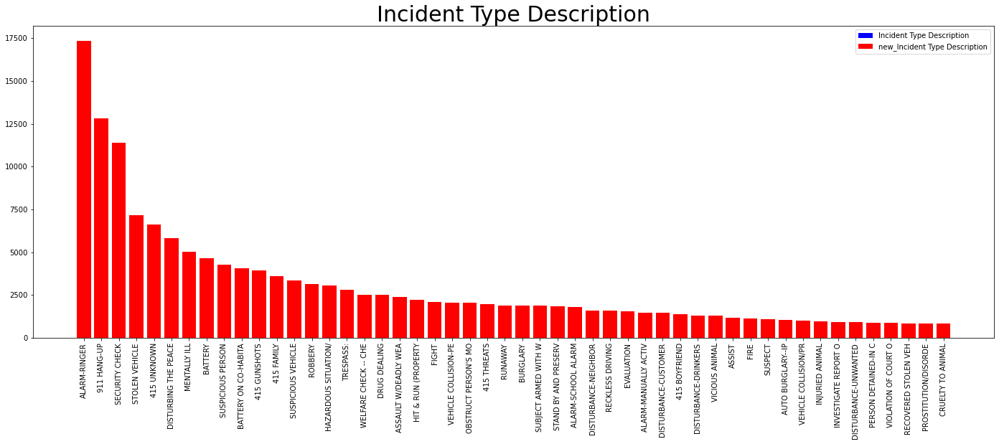

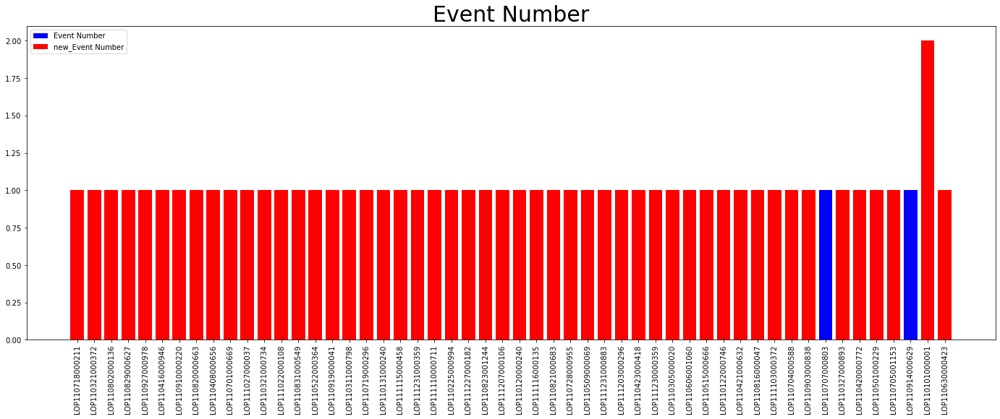

In [35]:
md2011=miss_mode_fill(crime2011)
columns_info(crime2011,show_shape=True,new_df=md2011)
nominal_summary(crime2011,nominal_index=nominal_index,head_n=50,new_df=md2011)
#numerical_summary(crime2011,numerical_index=numerical_index,new_df=md2011)
#viz_pairs(crime2011,xlabel='points',ylabel='price',bins=20,new_df=md2011)

#### （3）通过属性的相关关系来填补缺失值

<class 'pandas.core.frame.DataFrame'>
Index: 180016 entries, OP to nan
Data columns (total 9 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Create Time                180015 non-null  object 
 1   Location                   180016 non-null  object 
 2   Area Id                    179112 non-null  float64
 3   Beat                       179496 non-null  object 
 4   Priority                   180015 non-null  float64
 5   Incident Type Id           180015 non-null  object 
 6   Incident Type Description  180015 non-null  object 
 7   Event Number               180015 non-null  object 
 8   Closed Time                180009 non-null  object 
dtypes: float64(2), object(7)
memory usage: 13.7+ MB
None
(180016, 9)

<class 'pandas.core.frame.DataFrame'>
Index: 180016 entries, OP to nan
Data columns (total 9 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     -------

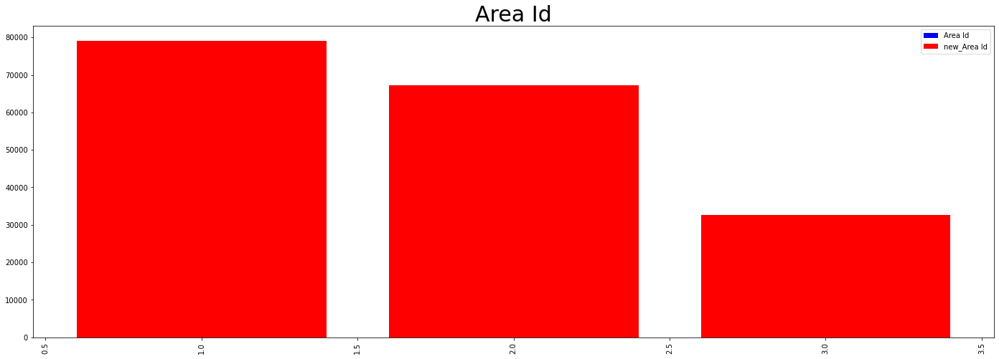

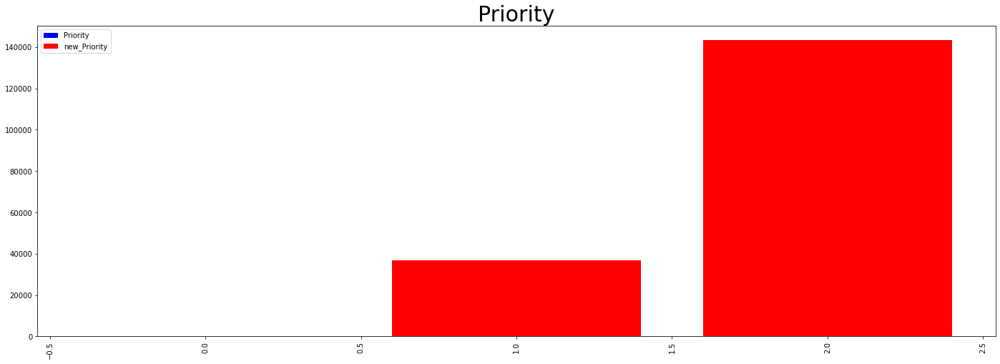

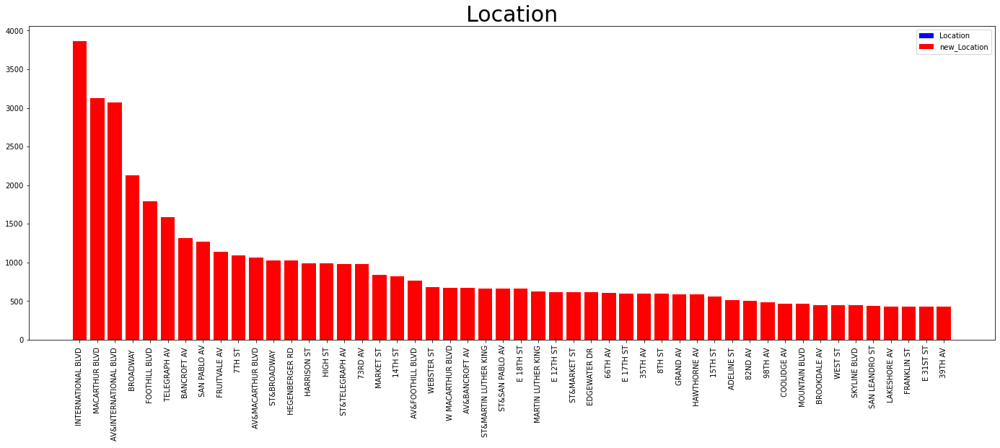

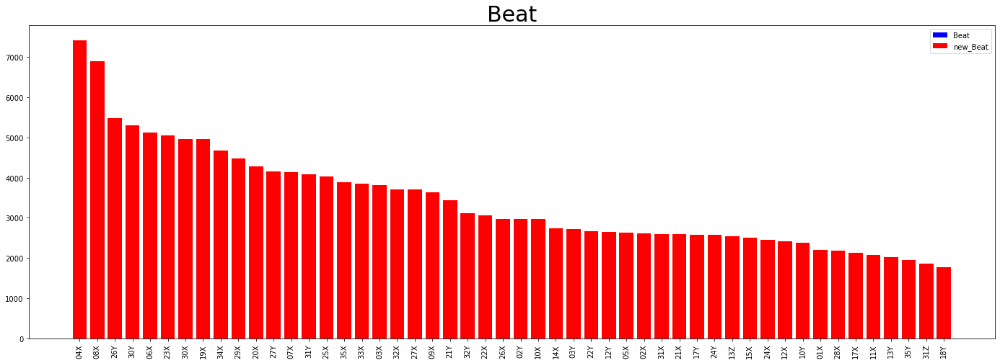

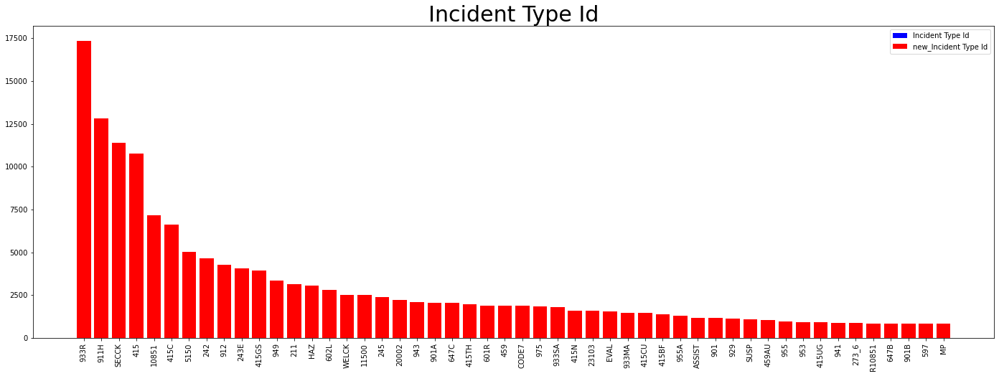

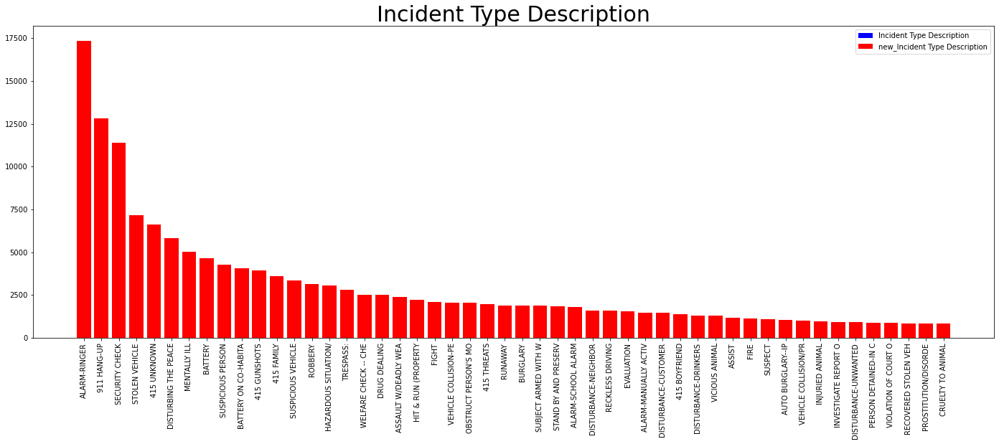

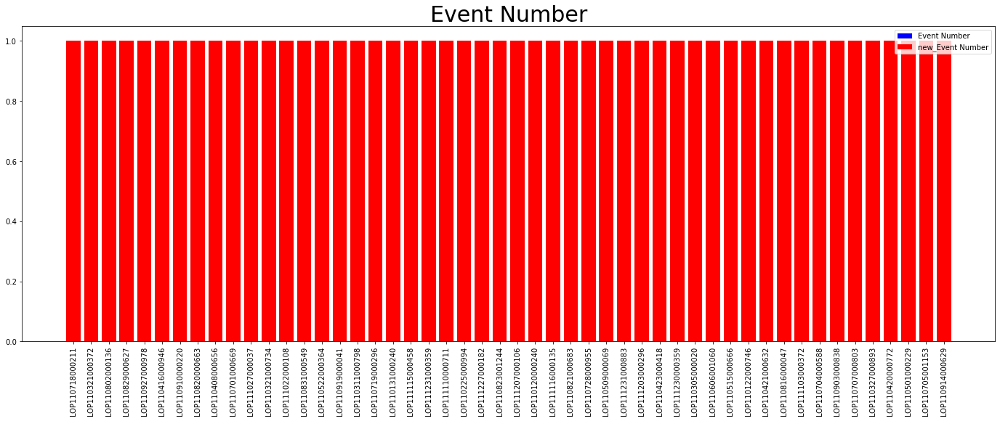

In [37]:
miss_index=['Area Id','Beat','Closed Time ']
comp_index=['Create Time','Location','Priority','Incident Type Id','Incident Type Description','Event Number']
att150k=attr_corr_fill(crime2011,miss_index=miss_index,complete_index=comp_index)
columns_info(crime2011,show_shape=True,new_df=att150k)
nominal_summary(crime2011,nominal_index=nominal_index,head_n=50,new_df=att150k)
#numerical_summary(crime2011,numerical_index=numerical_index,new_df=att150k)
#viz_pairs(crime2011,xlabel='points',ylabel='price',bins=20,new_df=att150k)

#### （4）通过数据对象之间的相似性来填补缺失值

In [39]:
#obj150k=obj_corr_fill(crime2011,numerical_index=numerical_index,k=10)
#columns_info(crime2011,show_shape=True,new_df=obj150k)
#nominal_summary(crime2011,nominal_index=nominal_index,head_n=50,new_df=obj150k)
#numerical_summary(crime2011,numerical_index=numerical_index,new_df=obj150k)
#viz_pairs(crime2011,xlabel='points',ylabel='price',bins=20,new_df=obj150k)